# Load in packages

In [5]:
import os
import sys
import matplotlib.pyplot as plt
import numpy as np

import scipy
import anndata
import random
import pandas as pd
import warnings
import matplotlib.patches as mpatches
import scanpy as sc

import csv
import concurrent
import ast
import matplotlib as mpl
import matplotlib.patches as mpatches
from scipy import stats

from collections import OrderedDict
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from sklearn.preprocessing import scale

from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NeighborhoodComponentsAnalysis
from matplotlib import cm
from matplotlib.lines import Line2D

from scipy.stats import zscore
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist, squareform

import seaborn as sns

def nd(arr):
    return np.asarray(arr).reshape(-1)

# Violin plot functions

def vplot(y, ax):
    parts = ax.violinplot(
        y, showmeans=False, showmedians=False,
        showextrema=False)

    mean = y.mean()
    ax.scatter(1, mean, zorder=10, color="white")
    
    x = np.random.normal(1, 0.04, size=len(y))
    ax.scatter(x, y, color="k", s=1)
    
    for pc in parts['bodies']:
        pc.set_facecolor('#D43F3A')
        pc.set_edgecolor('black')
        pc.set_alpha(1)
    
    ax.set_xticks([1])
    ax.set_xticklabels([""])
    return ax

warnings.filterwarnings('ignore')

fsize=20
plt.rcParams.update({'font.size': fsize})



In [6]:
from platform import python_version

print(python_version())


3.10.16


In [7]:
!ls melanoma_distinguish/counts_unfiltered/

cells_x_tcc.barcodes.txt  cells_x_tcc.ec.txt  cells_x_tcc.mtx


In [8]:
import kb_python.utils as kb_utils

adata = kb_utils.import_matrix_as_anndata("mcsc_melanoma_klue_out/kb_out/counts_unfiltered/cells_x_tcc.mtx",
                                          "mcsc_melanoma_klue_out/kb_out/counts_unfiltered/cells_x_tcc.barcodes.txt",
                                          "mcsc_melanoma_klue_out/kb_out/counts_unfiltered/cells_x_tcc.ec.txt")



In [9]:
#adata.obs["sub_index"] = adata.obs.index.to_series().str.slice(27, 30)

In [10]:
data = adata.copy()

# Load in the "GeneFull" (i.e. exon+intron quantification) AnnData from non-species-specific-alignment (we call this the "Total" AnnData)

In [11]:
# data = anndata.read_h5ad("./out_dir/workup/results/anndatas/merged/starsolo_run_1/GeneFull/adata.h5ad")

In [12]:
# data # Initial matrix dimensions

In [13]:
# Which RTBCs to select for? (can omit this block if want to use all RTBCs by default
# filter_for_tags = "RTBC1,RTBC2,RTBC3,RTBC4,RTBC5,RTBC6"
# filter_for_tags_final = ['[' + item + ']' for item in filter_for_tags.split(',')]
# if filter_for_tags.strip():
#     final = []
#     for tag in filter_for_tags_final:
#         final.extend([x for x in list(np.array(data.obs['id'])) if tag in x])
#    data = data[data.obs['id'].isin(final),:]

In [14]:
data.var

,gene_id
0,"1617,1619,1620,1621,1622,18416,99359"
1,"1617,1619,1620,1621,1622,18416,99359,99609"
2,"1617,1619,1620,1621,1622,18416,99359,138054"
3,"1617,1619,1620,1621,1622,18416,43443,99359,996..."
4,"1617,1619,1620,1621,1622,18416,99359,647838,64..."
...,...
2906927,"141546,141547,141549,141562"
2906928,"16583,16584,16586,16587,16589,16590"
2906929,"19480,19481,19482,980212,980213,980214,5446547..."
2906930,"37448,78186,78189,78190,92765,134760,145611"


In [15]:
data.var

,gene_id
0,"1617,1619,1620,1621,1622,18416,99359"
1,"1617,1619,1620,1621,1622,18416,99359,99609"
2,"1617,1619,1620,1621,1622,18416,99359,138054"
3,"1617,1619,1620,1621,1622,18416,43443,99359,996..."
4,"1617,1619,1620,1621,1622,18416,99359,647838,64..."
...,...
2906927,"141546,141547,141549,141562"
2906928,"16583,16584,16586,16587,16589,16590"
2906929,"19480,19481,19482,980212,980213,980214,5446547..."
2906930,"37448,78186,78189,78190,92765,134760,145611"


In [16]:
def contains_large_number(gene_id_str):
    numbers = map(int, gene_id_str.split(','))  # Convert to integers
    return any(num >= 149482 for num in numbers)

# Apply function to filter rows
# filtered_var = adata.var[adata.var['gene_id'].apply(contains_large_number)]

# filtered_adata = adata[:, adata.var['gene_id'].apply(contains_large_number)]


In [17]:
data

AnnData object with n_obs × n_vars = 350806 × 2906932
    var: 'gene_id'

In [18]:
# filtered_adata

In [19]:
# data = filtered_adata.copy()
# adata = filtered_adata.copy()

# Make plots

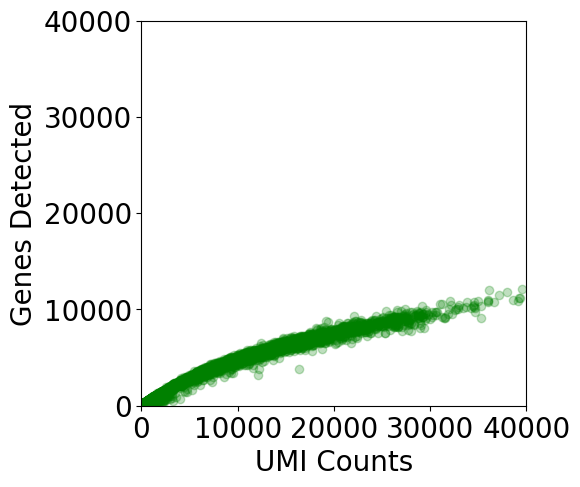

In [20]:
fig, ax = plt.subplots(figsize=(5, 5))
x = nd(data.X.sum(axis=1))
y = nd(np.sum(data.X>0, axis=1))
ax.scatter(x, y, color="green", alpha=0.25)
ax.set_xlabel("UMI Counts")
ax.set_ylabel("Genes Detected")
ax.set_xlim(0,40000)
ax.set_ylim(0,40000)
ax.set_aspect('equal', adjustable='box')

In [21]:
#fig, ax = plt.subplots(figsize=(5*3,5), ncols=3)
#x1 = data.obs["n_genes"]
#x2 = nd(data.X.sum(axis=1))
#x3 = data.obs["percent_mito"]
#vplot(x1, ax[0])
#vplot(x2, ax[1])
#vplot(x3, ax[2])
#ax[0].set_ylabel("Genes detected")
#ax[1].set_ylabel("UMI counts")
#ax[2].set_ylabel("Percent Mito")
#plt.tight_layout()

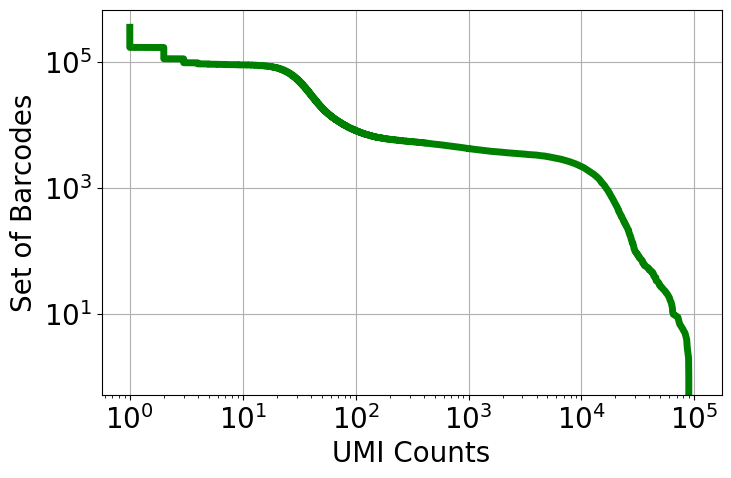

In [22]:
knee = np.sort(nd(data.X.sum(axis=1)))[::-1]

fig, ax = plt.subplots(figsize=(8, 5))

x = knee
y = range(len(knee))

ax.loglog(x, y, linewidth=5, color="g")

ax.set_xlabel("UMI Counts")
ax.set_ylabel("Set of Barcodes")
ax.grid()

In [23]:
data # Print matrix dimensions (number of barcodes x number of genes)

AnnData object with n_obs × n_vars = 350806 × 2906932
    var: 'gene_id'

In [24]:
data.obs["cell_counts"] = data.X.sum(axis=1)
data.var["gene_counts"] = nd(data.X.sum(axis=0))
data.obs["n_genes"] = nd((data.X>0).sum(axis=1))
data.var["n_cells"] = nd((data.X>0).sum(axis=0))

# Impose filtering thresholds (and replot)

In [25]:
adata = data.copy()
umi_threshold_min = 5000
umi_threshold_max = 2000000000
mito_threshold = 1000 # Filter by max mitochondrial content (%); 100 = no filtering
# UMI filtering:
adata.obs["pass_count_filter"] = (adata.obs["cell_counts"] >= umi_threshold_min) & (adata.obs["cell_counts"] < umi_threshold_max)
pass_count_filter = adata.obs["pass_count_filter"]
cell_mask = adata.obs["pass_count_filter"].values
adata = adata[cell_mask, :]
# Mitochondrial percentage filtering
# mask = np.logical_or((adata.obs.percent_mito <= mito_threshold).values, (adata.obs.percent_mito <= mito_threshold).values)
# adata = adata[mask, :]

In [26]:
#gene_cell_threshold = 35  # Adjust as needed

# Gene filtering based on number of cells the gene is expressed in
#gene_mask = (data.X > 0).sum(axis=0) >= gene_cell_threshold  # Count cells per gene
#gene_mask = np.array(gene_mask).flatten()  # Ensure it's a 1D array

# Apply gene filtering
#adata = data[:, gene_mask]



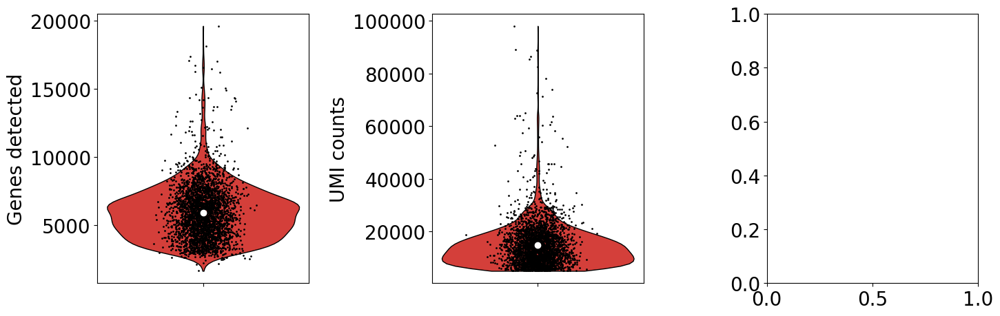

In [27]:
fig, ax = plt.subplots(figsize=(5*3,5), ncols=3)
x1 = adata.obs["n_genes"]
x2 = nd(adata.X.sum(axis=1))
vplot(x1, ax[0])
vplot(x2, ax[1])
ax[0].set_ylabel("Genes detected")
ax[1].set_ylabel("UMI counts")
plt.tight_layout()

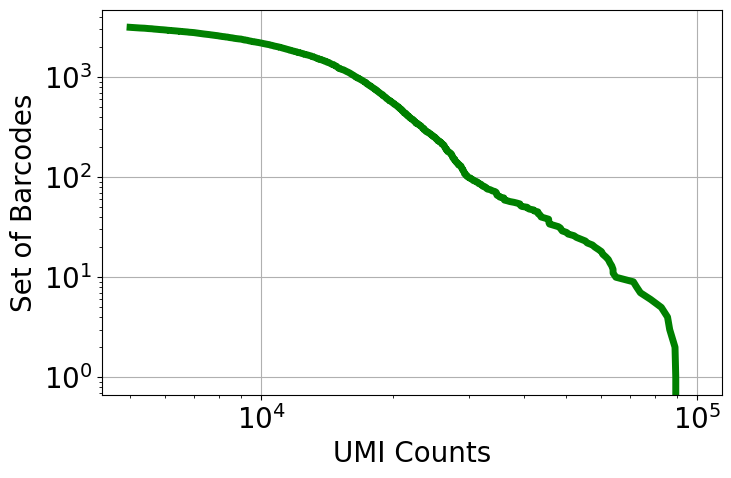

In [28]:
knee = np.sort(nd(adata.X.sum(axis=1)))[::-1]

fig, ax = plt.subplots(figsize=(8, 5))

x = knee
y = range(len(knee))

ax.loglog(x, y, linewidth=5, color="g")

ax.set_xlabel("UMI Counts")
ax.set_ylabel("Set of Barcodes")
ax.grid()

In [29]:
adata

View of AnnData object with n_obs × n_vars = 3139 × 2906932
    obs: 'cell_counts', 'n_genes', 'pass_count_filter'
    var: 'gene_id', 'gene_counts', 'n_cells'

In [30]:
pd.set_option('display.max_rows', 100)

In [31]:
adata.var[1:65]

,gene_id,gene_counts,n_cells
1,"1617,1619,1620,1621,1622,18416,99359,99609",57.0,57
2,"1617,1619,1620,1621,1622,18416,99359,138054",136.0,132
3,"1617,1619,1620,1621,1622,18416,43443,99359,996...",8.0,8
4,"1617,1619,1620,1621,1622,18416,99359,647838,64...",0.0,0
5,"1617,1619,1620,1621,1622,18416,43443,99359,99609",1.0,1
6,143323,8.0,8
7,"1617,1619,1620,1621,1622,18416,99359,706797,70...",0.0,0
8,"1617,1619,1620,1621,1622,18416,43443,99359,996...",21.0,21
9,"1617,1619,1620,1621,1622,18416,99359,4669784,4...",6.0,6
10,"1617,1619,1620,1621,1622,18416,99359,736169,73...",0.0,0


In [32]:
adata # Print matrix dimensions (number of barcodes x number of genes)

View of AnnData object with n_obs × n_vars = 3139 × 2906932
    obs: 'cell_counts', 'n_genes', 'pass_count_filter'
    var: 'gene_id', 'gene_counts', 'n_cells'

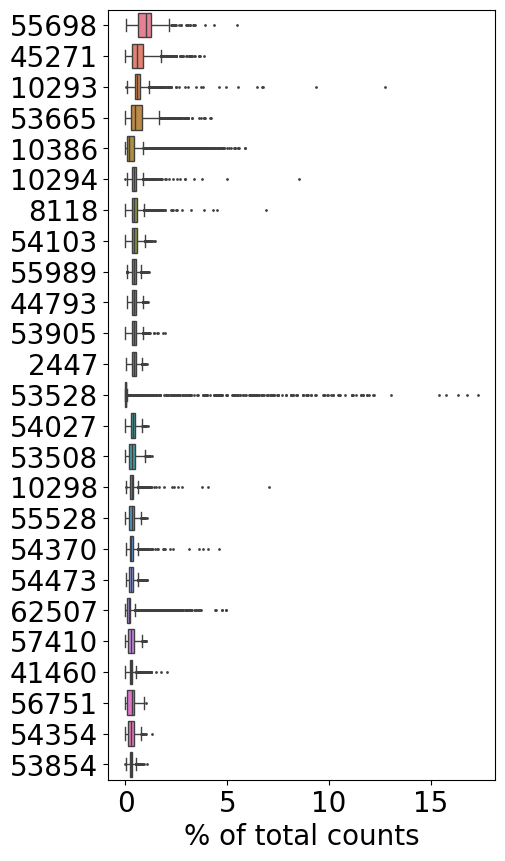

In [33]:
fig, ax = plt.subplots(figsize=(5, 10))
sc.pl.highest_expr_genes(adata, n_top=25, ax = ax)

In [34]:
data_backup = adata.copy()

In [35]:
sc.pp.normalize_total(adata, target_sum=1e4)


In [36]:
sc.pp.log1p(adata)


In [37]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

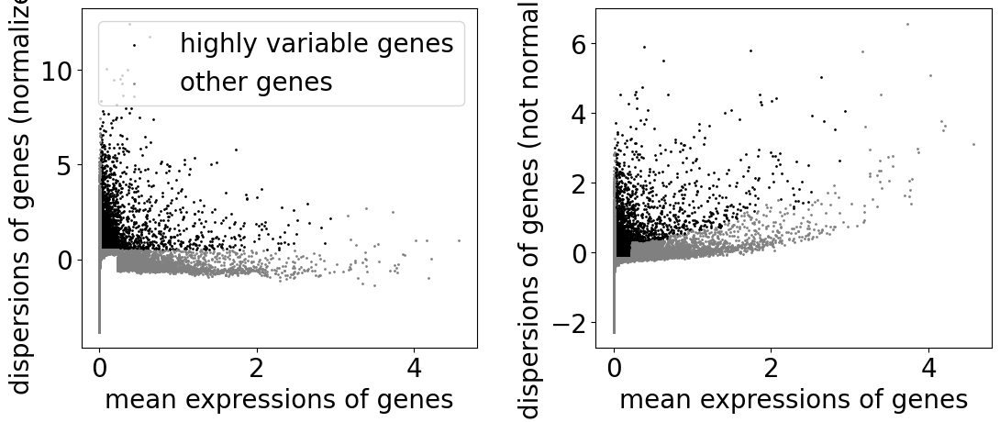

In [38]:
sc.pl.highly_variable_genes(adata)

In [39]:
adata = adata[:, adata.var.highly_variable]
sc.tl.leiden(
    adata,
    resolution=0.6,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)

In [40]:
sc.tl.pca(adata, svd_solver="arpack")

In [41]:
adata

AnnData object with n_obs × n_vars = 3139 × 21882
    obs: 'cell_counts', 'n_genes', 'pass_count_filter'
    var: 'gene_id', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

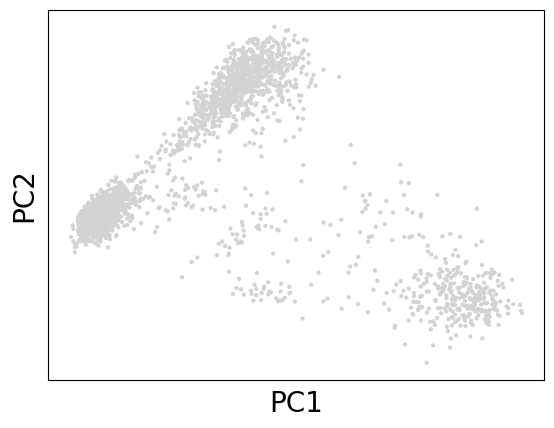

In [42]:
sc.pl.pca(adata)


In [43]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)


In [44]:
sc.tl.leiden(
    adata,
    resolution=0.6,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)

In [45]:
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata, init_pos='paga')

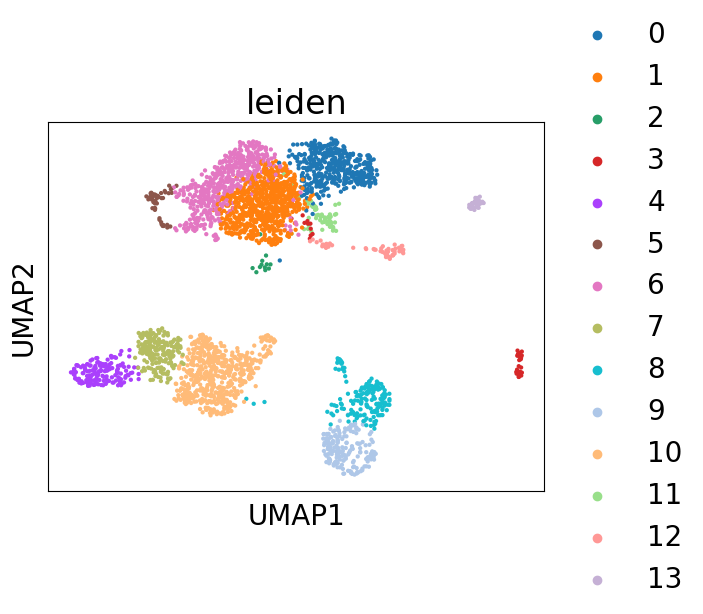

In [46]:
sc.pl.umap(adata, color=["leiden"])

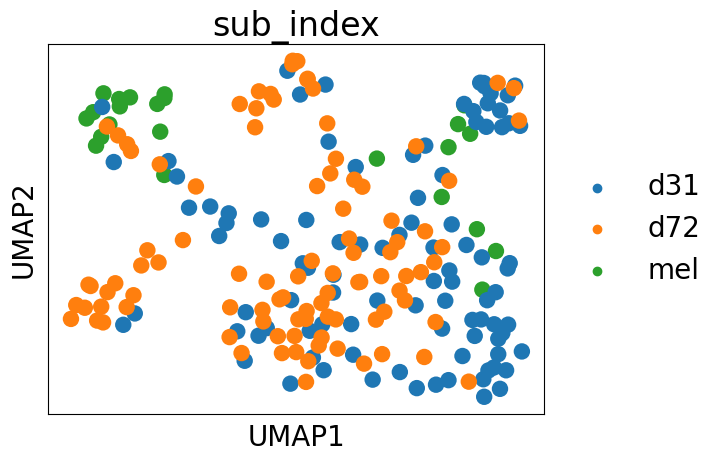

In [1001]:
# sc.pl.umap(adata, color=["sub_index"])

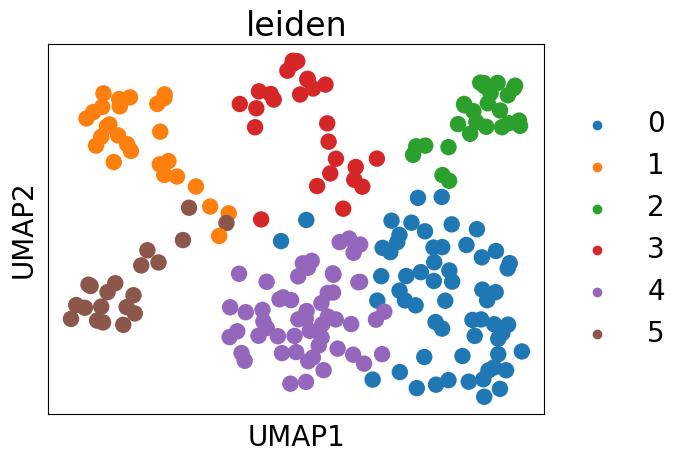

In [954]:
sc.pl.umap(adata, color=["leiden"])

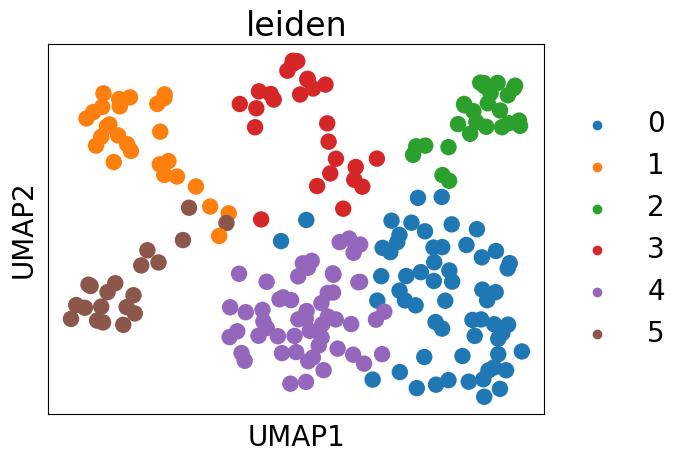

In [955]:
sc.pl.umap(adata, color=["leiden"])

In [956]:
adata.var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
0,"71889,71891,71894",8077.0,37,True,0.482493,2.048747,0.539968
1,74412,9644.0,155,True,2.765431,6.311406,1.913124
2,77745,4070.0,203,True,2.655460,4.420285,1.014347
4,11917,145.0,31,True,0.225342,2.688441,4.896196
5,"88822,88824",1502.0,14,True,0.131003,2.434860,4.721953
...,...,...,...,...,...,...,...
1901471,"136794,1026683",1.0,1,True,0.038059,2.121097,4.506357
1901472,123816,1.0,1,True,0.038059,2.121097,4.506357
1902091,"2632,4463751",2.0,1,True,0.017795,1.350734,3.977016
1902093,"30552,30553,30554,30555,30556,30557,30558,3055...",2.0,1,True,0.017795,1.350734,3.977016


In [47]:
txfile_name="mcsc_melanoma_klue_out/kb_out/transcripts.txt"
t2g_name="mouse_index_t2g.txt"

# Step 1: Load the transcripts file (each line is a transcript).
with open(txfile_name, "r") as f:
    transcripts = [line.strip() for line in f]

# Step 2: Load the transcript-to-gene mapping file.
# The file is assumed to be tab-separated with no header:
# column0: transcript, column1: gene name, column2: gene symbol.
t2g_df = pd.read_csv(t2g_name, sep="\t", header=None, usecols=range(3),
                     names=["transcript", "gene_name", "gene_symbol"])

# Step 3: Create a dictionary mapping transcript to gene symbol (or gene name if gene symbol is missing).
transcript_to_gene = {}
for _, row in t2g_df.iterrows():
    # Use gene_symbol if available; otherwise, use gene_name.
    gene = row["gene_symbol"] if pd.notnull(row["gene_symbol"]) and row["gene_symbol"] != "" else row["gene_name"]
    transcript_to_gene[row["transcript"]] = gene

# Function to convert a comma-separated list of indices to a comma-separated list of gene symbols.
def convert_gene_ids(gene_id_str):
    indices = gene_id_str.split(",")
    gene_list = []
    for idx in indices:
        idx = int(idx.strip())  # convert to integer (zero-indexed)
        transcript = transcripts[idx]
        gene = transcript_to_gene.get(transcript, "")  # default to empty string if not found
        gene_list.append(gene)
    return ",".join(list(set([x for x in gene_list if x])))

# Step 4: Apply the conversion to create a new column.
# Adjust adata.obs or adata.var depending on where your 'gene_id' column is stored.
adata.var["gene_symbols"] = adata.var["gene_id"].apply(convert_gene_ids)


In [755]:
umap_loaded = pd.read_csv("umap_coordinates.csv", index_col=0)

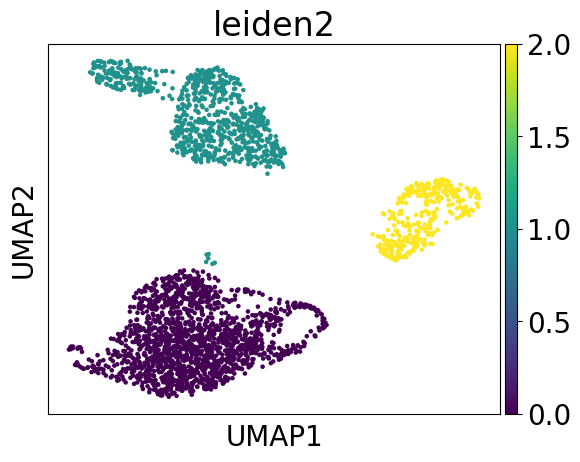

In [756]:
# --- Step 2: Load the file back ---
loaded_df = pd.read_csv("umap_leiden.csv", index_col=0)

# --- Step 3: Subset adata2 to only include cells common to loaded_df and adata2 ---
common_barcodes = loaded_df.index.intersection(adata.obs_names)
adata2_subset = adata[common_barcodes].copy()

# --- Step 4: Assign the UMAP coordinates from the loaded file to adata2_subset ---
# Ensure the order of barcodes matches by using .loc
adata2_subset.obsm["X_umap"] = loaded_df.loc[common_barcodes, ["UMAP1", "UMAP2"]].values

# --- Step 5: Add leiden cluster information as a new column in adata2_subset.obs ---
adata2_subset.obs["leiden2"] = loaded_df.loc[common_barcodes, "leiden"]

# --- Step 6: Plot the UMAP using adata2_subset with the new leiden annotation ---
sc.pl.umap(adata2_subset, color=["leiden2"])


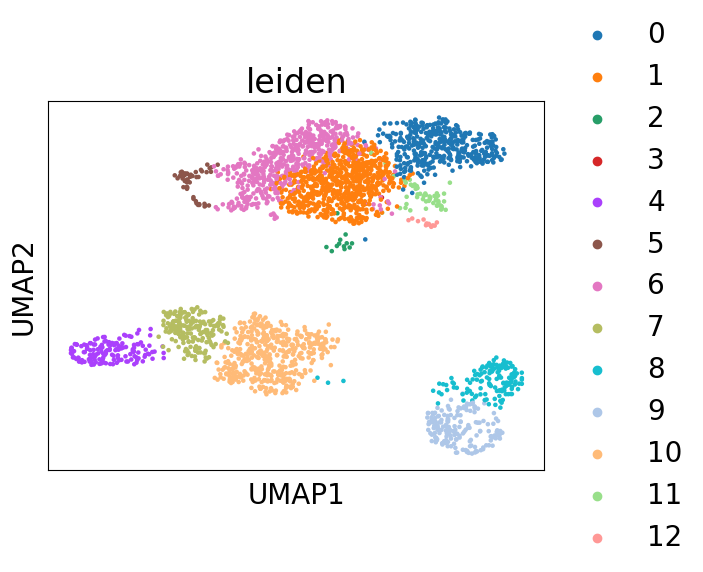

In [757]:
# --- Step 2: Load the file back ---
loaded_df = pd.read_csv("umap_leiden.csv", index_col=0)

# --- Step 3: Subset adata2 to only include cells common to loaded_df and adata2 ---
common_barcodes = loaded_df.index.intersection(adata.obs_names)
adata3_subset = adata[common_barcodes].copy()

# --- Step 5: Add leiden cluster information as a new column in adata2_subset.obs ---
adata3_subset.obs["leiden2"] = loaded_df.loc[common_barcodes, "leiden"]

# --- Step 6: Plot the UMAP using adata2_subset with the new leiden annotation ---
sc.pl.umap(adata3_subset, color=["leiden"])


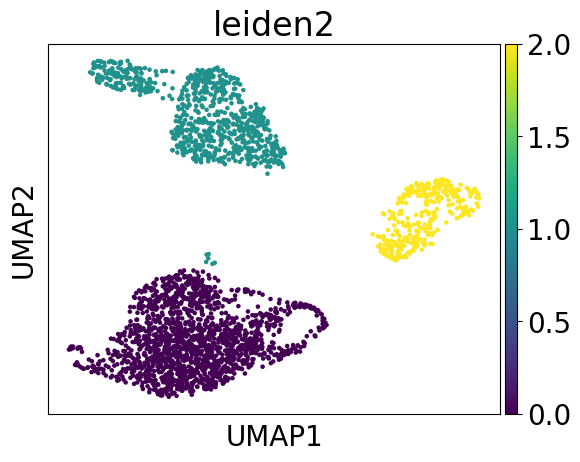

In [758]:
sc.pl.umap(adata2_subset, color=["leiden2"])


In [759]:
adata2_subset.obs

,cell_counts,n_genes,pass_count_filter,leiden,leiden2
barcode,,,,,
AAACCTGAGATGAGAG,20598.0,7499,True,0,0
AAACCTGCACCACCAG,17191.0,6462,True,4,1
AAACCTGCATACTACG,15866.0,6431,True,5,0
AAACCTGGTTTAGGAA,10367.0,4979,True,0,0
AAACCTGTCATACGGT,15001.0,6606,True,6,0
...,...,...,...,...,...
TTTGTCACAGTGAGTG,6615.0,3332,True,10,1
TTTGTCAGTAAGAGAG,6248.0,3483,True,8,2
TTTGTCAGTAGGCTGA,10293.0,5514,True,10,1


In [760]:
#loaded_df = pd.read_csv("umap_leiden.csv", index_col=0)


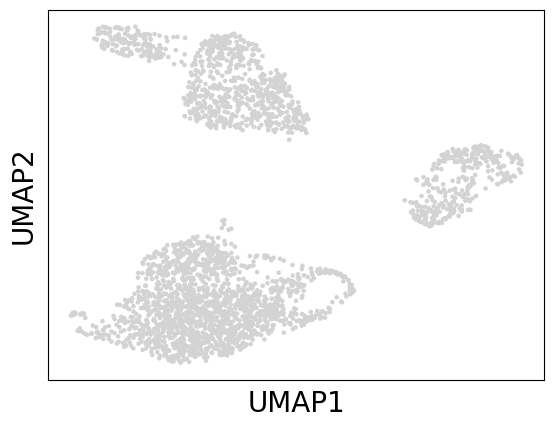

In [761]:
sc.pl.umap(adata2_subset)


In [762]:
!cat mcsc_melanoma_klue_out/kb_out/run_info.json

{
	"n_targets": 5830994,
	"n_bootstraps": 0,
	"n_processed": 166214256,
	"n_pseudoaligned": 129387314,
	"n_unique": 31697031,
	"p_pseudoaligned": 77.8,
	"p_unique": 19.1,
	"kallisto_version": "0.51.1",
	"index_version": 13,
	"k-mer length": 31,
	"start_time": "Sun Mar 23 16:11:47 2025",
	"call": "/home/dsullivan/2/cancer/kallisto/build/src/kallisto bus -i mcsc_melanoma_klue_out/shades/distinguish_1.shaded.idx -o mcsc_melanoma_klue_out/kb_out/ -x 10xv2 -t 18 --unstranded Melanoma_Tbpt/count-Tbpt_MissingLibrary_1_HMN5YBBXX/bamtofastq_S1_L002_R1_001.fastq.gz Melanoma_Tbpt/count-Tbpt_MissingLibrary_1_HMN5YBBXX/bamtofastq_S1_L002_R2_001.fastq.gz Melanoma_Tbpt/count-Tbpt_MissingLibrary_1_HMN5YBBXX/bamtofastq_S1_L002_R1_002.fastq.gz Melanoma_Tbpt/count-Tbpt_MissingLibrary_1_HMN5YBBXX/bamtofastq_S1_L002_R2_002.fastq.gz Melanoma_Tbpt/count-Tbpt_MissingLibrary_1_HMN5YBBXX/bamtofastq_S1_L002_R1_003.fastq.gz Melanoma_Tbpt/count-Tbpt_MissingLibrary_1_HMN5YBBXX/bamtofastq_S1_L002_R2_003.fastq.gz Mel

In [763]:
adata.var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
13,"1617,1620,1621,18416,59345,146648",1210.0,981,True,0.194927,-0.149914,0.501180,"Gm12174,Rpl7,Rpl7-ps9,Gm7059",0.000000
34,11889,87.0,85,True,0.018085,-0.046270,0.712173,Gm5175,0.000000
152,"1617,1618,1620,1621,1622",365.0,335,True,0.062836,-0.128850,0.544062,Rpl7,0.984709
171,"1617,1619,1620,1621,1622,99359,5330023,5330024...",113.0,108,True,0.020768,0.081213,0.971694,"Rpl7-ps7,Rpl7",0.000000
180,43443,114.0,112,True,0.022164,-0.149047,0.502945,Rpl7-ps8,0.000000
...,...,...,...,...,...,...,...,...,...
2884436,"13647,13650,123375",68.0,65,True,0.012639,-0.046353,0.712003,"Rps12,Gm44510",0.945678
2884915,"34644,34646,82453,82454,82455,82457,131890",92.0,87,True,0.017208,-0.137132,0.527201,"Gm5148,Gm10689,Rps23,Rps23-ps1",0.000000
2885328,"10945,10950,10952,10954",68.0,68,True,0.014522,-0.093045,0.616951,Metap2,0.951532
2885416,"60540,60543,60544,60551,60552,60562,60572",70.0,67,True,0.013869,-0.108550,0.585387,1110038B12Rik,0.980114


In [764]:
from itertools import combinations

# --- Step 1: Convert adata.X to a binary expression matrix ---
# Here we define "expressed" as any value > 0. Adjust the threshold as needed.
threshold = 0
if hasattr(adata.X, "toarray"):
    # Handle sparse matrices if necessary
    expr = (adata.X.toarray() > threshold).astype(int)
else:
    expr = (adata.X > threshold).astype(int)
# expr is now a (n_cells, n_transcripts) binary matrix.
    
# --- Step 2: Group transcripts by gene symbol ---
# Here, adata.var["gene_symbols"] contains the gene symbol for each transcript.
groups = {}
for idx, gene in enumerate(adata.var["gene_symbols"]):
    groups.setdefault(gene, []).append(idx)

# --- Define a function to compute Jaccard distance for two binary vectors ---
def jaccard_distance(v1, v2):
    intersection = np.sum(np.logical_and(v1, v2))
    union = np.sum(np.logical_or(v1, v2))
    if union == 0:
        return 0.0
    return 1 - intersection / union


In [765]:
# --- Step 3: Compute dispersion metric per gene symbol ---
dispersion_metric = {}
for gene, indices in groups.items():
    if len(indices) < 2:
        # Only one transcript for this gene symbol → no dispersion
        dispersion_metric[gene] = 0.0
    else:
        distances = []
        # Iterate over all pairs of transcripts (columns in expr)
        for i, j in combinations(indices, 2):
            v1 = expr[:, i]
            v2 = expr[:, j]
            distances.append(jaccard_distance(v1, v2))
        dispersion_metric[gene] = np.mean(distances)

In [766]:
adata.var["dispersion"] = adata.var["gene_symbols"].map(dispersion_metric)


In [767]:
adata.var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
13,"1617,1620,1621,18416,59345,146648",1210.0,981,True,0.194927,-0.149914,0.501180,"Gm12174,Rpl7,Rpl7-ps9,Gm7059",0.000000
34,11889,87.0,85,True,0.018085,-0.046270,0.712173,Gm5175,0.000000
152,"1617,1618,1620,1621,1622",365.0,335,True,0.062836,-0.128850,0.544062,Rpl7,0.984709
171,"1617,1619,1620,1621,1622,99359,5330023,5330024...",113.0,108,True,0.020768,0.081213,0.971694,"Rpl7-ps7,Rpl7",0.000000
180,43443,114.0,112,True,0.022164,-0.149047,0.502945,Rpl7-ps8,0.000000
...,...,...,...,...,...,...,...,...,...
2884436,"13647,13650,123375",68.0,65,True,0.012639,-0.046353,0.712003,"Rps12,Gm44510",0.945678
2884915,"34644,34646,82453,82454,82455,82457,131890",92.0,87,True,0.017208,-0.137132,0.527201,"Gm5148,Gm10689,Rps23,Rps23-ps1",0.000000
2885328,"10945,10950,10952,10954",68.0,68,True,0.014522,-0.093045,0.616951,Metap2,0.951532
2885416,"60540,60543,60544,60551,60552,60562,60572",70.0,67,True,0.013869,-0.108550,0.585387,1110038B12Rik,0.980114


In [768]:
adata.var.sort_values(by=['dispersion', 'gene_symbols'], ascending=False)

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
34674,97510,112.0,111,True,0.020499,0.002295,0.811038,Wdr66,1.0
100705,"97505,97507,97508",63.0,62,True,0.012778,-0.052430,0.699633,Wdr66,1.0
66825,7270,97.0,96,True,0.017153,-0.104320,0.593997,Ttll4,1.0
211689,"7270,7278",76.0,75,True,0.014827,-0.020561,0.764508,Ttll4,1.0
44640,111707,54.0,54,True,0.012528,0.001388,0.809192,Tbxas1,1.0
...,...,...,...,...,...,...,...,...,...
371207,101669,649.0,467,True,0.152065,0.502685,1.829704,0610040J01Rik,0.0
46666,"104920,104921,104922,104923,104924",180.0,170,True,0.036567,-0.059136,0.685980,0610040B10Rik,0.0
374121,84659,236.0,222,True,0.049748,-0.048950,0.706718,0610031O16Rik,0.0
502762,"25202,25203,25204,25205,25206",605.0,534,True,0.115993,0.026323,0.859953,0610009L18Rik,0.0


In [769]:
adata.var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
13,"1617,1620,1621,18416,59345,146648",1210.0,981,True,0.194927,-0.149914,0.501180,"Gm12174,Rpl7,Rpl7-ps9,Gm7059",0.000000
34,11889,87.0,85,True,0.018085,-0.046270,0.712173,Gm5175,0.000000
152,"1617,1618,1620,1621,1622",365.0,335,True,0.062836,-0.128850,0.544062,Rpl7,0.984709
171,"1617,1619,1620,1621,1622,99359,5330023,5330024...",113.0,108,True,0.020768,0.081213,0.971694,"Rpl7-ps7,Rpl7",0.000000
180,43443,114.0,112,True,0.022164,-0.149047,0.502945,Rpl7-ps8,0.000000
...,...,...,...,...,...,...,...,...,...
2884436,"13647,13650,123375",68.0,65,True,0.012639,-0.046353,0.712003,"Rps12,Gm44510",0.945678
2884915,"34644,34646,82453,82454,82455,82457,131890",92.0,87,True,0.017208,-0.137132,0.527201,"Gm5148,Gm10689,Rps23,Rps23-ps1",0.000000
2885328,"10945,10950,10952,10954",68.0,68,True,0.014522,-0.093045,0.616951,Metap2,0.951532
2885416,"60540,60543,60544,60551,60552,60562,60572",70.0,67,True,0.013869,-0.108550,0.585387,1110038B12Rik,0.980114


In [770]:
# Function to check if any number in the comma-separated string is > 150000
def contains_large_number(gene_id_str):
    numbers = map(int, gene_id_str.split(','))  # Convert to integers
    return any(num > 149483 for num in numbers)

# Apply function to filter rows
filtered_var = adata.var[adata.var['gene_id'].apply(contains_large_number)]



In [776]:
filtered_var = filtered_var[filtered_var['n_cells'] >= 10]

In [777]:
pd.set_option('display.max_rows', 2000)


In [778]:
# 69312, 3016; 90245, 78170, 178490, 93178, 76680; 13785/25232/38661

In [779]:
# 65318, 96438, 134224, 148941, 1930648

In [780]:
# GOOD: "1932", "55149", "79540"

In [781]:
adata2_subset.var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
13,"1617,1620,1621,18416,59345,146648",1210.0,981,True,0.194927,-0.149914,0.501180,"Gm12174,Rpl7,Rpl7-ps9,Gm7059",0.000000
34,11889,87.0,85,True,0.018085,-0.046270,0.712173,Gm5175,0.000000
152,"1617,1618,1620,1621,1622",365.0,335,True,0.062836,-0.128850,0.544062,Rpl7,0.984709
171,"1617,1619,1620,1621,1622,99359,5330023,5330024...",113.0,108,True,0.020768,0.081213,0.971694,"Rpl7-ps7,Rpl7",0.000000
180,43443,114.0,112,True,0.022164,-0.149047,0.502945,Rpl7-ps8,0.000000
...,...,...,...,...,...,...,...,...,...
2884436,"13647,13650,123375",68.0,65,True,0.012639,-0.046353,0.712003,"Rps12,Gm44510",0.945678
2884915,"34644,34646,82453,82454,82455,82457,131890",92.0,87,True,0.017208,-0.137132,0.527201,"Gm5148,Gm10689,Rps23,Rps23-ps1",0.000000
2885328,"10945,10950,10952,10954",68.0,68,True,0.014522,-0.093045,0.616951,Metap2,0.951532
2885416,"60540,60543,60544,60551,60552,60562,60572",70.0,67,True,0.013869,-0.108550,0.585387,1110038B12Rik,0.980114


In [782]:
adata2_subset.var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
13,"1617,1620,1621,18416,59345,146648",1210.0,981,True,0.194927,-0.149914,0.501180,"Gm12174,Rpl7,Rpl7-ps9,Gm7059",0.000000
34,11889,87.0,85,True,0.018085,-0.046270,0.712173,Gm5175,0.000000
152,"1617,1618,1620,1621,1622",365.0,335,True,0.062836,-0.128850,0.544062,Rpl7,0.984709
171,"1617,1619,1620,1621,1622,99359,5330023,5330024...",113.0,108,True,0.020768,0.081213,0.971694,"Rpl7-ps7,Rpl7",0.000000
180,43443,114.0,112,True,0.022164,-0.149047,0.502945,Rpl7-ps8,0.000000
...,...,...,...,...,...,...,...,...,...
2884436,"13647,13650,123375",68.0,65,True,0.012639,-0.046353,0.712003,"Rps12,Gm44510",0.945678
2884915,"34644,34646,82453,82454,82455,82457,131890",92.0,87,True,0.017208,-0.137132,0.527201,"Gm5148,Gm10689,Rps23,Rps23-ps1",0.000000
2885328,"10945,10950,10952,10954",68.0,68,True,0.014522,-0.093045,0.616951,Metap2,0.951532
2885416,"60540,60543,60544,60551,60552,60562,60572",70.0,67,True,0.013869,-0.108550,0.585387,1110038B12Rik,0.980114


In [783]:
from itertools import combinations

# --- Step 1: Create a binary expression matrix for adata2_subset ---
# Define an expression threshold (e.g., > 0 means expressed)
threshold = 0
if hasattr(adata2_subset.X, "toarray"):
    expr2 = (adata2_subset.X.toarray() > threshold).astype(int)
else:
    expr2 = (adata2_subset.X > threshold).astype(int)
# expr2 is a (n_cells, n_transcripts) matrix

# --- Step 2: For each transcript (column), determine the set of clusters where it's expressed ---
# We use the leiden2 column from adata2_subset.obs for cluster assignments.
transcript_clusters = {}
for i in range(expr2.shape[1]):
    # Get the indices of cells where transcript i is expressed.
    cell_indices = np.where(expr2[:, i] == 1)[0]
    # Retrieve the clusters for these cells.
    clusters = set(adata2_subset.obs.iloc[cell_indices]["leiden2"])
    transcript_clusters[i] = clusters

# --- Step 3: Group transcript indices by gene symbol ---
gene_to_indices = {}
for idx, gene_sym in enumerate(adata2_subset.var["gene_symbols"]):
    gene_to_indices.setdefault(gene_sym, []).append(idx)

# --- Step 4: Define a function to compute Jaccard distance between two sets ---
def jaccard_distance_set(s1, s2):
    union = s1.union(s2)
    # If union is empty (i.e. neither transcript is expressed), return 0.
    if len(union) == 0:
        return 0.0
    intersection = s1.intersection(s2)
    return 1 - len(intersection) / len(union)

# --- Compute the dispersion2 metric for each gene symbol ---
dispersion2_dict = {}
for gene, indices in gene_to_indices.items():
    if len(indices) < 2:
        # Only one transcript for this gene symbol → no dispersion.
        dispersion2_dict[gene] = 0.0
    else:
        distances = []
        # Compute pairwise Jaccard distances for all transcript pairs within the gene.
        for i, j in combinations(indices, 2):
            d = jaccard_distance_set(transcript_clusters[i], transcript_clusters[j])
            distances.append(d)
        dispersion2_dict[gene] = np.mean(distances)

# --- Step 5: Add the dispersion2 metric as a new column in adata2_subset.var ---
adata2_subset.var["dispersion2"] = adata2_subset.var["gene_symbols"].map(dispersion2_dict)


In [784]:
# Apply function to filter rows
filtered_var2 = adata2_subset.var[adata2_subset.var['gene_id'].apply(contains_large_number)]
filtered_var2 = filtered_var2[filtered_var2['n_cells'] >= 10]

In [785]:
filtered_var2.sort_values(by=['dispersion2', 'gene_symbols'], ascending=False)[1:1000]

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2
1173371,"85002,85003,85004,85005,2468998,2468999,246900...",59.0,57,True,0.017700,0.172136,1.156792,P2ry12,0.986900,0.666667
1133109,"36342,1547264",113.0,90,True,0.019369,-0.014632,0.776580,H2bc4,0.973123,0.666667
147340,"54428,54430,54435,5502386,5502387,5502388",135.0,58,True,0.031954,2.377888,5.647133,H2-Ab1,0.745474,0.633333
189455,"54428,54430,54435,5464418,5464419,5464420",117.0,57,True,0.026784,2.187010,5.258555,H2-Ab1,0.745474,0.633333
394781,"54428,54430,54435,5464418,5464419,5464420,5502...",46.0,27,True,0.013201,1.359178,3.573303,H2-Ab1,0.745474,0.633333
1640268,"131374,3397658,4953732,4962781",68.0,60,True,0.012520,-0.066994,0.669984,Pdgfrl,0.860831,0.500000
1640271,"131374,4953732,4962781",105.0,88,True,0.019264,-0.039677,0.725595,Pdgfrl,0.860831,0.500000
64490,"56035,5446471",100.0,97,True,0.019120,-0.072042,0.659707,Tubb5,0.983171,0.444444
453150,"56035,325021",81.0,72,True,0.013487,0.007902,0.822453,Tubb5,0.983171,0.444444
275532,"28721,28722,28723,4969296,4969297,4969298,5024...",158.0,92,True,0.040642,1.229169,3.308638,Serpina1b,0.536354,0.444444


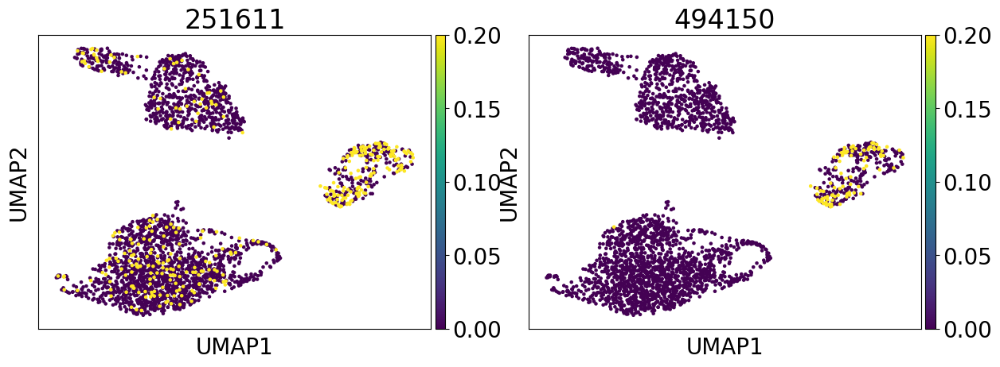

In [786]:
sc.pl.umap(adata2_subset, color=["251611", "494150"], vmax=0.2)

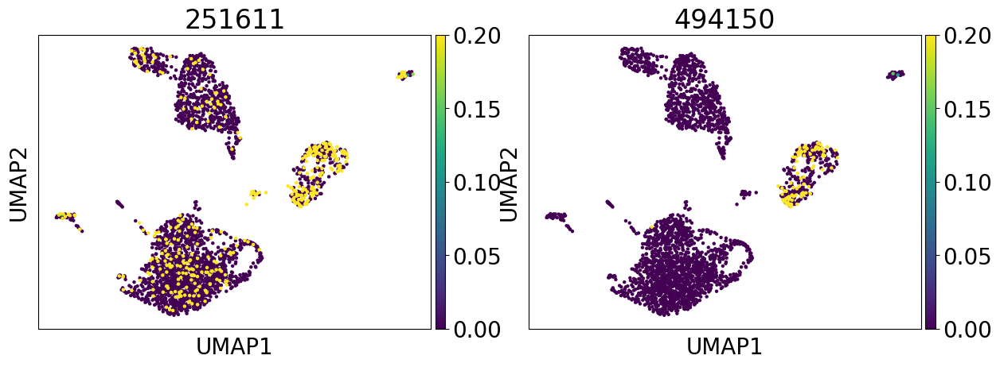

In [157]:
sc.pl.umap(adata2_subset, color=["251611", "494150"], vmax=0.2)

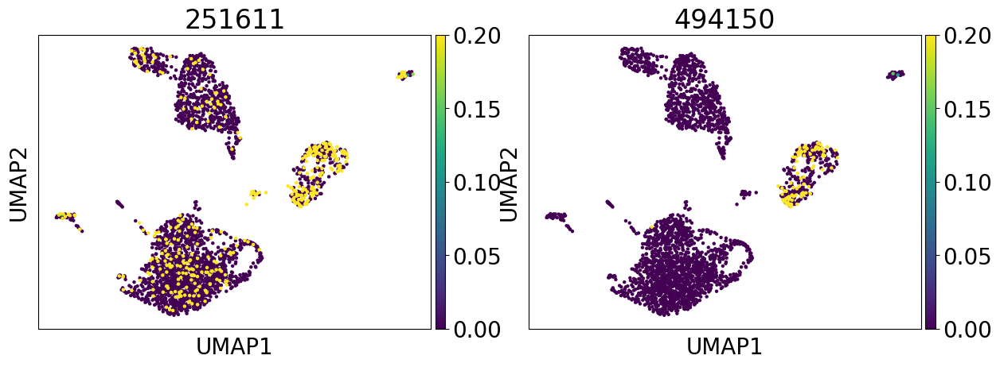

In [731]:
sc.pl.umap(adata2_subset, color=["251611", "494150"], vmax=0.2)

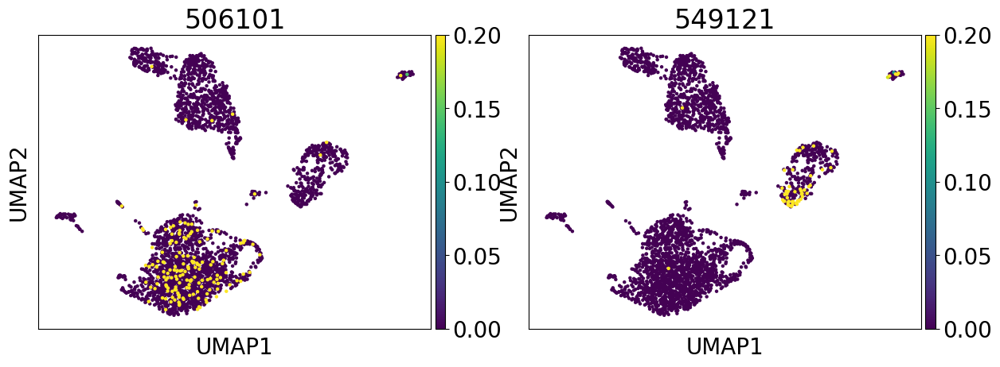

In [754]:
sc.pl.umap(adata2_subset, color=["506101", "549121"], vmax=0.2)

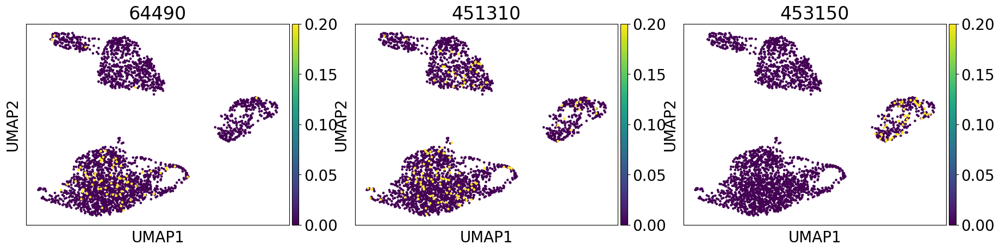

In [1178]:
sc.pl.umap(adata2_subset, color=["64490", "451310", "453150"], vmax=0.2)

In [ ]:
# P2ry12 = SNP; GOOD! 
# Tubb5 = GOOD indel
# Lbp = Two SNPs (that always appear together); GOOD!
# Fos = a more complex one (GOOD!)
# Scg2 = 9 A's instead of 8 BUT CLUSTERING NON-SPECIFIC (heterozygous?)
# C1qa = ? (semi-non-specific but could be promising)

In [ ]:
# # ENSMUSG00000121430.1 = H60A's tail

In [ ]:
# ???: Rsg5 
# ???: Lbp
# Scg2 = ?

In [ ]:
# C5ar1, Klhl3*, BC028528, Adamts4*, Tnfsf9*, Ptpa, Atp6v0c?, Selenop?

In [1402]:
adata[:, adata.var["gene_symbols"] == "Lbp"].var # KRT14, KRT5 # 69312, 95258, 52013, 91171, 177536

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
92784,"73498,2648287,2675163",90.0,73,True,0.016459,0.141901,1.095239,Lbp,0.816547
113836,"73498,5642571,5759754",77.0,59,True,0.015397,0.105490,1.021116,Lbp,0.816547
230085,73498,1212.0,426,True,0.233678,1.719874,3.546010,Lbp,0.816547
536322,73501,61.0,55,True,0.013812,0.326717,1.471479,Lbp,0.816547
1088123,"73498,2595511,5642571,5759754",120.0,90,True,0.024925,0.437889,1.697795,Lbp,0.816547
1729101,"73498,2595511",132.0,100,True,0.029541,0.387779,1.595785,Lbp,0.816547


In [1401]:
adata[:, adata.var["gene_symbols"] == "Fos"].var # KRT14, KRT5 # 69312, 95258, 52013, 91171, 177536

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
56466,"25823,1518009",102.0,76,True,0.022834,0.521089,1.867168,Fos,0.91064
63322,25823,48372.0,6043,True,2.517548,3.911372,2.050427,Fos,0.91064
604233,"25823,25824,25825,25826",1088.0,615,True,0.244021,1.348238,2.754704,Fos,0.91064


In [738]:
filtered_var2.sort_values(by=['dispersion2', 'gene_symbols'], ascending=False)[1:1000]

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2
78889,"46753,46754,46757,46761,1926517,1926518,192651...",20.0,15,True,0.013556,2.492251,1.179383,Tns2,1.000000,1.000000
776728,"89096,89098,11857786,11857787,11881968,11881969",20.0,11,True,0.012617,2.565992,1.245829,Tmem201,0.944444,1.000000
167553,"117357,117358,2052810,2052811",19.0,15,True,0.012588,2.207891,0.923151,Tmem9b,0.997685,1.000000
153278,"73393,1938723,11898579",21.0,19,True,0.012721,2.026554,0.759751,Tgm2,0.969697,1.000000
236860,"89702,1905417",26.0,18,True,0.017054,2.449005,1.140414,Stx12,0.989601,1.000000
228147,"100612,100616,100619,1882671,1882672,1882673,1...",19.0,16,True,0.013337,2.218579,0.932781,Smarcd3,0.951220,1.000000
145522,"146434,146436,11826697,11826698",27.0,22,True,0.016938,2.358911,1.059232,Rps4x,1.000000,1.000000
154300,"146434,12854232",30.0,27,True,0.013117,2.278355,0.986645,Rps4x,1.000000,1.000000
76569,"86443,86445,86446,86447,86448,86450,86451,8645...",31.0,27,True,0.018079,1.986965,0.724079,"Rpl22l1,Gm33051",1.000000,1.000000
133183,"86443,86445,86446,86447,86448,86450,86451,8645...",20.0,19,True,0.013521,2.145941,0.867329,"Rpl22l1,Gm33051",1.000000,1.000000


In [698]:
filtered_var.to_csv("primary.csv")

In [496]:
filtered_var.loc['69312']

gene_id             72097,72098,72099,72100,72101,72103,72115,7211...
gene_counts                                                      19.0
n_cells                                                            19
highly_variable                                                  True
means                                                        0.032503
dispersions                                                  1.663839
dispersions_norm                                              2.91786
gene_symbols                                                  PPP2R5C
dispersion                                                   0.943103
Name: 69312, dtype: object

In [790]:
adata2_subset.obs

,cell_counts,n_genes,pass_count_filter,leiden,leiden2
barcode,,,,,
AAACCTGAGATGAGAG,20598.0,7499,True,0,0
AAACCTGCACCACCAG,17191.0,6462,True,4,1
AAACCTGCATACTACG,15866.0,6431,True,5,0
AAACCTGGTTTAGGAA,10367.0,4979,True,0,0
AAACCTGTCATACGGT,15001.0,6606,True,6,0
...,...,...,...,...,...
TTTGTCACAGTGAGTG,6615.0,3332,True,10,1
TTTGTCAGTAAGAGAG,6248.0,3483,True,8,2
TTTGTCAGTAGGCTGA,10293.0,5514,True,10,1


In [832]:
filtered_var2

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2
171,"1617,1619,1620,1621,1622,99359,5330023,5330024...",113.0,108,True,0.020768,0.081213,0.971694,"Rpl7-ps7,Rpl7",0.000000,0.000000
40071,"103692,103698,2980679,2980680",165.0,158,True,0.029903,0.003646,0.813789,Actb,0.979379,0.118519
40083,"103692,103698,1354609,1354610",140.0,136,True,0.025382,0.000841,0.808077,Actb,0.979379,0.118519
40107,"103692,103698,1354605,1354606",83.0,83,True,0.016170,0.013975,0.834815,Actb,0.979379,0.118519
43464,"48709,48710,103692,103698,1354587,1354588,1354...",112.0,106,True,0.022471,0.059879,0.928264,"Gm15725,Actb,Lrrc58",0.000000,0.000000
49478,"103692,103698,5555464,5555465",66.0,66,True,0.013964,-0.095922,0.611094,Actb,0.979379,0.118519
53680,"52298,52299,52300,5496741,5496742,5496743,5729...",160.0,105,True,0.026823,0.677625,2.185836,Apod,0.814359,0.093434
53892,"52298,52299,52300,5307193,5307194,5307195,5500...",113.0,82,True,0.019987,0.763002,2.359641,Apod,0.814359,0.093434
53912,"52298,52299,52300,5607872,5607873,5607874,5710...",101.0,76,True,0.019078,0.624588,2.077866,Apod,0.814359,0.093434
53961,"52298,52299,52300,5336011,5336012,5336013",227.0,136,True,0.040584,0.956220,2.752983,Apod,0.814359,0.093434


In [839]:
list(filtered_var2.index)

Index(['171', '40071', '40083', '40107', '43464', '49478', '53680', '53892',
       '53912', '53961',
       ...
       '2784623', '2785418', '2796034', '2796410', '2796537', '2808644',
       '2818539', '2840831', '2841030', '2845918'],
      dtype='object', length=441)

In [851]:
print("adata.obs.shape:", adata2_subset.obs.shape)
print("First 10 adata.obs.index values:", adata2_subset.obs.index.tolist()[:10])
print("adata.var.shape:", adata2_subset.var.shape)
print("First 10 adata.var.index values:", adata2_subset.var.index.tolist()[:10])


adata.obs.shape: (2776, 5)
First 10 adata.obs.index values: ['AAACCTGAGATGAGAG', 'AAACCTGCACCACCAG', 'AAACCTGCATACTACG', 'AAACCTGGTTTAGGAA', 'AAACCTGTCATACGGT', 'AAACCTGTCGAGAGCA', 'AAACGGGAGAAACCAT', 'AAACGGGCAGACAGGT', 'AAACGGGGTATAGTAG', 'AAACGGGGTTAAAGTG']
adata.var.shape: (21882, 11)
First 10 adata.var.index values: ['13', '34', '152', '171', '180', '305', '309', '314', '315', '318']


In [848]:
a = list(map(int,list(filtered_var2.index)))

In [857]:
adata2_subset[:,list(filtered_var2.index)]

View of AnnData object with n_obs × n_vars = 2776 × 441
    obs: 'cell_counts', 'n_genes', 'pass_count_filter', 'leiden', 'leiden2'
    var: 'gene_id', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_symbols', 'dispersion', 'dispersion2', 'logreg_coef_1'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [1074]:
import re

def passes_filter(gene_symbol_str):
    """
    Returns True if:
     - The comma-separated gene symbol string contains only one unique gene.
     - That unique gene does not start with "Gm" followed by digits.
    Otherwise, returns False.
    """
    # Split the string by commas and strip whitespace.
    genes = [g.strip() for g in gene_symbol_str.split(",") if g.strip()]
    # Create a set to obtain unique genes.
    unique_genes = set(genes)
    # Filter out if more than one unique gene is present.
    if len(unique_genes) > 1:
        return False
    # Get the single unique gene (if exists).
    if not unique_genes:
        return False  # In case the field is empty.
    gene = unique_genes.pop()
    # Filter out if gene starts with "Gm" followed by one or more digits.
    if re.match(r'^Gm\d+$', gene):
        return False
    if gene.endswith("-ps"):
        return False
    if gene.endswith("-ps0"):
        return False
    if gene.endswith("-ps1"):
        return False
    if gene.endswith("-ps2"):
        return False
    if gene.endswith("-ps3"):
        return False
    if gene.endswith("-ps4"):
        return False
    if gene.endswith("-ps5"):
        return False
    if gene.endswith("-ps6"):
        return False
    if gene.endswith("-ps7"):
        return False
    if gene.endswith("-ps8"):
        return False
    if gene.endswith("-ps9"):
        return False
    if gene.startswith("ENS"):
        return False
    return True

#xx = adata2_subset[:,list(filtered_var2.index)].copy()
#filtered_var2[filtered_var2['n_cells'] >= 10]
# Apply function to filter rows
xxx = adata2_subset.var.copy()
xxx = xxx[xxx['n_cells'] >= 10].copy()
xx = adata2_subset[:,list(xxx.index)].copy()

# Apply this function to the "gene_symbols" column in adata2_subset.var
mask = xx.var["gene_symbols"].apply(passes_filter)

# Now, subset your AnnData object to keep only variables (genes) that pass the filter.
adata2_subset_filtered = xx[:, mask].copy()

In [1075]:
adata2_subset_filtered

AnnData object with n_obs × n_vars = 2776 × 17346
    obs: 'cell_counts', 'n_genes', 'pass_count_filter', 'leiden', 'leiden2'
    var: 'gene_id', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_symbols', 'dispersion', 'dispersion2', 'logreg_coef_1'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [1044]:
adata2_subset_filtered

AnnData object with n_obs × n_vars = 2776 × 384
    obs: 'cell_counts', 'n_genes', 'pass_count_filter', 'leiden', 'leiden2'
    var: 'gene_id', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_symbols', 'dispersion', 'dispersion2', 'logreg_coef_1'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [924]:
from sklearn.linear_model import LogisticRegression
from scipy.sparse import issparse, csr_matrix
import numpy as np
import pandas as pd

def run_logistic_regression_for_cluster_sparse(adata, target_cluster, threshold=0, C=1.0):
    """
    Runs a multivariate logistic regression on binary gene expression data to predict
    target cluster membership using a sparse matrix. Uses scikit-learn's LogisticRegression,
    which accepts sparse input.
    
    Parameters:
      adata: AnnData object
         Assumes that adata.obs['leiden2'] contains cluster labels and
         adata.X contains gene expression data.
      target_cluster: str or int
         The cluster label to test (e.g., "2").
      threshold: float, optional (default=0)
         The threshold to define expression (cells with expression > threshold
         are considered to express the gene).
      C: float, optional (default=1.0)
         Inverse of regularization strength for LogisticRegression.
    
    Returns:
      adata: AnnData object with a new column in adata.var named
             'logreg_coef_{target_cluster}' storing the gene coefficients.
      coefficients: 1D numpy array of coefficients (one per gene).
      
    Note:
      p-values are not provided by scikit-learn's LogisticRegression.
    """
    # Create binary outcome vector: 1 if cell is in target_cluster, else 0.
    # Convert target_cluster to string for consistency.
    y = (adata.obs['leiden2'] == (target_cluster)).astype(int).values
    
    # Create binary gene expression matrix without densifying:
    # If adata.X is sparse, work with it directly; if not, convert to sparse.
    if issparse(adata.X):
        X_bin = (adata.X > threshold).astype(int)
    else:
        from scipy.sparse import csr_matrix
        X_bin = csr_matrix((adata.X > threshold).astype(int))
    
    # Fit logistic regression using a solver that supports sparse input.
    model = LogisticRegression(penalty='l2', C=C, solver='liblinear', max_iter=1000)
    model.fit(X_bin, y)
    
    # Extract coefficients; model.coef_ is shape (1, n_genes)
    coefficients = model.coef_.flatten()
    
    # Store the coefficients in adata.var with a column name that includes the cluster ID.
    adata.var[f'logreg_coef_{target_cluster}'] = coefficients
    
    return adata, coefficients

# Example usage:
# adata, coefs = run_logistic_regression_for_cluster_sparse(adata, target_cluster="2")
# markers_df = pd.DataFrame(coefs, index=adata.var_names, columns=[f'logreg_coef_2'])
# print(markers_df.sort_values(by=f'logreg_coef_2', ascending=False).head())


In [860]:
adata2_subset_filtered.var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2,logreg_coef_1
40071,"103692,103698,2980679,2980680",165.0,158,True,0.029903,0.003646,0.813789,Actb,0.979379,0.118519,-0.011606
40083,"103692,103698,1354609,1354610",140.0,136,True,0.025382,0.000841,0.808077,Actb,0.979379,0.118519,-0.009594
40107,"103692,103698,1354605,1354606",83.0,83,True,0.016170,0.013975,0.834815,Actb,0.979379,0.118519,-0.003985
49478,"103692,103698,5555464,5555465",66.0,66,True,0.013964,-0.095922,0.611094,Actb,0.979379,0.118519,-0.002467
53680,"52298,52299,52300,5496741,5496742,5496743,5729...",160.0,105,True,0.026823,0.677625,2.185836,Apod,0.814359,0.093434,-0.008266
53892,"52298,52299,52300,5307193,5307194,5307195,5500...",113.0,82,True,0.019987,0.763002,2.359641,Apod,0.814359,0.093434,-0.013255
53912,"52298,52299,52300,5607872,5607873,5607874,5710...",101.0,76,True,0.019078,0.624588,2.077866,Apod,0.814359,0.093434,-0.010934
53961,"52298,52299,52300,5336011,5336012,5336013",227.0,136,True,0.040584,0.956220,2.752983,Apod,0.814359,0.093434,-0.004195
53990,"52298,52299,52300,5390949,5390950,5390951,5746...",203.0,116,True,0.037496,1.669096,4.204215,Apod,0.814359,0.093434,-0.016913
53994,"52298,52299,52300,5304920,5304921,5304922,5674...",179.0,125,True,0.036332,0.397398,1.615366,Apod,0.814359,0.093434,-0.016205


In [925]:
adata4_subset, markers = run_logistic_regression_for_cluster_sparse(adata2_subset_filtered, target_cluster=2)

In [862]:
markers_df = pd.DataFrame(markers, index=adata4_subset.var_names, columns=[f'logreg_coef_1'])
print(markers_df.sort_values(by=f'logreg_coef_1', ascending=False).head())

         logreg_coef_1
1197024       2.281307
503504        2.148359
370689        2.143660
1434237       2.042356
55149         1.962029


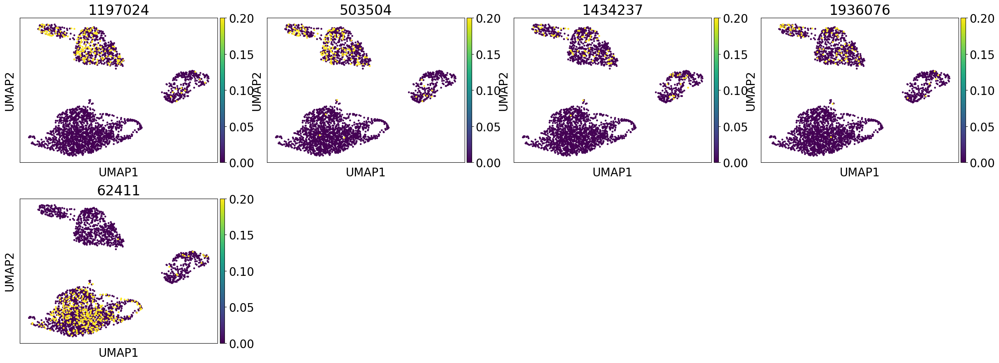

In [870]:
#                 p_val  odds_ratio   log2_OR  neg_log10_p
# gene                                                    
# 66124    0.000000e+00    0.005765 -7.438465   300.000000
# 524049   8.813220e-19    0.006081 -7.361577    18.054865
# 79830    0.000000e+00    0.006780 -7.204522   300.000000
# 56693   1.053584e-119    0.008394 -6.896472   118.977331
# 70742    3.469557e-11    0.010861 -6.524718    10.459726


sc.pl.umap(adata4_subset, color=["1197024", "503504", "1434237", "1936076", "62411"], vmax=0.2)

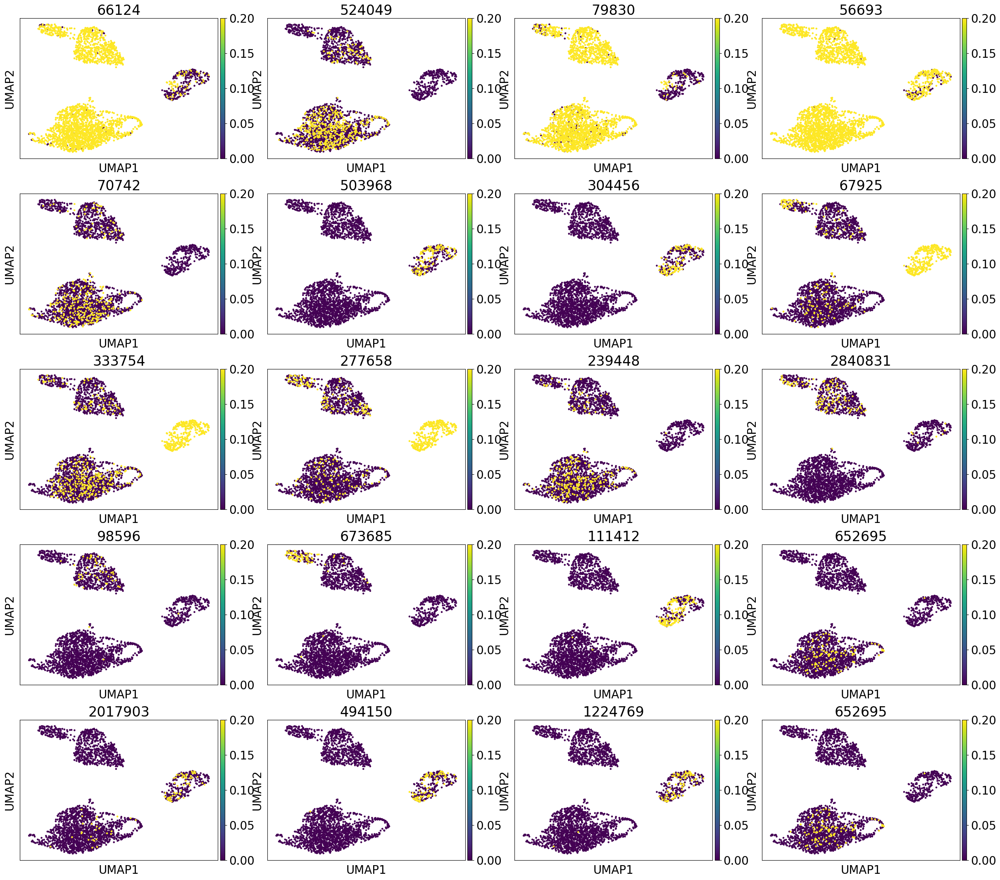

In [964]:
sc.pl.umap(adata2_subset, color=["66124", "524049", "79830", "56693", "70742",
                                "503968", "304456", "67925", "333754", "277658", "239448",
                                "2840831", "98596", "673685", "111412", "652695", "2017903", "494150",
                                "1224769", "652695"], vmax=0.2)

In [929]:
adata4_subset.var.sort_values(by=['logreg_coef_2', 'gene_symbols'], ascending=True)

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2,logreg_coef_1,logreg_coef_2
239448,"2457,2459,2460,5227446,5227447,5227448,5391121...",379.0,345,True,0.075499,0.128670,1.068306,Ecel1,0.920745,0.000000,-0.301536,-0.649022
503504,"49358,49359,5390389,5390390,5563020,5563021",231.0,200,True,0.053077,0.160200,1.132492,Cd200,0.942360,0.184127,2.148359,-0.537576
405042,"9073,5189609,5797291",344.0,305,True,0.082768,0.261558,1.338830,Gpr37l1,0.927346,0.000000,1.247801,-0.531638
404998,"9073,5189609,5349814,5563710,5797291",264.0,241,True,0.068481,0.222728,1.259783,Gpr37l1,0.927346,0.000000,1.068733,-0.464314
928852,"9648,9649,5275636,5275637,5356496,5356497",323.0,302,True,0.065409,-0.092607,0.617843,Hsp90b1,0.951898,0.000000,0.402157,-0.428761
62411,"139347,139354,139356,139357,139358,139359,1393...",578.0,431,True,0.081529,0.071543,0.952010,Tpm1,0.935785,0.000000,-2.111837,-0.426895
201764,"9073,5349814,5563710",254.0,229,True,0.061608,0.188194,1.189481,Gpr37l1,0.927346,0.000000,0.912555,-0.407584
109901,"122656,122658,3159171,3159172,5495917,5495918",209.0,193,True,0.038692,-0.040209,0.724512,Scn1b,0.959764,0.000000,0.415370,-0.405248
220550,"623,5178703,5265520,5503093,5555425",777.0,607,True,0.136645,0.219330,1.252866,Serpine2,0.920128,0.000000,0.647404,-0.377437
55149,"15934,688475",70.0,61,True,0.018478,0.154217,1.120312,ENSMUSG00000121430.1,0.991071,0.333333,1.962029,-0.374700


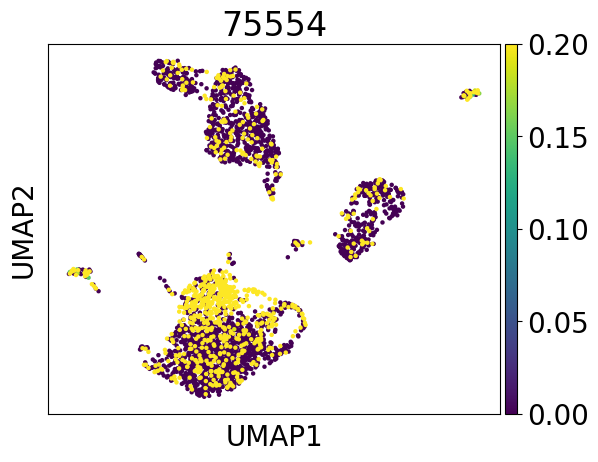

In [753]:
sc.pl.umap(adata4_subset, color=["75554"], vmax=0.2)

In [739]:
adata[:, adata.var["gene_symbols"] == "Braf"].var # 69312, 95258, 52013, 91171, 177536
# 11942, 24138, 68205, 194601

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
11942,111769,609.0,391,True,0.213411,2.352585,1.053532,Braf,0.982435
24138,"111771,1946161,11820023",27.0,23,True,0.014242,2.124823,0.848300,Braf,0.982435
68205,111771,145.0,101,True,0.057188,2.194894,0.911440,Braf,0.982435
194601,"111769,111770",41.0,32,True,0.016477,2.259453,0.969613,Braf,0.982435


In [1534]:
adata[:, adata.var["gene_symbols"] == "mt-Tt"].var # 69312, 95258, 52013, 91171, 177536

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
70825,"141862,3802048,5707841",144.0,141,True,0.017230,-0.070670,0.662501,mt-Tt,0.952993
226979,141862,359.0,329,True,0.044956,0.055781,0.919923,mt-Tt,0.952993
897197,"141862,3853886,5348919",132.0,130,True,0.018217,-0.058021,0.688251,mt-Tt,0.952993


In [1535]:
adata[:, adata.var["gene_symbols"] == "mt-Nd4"].var # 69312, 95258, 52013, 91171, 177536

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
609772,"141854,3801825",142.0,137,True,0.01788,0.001655,0.809735,mt-Nd4,0.0


In [941]:
adata2_subset_filtered

AnnData object with n_obs × n_vars = 2776 × 384
    obs: 'cell_counts', 'n_genes', 'pass_count_filter', 'leiden', 'leiden2'
    var: 'gene_id', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_symbols', 'dispersion', 'dispersion2', 'logreg_coef_1'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [973]:
adata2_subset_filtered[:,['652695', '111412']].var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2,logreg_coef_1
652695,"45923,5153339",135.0,130,True,0.025351,-0.086919,0.629421,Tuba1a,0.963305,0.253968,-0.016722
111412,"556,5196829,5737692",296.0,172,True,0.057499,0.542265,1.910279,Col3a1,0.754577,0.245833,-0.026057


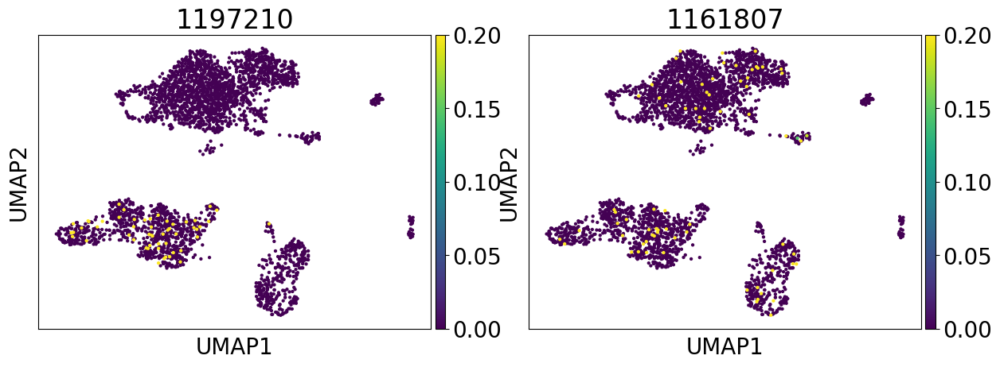

In [993]:
sc.pl.umap(adata, color=["1197210","1161807"], vmax=0.2)

In [1049]:
adata2_subset_filtered

AnnData object with n_obs × n_vars = 2776 × 17385
    obs: 'cell_counts', 'n_genes', 'pass_count_filter', 'leiden', 'leiden2'
    var: 'gene_id', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_symbols', 'dispersion', 'dispersion2', 'logreg_coef_1'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [965]:
# 111412   1.947517e-13    0.008791 -6.829783    12.710519
# 652695   2.161319e-10    0.011734 -6.413159     9.665281


In [945]:
stats_dict = compute_gene_marker_stats_sparse_optimized(adata2_subset_filtered, cluster_key='leiden2', threshold=0)

In [952]:
df_cluster2 = gene_stats_to_dataframe(stats_dict, target_cluster=1)

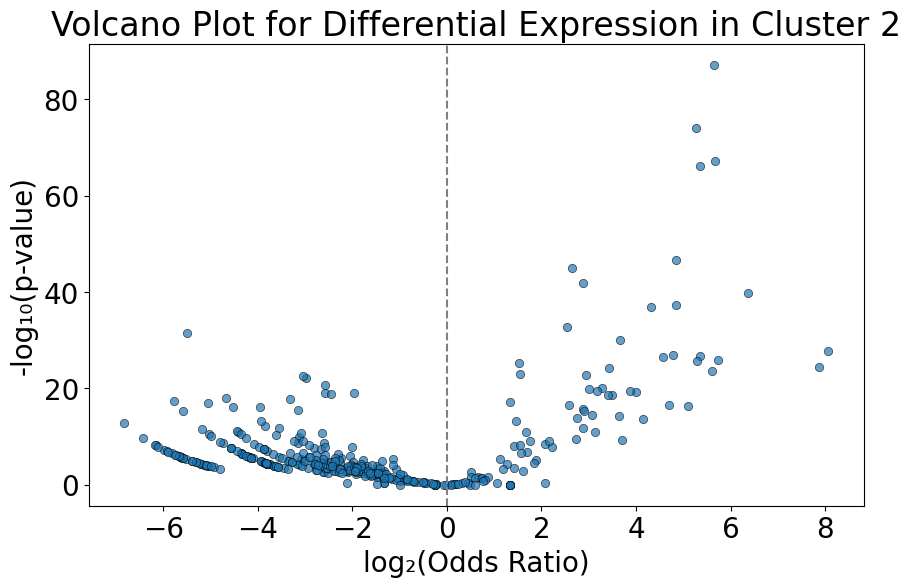

In [989]:
import numpy as np
import matplotlib.pyplot as plt

# Assume df_cluster2 is a DataFrame with index = gene names and columns:
#   'p_val' and 'odds_ratio'
# For the volcano plot, we compute log2(odds_ratio) as the x-axis,
# and –log10(p_val) as the y-axis.

# Add a small constant to p-values in case some p-values are 0.
epsilon = 1e-300
df_cluster2 = df_cluster2.copy()
df_cluster2['log2_OR'] = np.log2(df_cluster2['odds_ratio'])
df_cluster2['neg_log10_p'] = -np.log10(df_cluster2['p_val'] + epsilon)

# Create a volcano plot.
plt.figure(figsize=(10, 6))
plt.scatter(df_cluster2['log2_OR'], df_cluster2['neg_log10_p'], 
            alpha=0.7, edgecolor='k', linewidth=0.5)

# Draw a vertical line at 0 for reference (no enrichment vs. depletion).
plt.axvline(x=0, color='grey', linestyle='--')

plt.xlabel('log₂(Odds Ratio)')
plt.ylabel('-log₁₀(p-value)')
plt.title(f'Volcano Plot for Differential Expression in Cluster {target_cluster}')

plt.show()


In [1031]:
adata2_subset_filtered[:,'207668'].var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2,logreg_coef_1
207668,"530,531,4963522,4963523,4998413,4998414,502846...",77.0,46,True,0.015116,0.76446,2.362611,Scg2,0.769231,0.333333,0.01125


In [1032]:
adata[:, adata.var["gene_symbols"] == "Scg2"].var # 69312, 95258, 52013, 91171, 177536

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
207441,"530,531",2605.0,292,True,0.389006,3.681553,7.722912,Scg2,0.769231
207668,"530,531,4963522,4963523,4998413,4998414,502846...",77.0,46,True,0.015116,0.764460,2.362611,Scg2,0.769231


In [1025]:
print(df_cluster2.sort_values('log2_OR').tail(42))

                p_val  odds_ratio   log2_OR  neg_log10_p
gene                                                    
201764   1.533923e-33    5.786142  2.532602    32.814196
404565   3.140577e-17    5.957133  2.574618    16.502991
405042   1.140994e-45    6.236898  2.640829    44.942716
2333891  3.871330e-10    6.611451  2.724967     9.412140
1876781  1.415370e-14    6.707801  2.745840    13.849130
509069   1.546308e-16    7.324435  2.872717    15.810704
404998   1.743243e-42    7.327481  2.873317    41.758642
1336151  1.380450e-12    7.342463  2.876264    11.859979
1174476  4.836401e-16    7.419913  2.891402    15.315478
963391   1.532806e-23    7.717161  2.948070    22.814513
1172631  1.542942e-20    8.019751  3.003557    19.811650
1863573  4.262675e-15    8.377419  3.066506    14.370318
2310709  1.152382e-11    8.712462  3.123080    10.938404
2124690  3.948977e-20    9.096323  3.185283    19.403515
835695   1.067247e-20    9.688084  3.276211    19.971735
785569   2.613835e-19   10.6433

In [1038]:
adata2_subset.var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2,logreg_coef_1
13,"1617,1620,1621,18416,59345,146648",1210.0,981,True,0.194927,-0.149914,0.501180,"Gm12174,Rpl7,Rpl7-ps9,Gm7059",0.000000,0.000000,-0.051659
34,11889,87.0,85,True,0.018085,-0.046270,0.712173,Gm5175,0.000000,0.000000,-0.000078
152,"1617,1618,1620,1621,1622",365.0,335,True,0.062836,-0.128850,0.544062,Rpl7,0.984709,0.000000,-0.005939
171,"1617,1619,1620,1621,1622,99359,5330023,5330024...",113.0,108,True,0.020768,0.081213,0.971694,"Rpl7-ps7,Rpl7",0.000000,0.000000,-0.005658
180,43443,114.0,112,True,0.022164,-0.149047,0.502945,Rpl7-ps8,0.000000,0.000000,-0.005624
...,...,...,...,...,...,...,...,...,...,...,...
2884436,"13647,13650,123375",68.0,65,True,0.012639,-0.046353,0.712003,"Rps12,Gm44510",0.945678,0.000000,-0.000257
2884915,"34644,34646,82453,82454,82455,82457,131890",92.0,87,True,0.017208,-0.137132,0.527201,"Gm5148,Gm10689,Rps23,Rps23-ps1",0.000000,0.000000,0.003283
2885328,"10945,10950,10952,10954",68.0,68,True,0.014522,-0.093045,0.616951,Metap2,0.951532,0.095238,-0.009277
2885416,"60540,60543,60544,60551,60552,60562,60572",70.0,67,True,0.013869,-0.108550,0.585387,1110038B12Rik,0.980114,0.000000,0.004213


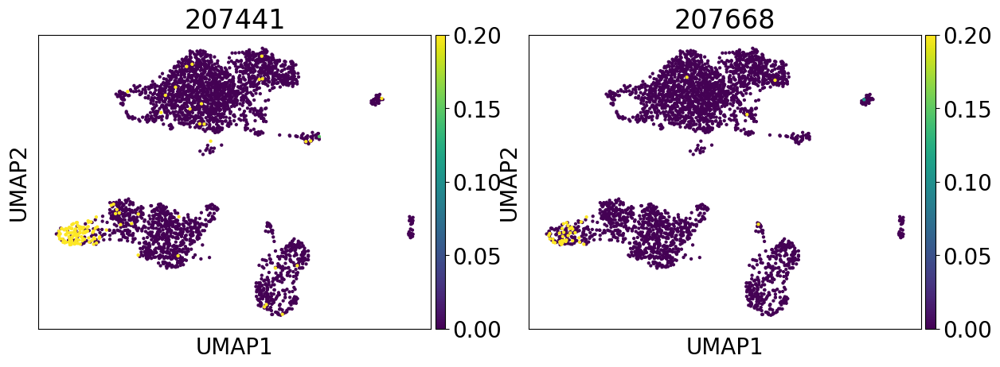

In [1033]:
sc.pl.umap(adata, color=["207441","207668"], vmax=0.2)

In [420]:
!ls melanoma_10xgenomics_klue_out/kb_out/

10x_version3_whitelist.txt  matrix.ec		   script.py
counts_unfiltered	    output.bus		   transcripts.txt
inspect.json		    output.unfiltered.bus
kb_info.json		    run_info.json


In [421]:
!head melanoma_10xgenomics_klue_out/kb_out/transcripts.txt

ENST00000308647.8
ENST00000378736.3
ENST00000472194.6
ENST00000474481.1
ENST00000485748.5
ENST00000673477.1
ENST00000624431.2
ENST00000424215.1
ENST00000270722.10
ENST00000378389.5


In [423]:
!head human_index_t2g.txt

ENST00000308647.8	ENSG00000160072.20	ATAD3B	ATAD3B-201	1	1471784	1496201	+
ENST00000378736.3	ENSG00000160072.20	ATAD3B	ATAD3B-202	1	1479049	1482662	+
ENST00000472194.6	ENSG00000160072.20	ATAD3B	ATAD3B-203	1	1478026	1497848	+
ENST00000474481.1	ENSG00000160072.20	ATAD3B	ATAD3B-204	1	1484569	1496201	+
ENST00000485748.5	ENSG00000160072.20	ATAD3B	ATAD3B-205	1	1483485	1496202	+
ENST00000673477.1	ENSG00000160072.20	ATAD3B	ATAD3B-206	1	1471765	1497848	+
ENST00000624431.2	ENSG00000279928.2	DDX11L17	DDX11L17-201	1	182696	184174	+
ENST00000424215.1	ENSG00000228037.1			1	2581560	2584533	+
ENST00000270722.10	ENSG00000142611.17	PRDM16	PRDM16-201	1	3069203	3438621	+
ENST00000378389.5	ENSG00000142611.17	PRDM16	PRDM16-202	1	3424919	3434095	+


In [413]:
filtered_var[1:65]

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
262,"243296,8287414,8700993,9161283,9198597",362.0,209,True,0.314081,0.865580,1.968608
547,"205807,205808,8296552,8296553,8617280,8617281",56.0,51,True,0.047921,-0.092966,0.828750
595,"175028,175031,8497410,8497411,9165013,9165014",587.0,75,True,0.089107,1.092513,2.238466
888,"243290,8717077,9012139",335.0,178,True,0.320309,1.240254,2.414153
895,"175028,175031,8497410,8497411,9091045,9091046",234.0,46,True,0.032742,0.246266,1.232149
916,"207651,1226959",161.0,114,True,0.130240,-0.137061,0.776315
1274,"209608,209609,209610,209611,8467298,8467299,84...",389.0,210,True,0.266252,0.402192,1.417569
1601,"72087,72088,9071532,9071533,9140206,9140207",208.0,150,True,0.168246,-0.018701,0.917062
1692,"29850,1054886",33.0,29,True,0.026122,-0.366596,0.503362
2081,"247619,247620,247621,247622,8701152,8701153,87...",653.0,185,True,0.301661,0.328879,1.330388


In [729]:
filtered_var[100:165]

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
129792,"556,678108,4978435",69.0,57,True,0.014560,0.098983,1.007869,Col3a1,0.754577
131527,"593,5299419,5509311",132.0,92,True,0.021263,0.038825,0.885405,Col5a2,0.933673
134199,"110273,3046152,5250017,5425270,5783445",74.0,54,True,0.018029,0.700696,2.232803,Mgp,0.843599
134329,"47217,105273,105277,105278,3591439,3591440,359...",73.0,72,True,0.013097,-0.029890,0.745518,"AI506816,Apobec3",0.947492
135670,"55675,55677,55680,55682,55683,55684,5626353,56...",96.0,92,True,0.017095,-0.026495,0.752430,Myl12a,0.929491
137704,"120650,120651,120652,120654,4986919,4986920,49...",78.0,77,True,0.012536,0.000445,0.807272,Serpinh1,0.973404
145784,"4974,4975,4977,4978,590677,590678,590679,59068...",57.0,57,True,0.013568,0.048224,0.904537,Adam23,0.959319
147133,"110273,5337429,5557805",5531.0,676,True,0.785410,3.226979,5.174571,Mgp,0.843599
147326,"19141,19144,982751,982752",106.0,105,True,0.016410,-0.116951,0.568284,Pmp22,0.953263
147340,"54428,54430,54435,5502386,5502387,5502388",135.0,58,True,0.031954,2.377888,5.647133,H2-Ab1,0.745474


In [730]:
# 2165; 2323; 2641; 4028; 5959; 8158; 8595; 10425; 10957; 12760; 12880; 13179; 14498; 18779; 22034; 23403; 27061; 
# 495383, 652695, 903346, 1216118
# # 239448, 261506, 262905, 262919, 296130
sc.pl.umap(adata, color=["7599","146198"])
# 55332, 422360, 424376
# 589498, 64490
# 388519, 1741421

KeyError: 'Could not find key 7599 in .var_names or .obs.columns.'

<Figure size 1455.6x480 with 0 Axes>

In [1086]:
import numpy as np
import pandas as pd
from scipy.sparse import issparse

def parse_transcript_id(s):
    """
    Parse a comma-separated transcript ID string.
    Returns the first transcript ID as an integer.
    """
    try:
        # Split the string on commas and convert the first part to int.
        return int(s.split(',')[len(s.split(','))-1])
    except Exception:
        return np.nan

def construct_ec_df(adata, 
                    leiden_col='leiden2', 
                    transcript_id_col='gene_id', 
                    gene_symbols_col='gene_symbols'):
    """
    Construct a DataFrame (ec_df) from an AnnData object that contains per equivalence class (EC)
    detection information by Leiden cluster. The resulting DataFrame will contain:
    
      - "gene": equivalence class identifier (from adata.var.index)
      - "transcript_id": parsed transcript ID (first transcript from comma-separated values in adata.var[transcript_id_col])
      - "gene_symbols": the gene symbols from adata.var[gene_symbols_col]
      - "leiden": the cell cluster (from adata.obs[leiden_col])
      - "prop": the proportion of cells in that Leiden cluster where that EC is detected (i.e. count > 0)
    
    Parameters:
      adata : AnnData
          An AnnData object, where:
             - adata.X is a cell-by-equivalence class count matrix (preferably sparse)
             - adata.obs[leiden_col] holds Leiden cluster assignments for cells.
             - adata.var.index holds equivalence class IDs.
             - adata.var[transcript_id_col] has comma-separated transcript IDs.
             - adata.var[gene_symbols_col] contains gene symbols.
      leiden_col : str, optional (default 'leiden2')
          The key in adata.obs for Leiden clusters.
      transcript_id_col : str, optional (default 'gene_id')
          The column in adata.var with comma-separated transcript IDs.
      gene_symbols_col : str, optional (default 'gene_symbols')
          The column in adata.var with gene symbols.
    
    Returns:
      ec_df : pandas.DataFrame
          A DataFrame with one row per EC per Leiden cluster containing the EC ID, transcript ID,
          gene symbol, cluster, and detection proportion.
    """
    # Ensure that adata.X is a sparse matrix.
    if not issparse(adata.X):
        raise ValueError("adata.X should be a sparse matrix for efficient processing.")
    
    # Equivalence class identifiers are stored in adata.var.index.
    ec_ids = adata.var_names
    
    # Parse transcript IDs.
    transcript_ids = adata.var[transcript_id_col].apply(parse_transcript_id)
    
    # Also retrieve gene symbols.
    gene_symbols = adata.var[gene_symbols_col]
    
    # Get unique Leiden clusters from adata.obs.
    clusters = adata.obs[leiden_col].unique()
    
    # For each Leiden cluster, compute the detection proportion (fraction of cells with count > 0)
    # for each equivalence class.
    cluster_props = {}
    for cluster in clusters:
        # Get integer indices for cells in this cluster.
        cluster_idx = np.where(adata.obs[leiden_col] == cluster)[0]
        n_cells = len(cluster_idx)
        if n_cells == 0:
            cluster_props[cluster] = np.zeros(len(ec_ids))
            continue
        # Subset the count matrix to these cells.
        X_cluster = adata.X[cluster_idx, :]
        # Binarize: count > 0 → 1.
        X_cluster_bin = (X_cluster > 0).astype(int)
        # Sum along the rows (cells) to get the number of cells with nonzero counts for each EC.
        counts = np.array(X_cluster_bin.sum(axis=0)).flatten()
        # Compute the detection proportion per EC.
        props = counts / float(n_cells)
        cluster_props[cluster] = props
    
    # Create a DataFrame where rows are equivalence class IDs and columns are clusters.
    df_props = pd.DataFrame(cluster_props, index=ec_ids)
    # Convert from wide to long (tidy) format: each row is one EC in one cluster.
    ec_df = df_props.reset_index().melt(id_vars='index', var_name='leiden', value_name='prop')
    # Rename the "index" column to "gene" (here gene = equivalence class ID).
    ec_df = ec_df.rename(columns={'index': 'gene'})
    
    # Build a DataFrame for transcript IDs and gene symbols from adata.var.
    ts_df = pd.DataFrame({
        'gene': ec_ids,
        'transcript_id': transcript_ids,
        'gene_symbols': gene_symbols
    }).reset_index(drop=True)
    
    # Merge the transcript IDs and gene symbols into ec_df.
    ec_df = ec_df.merge(ts_df, on='gene', how='left')
    
    return ec_df

# Example usage:
# Assuming your AnnData object (e.g., adata2_subset_filtered) has:
#  - adata.obs["leiden2"] with Leiden clusters,
#  - adata.var.index with equivalence class IDs,
#  - adata.var["gene_id"] with comma-separated transcript IDs,
#  - adata.var["gene_symbols"] with gene symbols.
#
# ec_df = construct_ec_df(adata2_subset_filtered, leiden_col='leiden2', transcript_id_col='gene_id', gene_symbols_col='gene_symbols')
# print(ec_df.head())


In [1087]:
ec_df = construct_ec_df(adata2_subset_filtered)

In [1103]:
adata2_subset_filtered.obs

,cell_counts,n_genes,pass_count_filter,leiden,leiden2
barcode,,,,,
AAACCTGAGATGAGAG,20598.0,7499,True,0,0
AAACCTGCACCACCAG,17191.0,6462,True,4,1
AAACCTGCATACTACG,15866.0,6431,True,5,0
AAACCTGGTTTAGGAA,10367.0,4979,True,0,0
AAACCTGTCATACGGT,15001.0,6606,True,6,0
...,...,...,...,...,...
TTTGTCACAGTGAGTG,6615.0,3332,True,10,1
TTTGTCAGTAAGAGAG,6248.0,3483,True,8,2
TTTGTCAGTAGGCTGA,10293.0,5514,True,10,1


In [1100]:
ec_df # Note: gene = equivalence class; transcript_id = gene name

,gene,leiden,prop,transcript_id,gene_symbols
0,152,0,0.106142,1622,Rpl7
1,309,0,0.132976,59691,Olfr90
2,314,0,0.032797,12316,Armt1
3,318,0,0.166965,126373,Olfr635
4,321,0,0.026834,12046,Acss3
...,...,...,...,...,...
52033,2883177,2,0.044586,30237,Crip1
52034,2883456,2,0.000000,24410,AA465934
52035,2884152,2,0.019108,131680,Rpl18a
52036,2885328,2,0.015924,10954,Metap2


In [1102]:
ec_df[ec_df['gene_symbols'] == 'Rpl7']

,gene,leiden,prop,transcript_id,gene_symbols
0,152,0,0.106142,1622,Rpl7
354,6771,0,0.023256,1621,Rpl7
17346,152,1,0.057325,1622,Rpl7
17700,6771,1,0.015287,1621,Rpl7
34692,152,2,0.073248,1622,Rpl7
35046,6771,2,0.025478,1621,Rpl7


In [1162]:
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from scipy.stats import fisher_exact

def count_cells_expressing(adata, var_indices, cell_indices):
    """
    Given an AnnData object (with adata.X as a sparse matrix), a list/array of var indices,
    and an array of cell indices (integers), count how many cells in cell_indices have at least
    one nonzero value in the columns specified by var_indices.
    """
    # Subset the matrix to the desired cells and columns.
    # Using .tocsr() is efficient for row slicing.
    X_subset = adata.X[cell_indices, :][:, var_indices]
    # Binarize: nonzero becomes 1.
    # If X_subset is sparse, (X_subset > 0) returns a sparse matrix.
    binary = (X_subset > 0).astype(int)
    # Sum each cell (row). This gives a column vector; if >0 then cell expresses at least one.
    cell_sums = np.array(binary.sum(axis=1)).flatten()
    count = np.count_nonzero(cell_sums > 0)
    return count

def compute_ec_odds_analysis(ec_df, adata, cluster_of_interest, 
                             transcript_threshold=100000, 
                             leiden_col='leiden2', 
                             gene_symbols_col='gene_symbols', 
                             transcript_id_col='gene_id'):
    """
    For each row in ec_df corresponding to a "special" equivalence class (i.e. where the 'transcript_id'
    is greater than transcript_threshold), compute an odds ratio comparing the representation of that special
    EC (as measured by the number of cells with nonzero expression) in the target Leiden cluster versus outside,
    relative to the regular ECs for the same gene (as determined by adata.var rows where 'gene_symbols' equals
    the current row’s gene_symbols and where transcript_id <= transcript_threshold).
    
    It does the following for each special EC (one row in ec_df where transcript_id > transcript_threshold):
    
      1. Let gene_sym = row['gene_symbols'].
      2. Find, in adata.var, all rows where gene_symbols == gene_sym and 
         where the parsed transcript_id (using the same parsing as in construct_ec_df) is <= transcript_threshold.
         These define the "regular ECs" for that gene.
      3. For regular ECs, use the cell–by–EC count matrix adata.X and adata.obs[leiden_col] to count:
             - count_R_in: the number of unique cells (by integer index) in which any of these regular ECs is detected,
               restricted to cells where adata.obs[leiden_col] == cluster_of_interest.
             - count_R_out: the analogous count for cells not in cluster_of_interest.
      4. For the special EC (from the current row; note its identifier is in ec_df['gene']):
             - count_S_in: count of unique cells (from adata.X) with nonzero counts in that EC column, for cells in cluster_of_interest.
             - count_S_out: same for cells not in cluster_of_interest.
      5. Assemble these four counts into a 2×2 table:
        
         |                    | In cluster_of_interest | Not in cluster_of_interest |
         |--------------------|------------------------|----------------------------|
         | Special ECs        | count_S_in             | count_S_out                |
         | Regular ECs        | count_R_in             | count_R_out                |
        
      6. Compute the odds ratio as:
         
           OR = (count_S_in * count_R_out) / (count_S_out * count_R_in)
           
         (If any denominator is zero, OR is set to np.nan.)
      7. Also, perform Fisher’s exact test on this 2×2 table to obtain a p-value.
    
    Parameters:
      ec_df : pandas.DataFrame
          DataFrame previously constructed (e.g. via construct_ec_df) that includes at least:
              - 'gene': equivalence class identifier (matching adata.var.index)
              - 'transcript_id': parsed transcript ID (numeric)
              - 'gene_symbols': gene symbols (from adata.var)
      adata : AnnData object
          The original AnnData object. Its obs must include the leiden clusters under leiden_col,
          and its var index corresponds to the equivalence class IDs.
      cluster_of_interest : str or int
          The target Leiden cluster (e.g. '1'); ensure that types match those in adata.obs[leiden_col].
      transcript_threshold : int, optional (default=100000)
          The threshold above which an EC is considered "special".
      leiden_col : str, optional (default 'leiden2')
          The column in adata.obs that contains Leiden cluster assignments.
      gene_symbols_col : str, optional (default 'gene_symbols')
          The column in adata.var for gene symbols.
      transcript_id_col : str, optional (default 'gene_id')
          The column in adata.var for transcript IDs.
    
    Returns:
      result_df : pandas.DataFrame
          DataFrame with one row for each special EC (i.e. each row in ec_df with transcript_id > threshold)
          and columns for:
             - 'gene' (the special EC ID)
             - 'gene_symbols'
             - count_R_in, count_R_out
             - count_S_in, count_S_out
             - 'odds_ratio'
             - 'p_val' (Fisher's exact test p-value)
    """
    results = []
    
    # Get cell indices for the two groups in adata.obs.
    # Ensure cluster_of_interest is a string if necessary.
    coi = int(cluster_of_interest)
    idx_in = np.where(adata.obs[leiden_col] == coi)[0]
    idx_out = np.where(adata.obs[leiden_col] != coi)[0]
    
    # Pre-parse transcript IDs for adata.var if needed.
    # We'll construct a Series of parsed transcript IDs from adata.var[transcript_id_col].
    parsed_transcript_ids = adata.var[transcript_id_col].apply(lambda s: int(s.split(',')[0]) if pd.notnull(s) else np.nan)
    
    # For convenience, get adata.var as a DataFrame.
    var_df = adata.var.copy()
    var_df['parsed_transcript_id'] = parsed_transcript_ids
    
    # Loop over rows in ec_df.
    for idx, row in ec_df.iterrows():
        # Only process rows that represent special ECs.
        if row['transcript_id'] <= transcript_threshold:
            continue
        
        special_ec_id = row['gene']         # This is the equivalence class ID (as in adata.var.index)
        gene_sym = row['gene_symbols']        # gene symbol for this EC
        
        # Find regular ECs for this gene: from adata.var where gene_symbols equals gene_sym
        # and where the parsed transcript_id is <= transcript_threshold.
        reg_mask = (var_df[gene_symbols_col] == gene_sym) & (var_df['parsed_transcript_id'] <= transcript_threshold)
        # Get integer positions of these var rows.
        regular_var_idxs = np.where(reg_mask)[0]
        
        # If there are no regular ECs for this gene, skip.
        if len(regular_var_idxs) == 0:
            continue
        # For regular ECs, count the unique cells that express ANY of them.
        count_R_in = count_cells_expressing(adata, regular_var_idxs, idx_in)
        count_R_out = count_cells_expressing(adata, regular_var_idxs, idx_out)
        
        # Now, for the special EC: get its integer var index.
        special_mask = (adata.var_names == special_ec_id)
        special_idxs = np.where(special_mask)[0]
        if special_idxs.size == 0:
            continue
        special_var_idx = special_idxs[0]
        count_S_in = count_cells_expressing(adata, [special_var_idx], idx_in)
        count_S_out = count_cells_expressing(adata, [special_var_idx], idx_out)
        
        # Build 2x2 contingency table:
        # Rows: Special, Regular; Columns: In cluster, Not in cluster.
        table = [[count_S_in, count_R_in],
                 [count_S_out, count_R_out]]
        
        # Compute odds ratio (if denominator nonzero).
        if count_S_out * count_R_in == 0:
            odds_ratio = 1000000
        else:
            odds_ratio = (count_S_in * count_R_out) / (count_S_out * count_R_in + 0.1)
        
        # Also compute p-value using Fisher's exact test.
        try:
            _, p_val = fisher_exact(table)
        except Exception:
            p_val = np.nan
        
        results.append({
            'gene': special_ec_id,
            'gene_symbols': gene_sym,
            'count_R_in': count_R_in,
            'count_R_out': count_R_out,
            'count_S_in': count_S_in,
            'count_S_out': count_S_out,
            'odds_ratio': odds_ratio,
            'p_val': p_val
        })
    
    result_df = pd.DataFrame(results)
    return result_df

# Example usage:
# Assuming:
#   - ec_df is your DataFrame constructed earlier (via construct_ec_df) with columns: 'gene', 'transcript_id', 'gene_symbols', 'leiden', 'prop'
#   - adata is your AnnData object with obs column 'leiden2' and var columns 'gene_symbols' and 'gene_id'
#   - You want to compare cluster '1' vs. others.
#
# result_df = compute_ec_odds_analysis(ec_df, adata, cluster_of_interest='1', transcript_threshold=100000, 
#                                      leiden_col='leiden2', gene_symbols_col='gene_symbols', transcript_id_col='gene_id')
# print(result_df.head())


In [1560]:
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from scipy.stats import fisher_exact

def count_cells_expressing(adata, var_indices, cell_indices):
    """
    Given an AnnData object (with adata.X as a sparse matrix), a list/array of var indices,
    and an array of cell indices (integers), count how many cells in cell_indices have at least
    one nonzero value in the columns specified by var_indices.
    """
    # Subset the matrix to the desired cells and columns.
    # Using .tocsr() is efficient for row slicing.
    X_subset = adata.X[cell_indices, :][:, var_indices]
    # Binarize: nonzero becomes 1.
    # If X_subset is sparse, (X_subset > 0) returns a sparse matrix.
    binary = (X_subset > 0).astype(int)
    # Sum each cell (row). This gives a column vector; if >0 then cell expresses at least one.
    cell_sums = np.array(binary.sum(axis=1)).flatten()
    count = np.count_nonzero(cell_sums > 0)
    return count

def compute_ec_odds_two_clusters(ec_df, adata, cluster_of_interest, cluster2,
                             transcript_threshold=100000, 
                             leiden_col='leiden2', 
                             gene_symbols_col='gene_symbols', 
                             transcript_id_col='gene_id'):
    """
    For each row in ec_df corresponding to a "special" equivalence class (i.e. where the 'transcript_id'
    is greater than transcript_threshold), compute an odds ratio comparing the representation of that special
    EC (as measured by the number of cells with nonzero expression) in the target Leiden cluster versus outside,
    relative to the regular ECs for the same gene (as determined by adata.var rows where 'gene_symbols' equals
    the current row’s gene_symbols and where transcript_id <= transcript_threshold).
    
    It does the following for each special EC (one row in ec_df where transcript_id > transcript_threshold):
    
      1. Let gene_sym = row['gene_symbols'].
      2. Find, in adata.var, all rows where gene_symbols == gene_sym and 
         where the parsed transcript_id (using the same parsing as in construct_ec_df) is <= transcript_threshold.
         These define the "regular ECs" for that gene.
      3. For regular ECs, use the cell–by–EC count matrix adata.X and adata.obs[leiden_col] to count:
             - count_R_in: the number of unique cells (by integer index) in which any of these regular ECs is detected,
               restricted to cells where adata.obs[leiden_col] == cluster_of_interest.
             - count_R_out: the analogous count for cells not in cluster_of_interest.
      4. For the special EC (from the current row; note its identifier is in ec_df['gene']):
             - count_S_in: count of unique cells (from adata.X) with nonzero counts in that EC column, for cells in cluster_of_interest.
             - count_S_out: same for cells not in cluster_of_interest.
      5. Assemble these four counts into a 2×2 table:
        
         |                    | In cluster_of_interest | Not in cluster_of_interest |
         |--------------------|------------------------|----------------------------|
         | Special ECs        | count_S_in             | count_S_out                |
         | Regular ECs        | count_R_in             | count_R_out                |
        
      6. Compute the odds ratio as:
         
           OR = (count_S_in * count_R_out) / (count_S_out * count_R_in)
           
         (If any denominator is zero, OR is set to np.nan.)
      7. Also, perform Fisher’s exact test on this 2×2 table to obtain a p-value.
    
    Parameters:
      ec_df : pandas.DataFrame
          DataFrame previously constructed (e.g. via construct_ec_df) that includes at least:
              - 'gene': equivalence class identifier (matching adata.var.index)
              - 'transcript_id': parsed transcript ID (numeric)
              - 'gene_symbols': gene symbols (from adata.var)
      adata : AnnData object
          The original AnnData object. Its obs must include the leiden clusters under leiden_col,
          and its var index corresponds to the equivalence class IDs.
      cluster_of_interest : str or int
          The target Leiden cluster (e.g. '1'); ensure that types match those in adata.obs[leiden_col].
      transcript_threshold : int, optional (default=100000)
          The threshold above which an EC is considered "special".
      leiden_col : str, optional (default 'leiden2')
          The column in adata.obs that contains Leiden cluster assignments.
      gene_symbols_col : str, optional (default 'gene_symbols')
          The column in adata.var for gene symbols.
      transcript_id_col : str, optional (default 'gene_id')
          The column in adata.var for transcript IDs.
    
    Returns:
      result_df : pandas.DataFrame
          DataFrame with one row for each special EC (i.e. each row in ec_df with transcript_id > threshold)
          and columns for:
             - 'gene' (the special EC ID)
             - 'gene_symbols'
             - count_R_in, count_R_out
             - count_S_in, count_S_out
             - 'odds_ratio'
             - 'p_val' (Fisher's exact test p-value)
    """
    results = []
    
    # Get cell indices for the two groups in adata.obs.
    # Ensure cluster_of_interest is a string if necessary.
    coi = int(cluster_of_interest)
    idx_in = np.where(adata.obs[leiden_col] == coi)[0]
    idx_out = np.where(adata.obs[leiden_col] == int(cluster2))[0]
    
    # Pre-parse transcript IDs for adata.var if needed.
    # We'll construct a Series of parsed transcript IDs from adata.var[transcript_id_col].
    parsed_transcript_ids = adata.var[transcript_id_col].apply(lambda s: int(s.split(',')[0]) if pd.notnull(s) else np.nan)
    
    # For convenience, get adata.var as a DataFrame.
    var_df = adata.var.copy()
    var_df['parsed_transcript_id'] = parsed_transcript_ids
    
    # Loop over rows in ec_df.
    for idx, row in ec_df.iterrows():
        # Only process rows that represent special ECs.
        if row['transcript_id'] <= transcript_threshold:
            continue
        
        special_ec_id = row['gene']         # This is the equivalence class ID (as in adata.var.index)
        gene_sym = row['gene_symbols']        # gene symbol for this EC
        
        # Find regular ECs for this gene: from adata.var where gene_symbols equals gene_sym
        # and where the parsed transcript_id is <= transcript_threshold.
        reg_mask = (var_df[gene_symbols_col] == gene_sym) & (var_df['parsed_transcript_id'] <= transcript_threshold)
        # Get integer positions of these var rows.
        regular_var_idxs = np.where(reg_mask)[0]
        
        # If there are no regular ECs for this gene, skip.
        if len(regular_var_idxs) == 0:
            continue
        # For regular ECs, count the unique cells that express ANY of them.
        count_R_in = count_cells_expressing(adata, regular_var_idxs, idx_in)
        count_R_out = count_cells_expressing(adata, regular_var_idxs, idx_out)
        
        # Now, for the special EC: get its integer var index.
        special_mask = (adata.var_names == special_ec_id)
        special_idxs = np.where(special_mask)[0]
        if special_idxs.size == 0:
            continue
        special_var_idx = special_idxs[0]
        count_S_in = count_cells_expressing(adata, [special_var_idx], idx_in)
        count_S_out = count_cells_expressing(adata, [special_var_idx], idx_out)
        
        # Build 2x2 contingency table:
        # Rows: Special, Regular; Columns: In cluster, Not in cluster.
        table = [[count_S_in, count_R_in],
                 [count_S_out, count_R_out]]
        
        # Compute odds ratio (if denominator nonzero).
        if count_S_out * count_R_in == 0:
            odds_ratio = 1000000
        else:
            odds_ratio = (count_S_in * count_R_out) / (count_S_out * count_R_in + 0.1)
        
        # Also compute p-value using Fisher's exact test.
        try:
            _, p_val = fisher_exact(table)
        except Exception:
            p_val = np.nan
        
        results.append({
            'gene': special_ec_id,
            'gene_symbols': gene_sym,
            'count_R_in': count_R_in,
            'count_R_out': count_R_out,
            'count_S_in': count_S_in,
            'count_S_out': count_S_out,
            'odds_ratio': odds_ratio,
            'p_val': p_val
        })
    
    result_df = pd.DataFrame(results)
    return result_df

# Example usage:
# Assuming:
#   - ec_df is your DataFrame constructed earlier (via construct_ec_df) with columns: 'gene', 'transcript_id', 'gene_symbols', 'leiden', 'prop'
#   - adata is your AnnData object with obs column 'leiden2' and var columns 'gene_symbols' and 'gene_id'
#   - You want to compare cluster '1' vs. others.
#
# result_df = compute_ec_odds_analysis(ec_df, adata, cluster_of_interest='1', transcript_threshold=100000, 
#                                      leiden_col='leiden2', gene_symbols_col='gene_symbols', transcript_id_col='gene_id')
# print(result_df.head())


In [1561]:
# interest

In [1562]:
interest='0'
interest2='2'
#result_df = compute_ec_odds_analysis(ec_df, adata2_subset_filtered, cluster_of_interest=interest, transcript_threshold=149481, 
#                                     leiden_col='leiden2', gene_symbols_col='gene_symbols', transcript_id_col='gene_id')

result_dfx = compute_ec_odds_two_clusters(ec_df, adata2_subset_filtered, cluster_of_interest=interest, cluster2=interest2, transcript_threshold=149481, 
                                     leiden_col='leiden2', gene_symbols_col='gene_symbols', transcript_id_col='gene_id')



In [1563]:
result_df = result_dfx.copy()

In [1564]:
result_df

,gene,gene_symbols,count_R_in,count_R_out,count_S_in,count_S_out,odds_ratio,p_val
0,40071,Actb,1677,267,108,2,8.597239,3.342620e-05
1,40083,Actb,1677,267,83,1,13.213881,1.120075e-04
2,40107,Actb,1677,267,49,0,1000000.000000,1.157578e-03
3,49478,Actb,1677,267,51,0,1000000.000000,1.195324e-03
4,53680,Apod,549,248,2,67,0.013484,2.989905e-29
5,53892,Apod,549,248,1,49,0.009219,1.079262e-22
6,53912,Apod,549,248,3,54,0.025096,1.466989e-22
7,53961,Apod,549,248,12,74,0.073253,1.919964e-23
8,53990,Apod,549,248,4,63,0.028681,2.347741e-25
9,53994,Apod,549,248,5,78,0.028957,1.573476e-30


In [1565]:
from statsmodels.stats.multitest import multipletests

# 1) Remove duplicates by (gene, gene_symbols):
result_df_unique = result_df.drop_duplicates(subset=['gene', 'gene_symbols']).copy()

# 2) Apply FDR (Benjamini–Hochberg) correction to p-values:
#    Fill any NaNs with 1.0 so they won't break the correction process.
pvals = result_df_unique['p_val'].fillna(1.0).values

# multipletests returns four arrays; we just need the adjusted p-values (pvals_adj).
reject, pvals_adj, _, _ = multipletests(pvals, method='fdr_bh')

# Store the adjusted p-values in a new column (e.g., p_val_adj).
result_df_unique['p_val_adj'] = pvals_adj

In [1566]:
result_df_unique.sort_values('p_val').head(230)

,gene,gene_symbols,count_R_in,count_R_out,count_S_in,count_S_out,odds_ratio,p_val,p_val_adj
51,85430,Col3a1,1578,309,7,207,0.006622,2.439327e-131,9.367017e-129
80,124829,Col3a1,1578,309,3,192,0.003060,3.937287e-128,7.559591e-126
82,125404,Col3a1,1578,309,8,196,0.007993,1.796104e-123,2.299014e-121
77,123649,Col3a1,1578,309,4,181,0.004327,8.113624e-120,7.789079e-118
78,124232,Col3a1,1578,309,7,180,0.007615,4.603792e-115,3.535712e-113
69,111412,Col3a1,1578,309,2,132,0.002967,8.155404e-92,5.219459e-90
81,125403,Col3a1,1578,309,1,127,0.001542,3.071268e-90,1.684810e-88
350,2117669,Olfml3,1028,308,1,161,0.001861,1.551036e-89,7.444970e-88
68,110951,Col3a1,1578,309,2,126,0.003108,7.078429e-88,3.020130e-86
79,124795,Col3a1,1578,309,1,112,0.001748,3.077412e-80,1.148932e-78


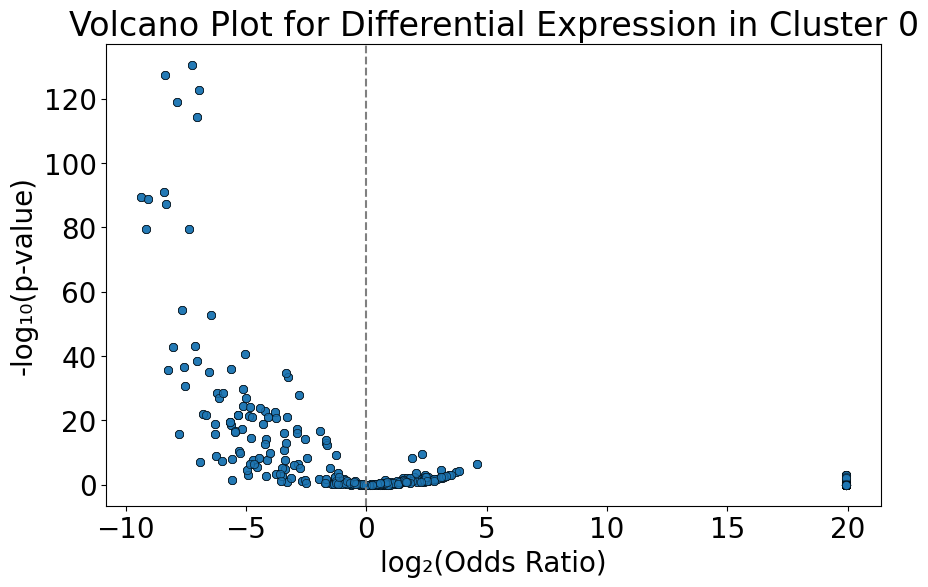

In [1567]:
import numpy as np
import matplotlib.pyplot as plt

# Assume df_cluster2 is a DataFrame with index = gene names and columns:
#   'p_val' and 'odds_ratio'
# For the volcano plot, we compute log2(odds_ratio) as the x-axis,
# and –log10(p_val) as the y-axis.

# Add a small constant to p-values in case some p-values are 0.
epsilon = 1e-300
df_cluster2 = result_df.copy()
df_cluster2['log2_OR'] = np.log2(df_cluster2['odds_ratio'])
df_cluster2['neg_log10_p'] = -np.log10(df_cluster2['p_val'] + epsilon)

# Create a volcano plot.
plt.figure(figsize=(10, 6))
plt.scatter(df_cluster2['log2_OR'], df_cluster2['neg_log10_p'], 
            alpha=0.7, edgecolor='k', linewidth=0.5)

# Draw a vertical line at 0 for reference (no enrichment vs. depletion).
plt.axvline(x=0, color='grey', linestyle='--')

plt.xlabel('log₂(Odds Ratio)')
plt.ylabel('-log₁₀(p-value)')
plt.title(f'Volcano Plot for Differential Expression in Cluster {interest}')

plt.show()


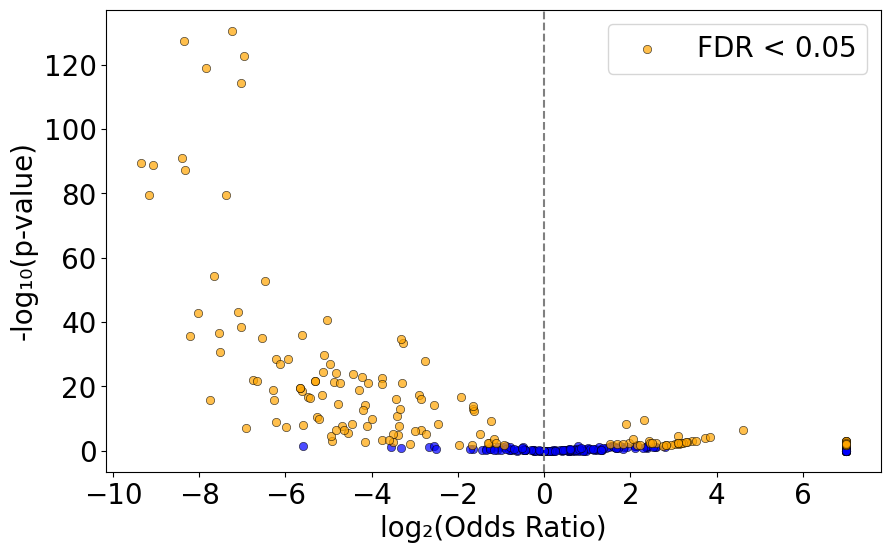

In [1569]:
# Copy your result DataFrame to avoid modifying the original
df_cluster2 = result_df_unique.copy()

# Add a tiny constant to p-values to avoid taking log of zero.
epsilon = 1e-300
df_cluster2['log2_OR'] = np.log2(df_cluster2['odds_ratio'])
df_cluster2['neg_log10_p'] = -np.log10(df_cluster2['p_val'] + epsilon)
df_cluster2['log2_OR'] = df_cluster2['log2_OR'].clip(upper=7)

# Define which points are significant.
sig_mask = df_cluster2['p_val_adj'] < 0.05

plt.figure(figsize=(10, 6))

# Plot the non-significant points first (in blue).
plt.scatter(
    df_cluster2.loc[~sig_mask, 'log2_OR'],
    df_cluster2.loc[~sig_mask, 'neg_log10_p'],
    color='blue',
    alpha=0.7,
    edgecolor='k',
    linewidth=0.5,
)

# Plot the significant points (in orange).
plt.scatter(
    df_cluster2.loc[sig_mask, 'log2_OR'],
    df_cluster2.loc[sig_mask, 'neg_log10_p'],
    color='orange',
    alpha=0.7,
    edgecolor='k',
    linewidth=0.5,
    label='FDR < 0.05'
)

# Vertical reference line at x=0
plt.axvline(x=0, color='grey', linestyle='--')

plt.xlabel('log₂(Odds Ratio)')
plt.ylabel('-log₁₀(p-value)')
plt.legend()
plt.show()

In [1570]:
result_df_unique.sort_values('p_val').head(230)

,gene,gene_symbols,count_R_in,count_R_out,count_S_in,count_S_out,odds_ratio,p_val,p_val_adj
51,85430,Col3a1,1578,309,7,207,0.006622,2.439327e-131,9.367017e-129
80,124829,Col3a1,1578,309,3,192,0.003060,3.937287e-128,7.559591e-126
82,125404,Col3a1,1578,309,8,196,0.007993,1.796104e-123,2.299014e-121
77,123649,Col3a1,1578,309,4,181,0.004327,8.113624e-120,7.789079e-118
78,124232,Col3a1,1578,309,7,180,0.007615,4.603792e-115,3.535712e-113
69,111412,Col3a1,1578,309,2,132,0.002967,8.155404e-92,5.219459e-90
81,125403,Col3a1,1578,309,1,127,0.001542,3.071268e-90,1.684810e-88
350,2117669,Olfml3,1028,308,1,161,0.001861,1.551036e-89,7.444970e-88
68,110951,Col3a1,1578,309,2,126,0.003108,7.078429e-88,3.020130e-86
79,124795,Col3a1,1578,309,1,112,0.001748,3.077412e-80,1.148932e-78


In [1530]:
# Tpm1, Nes, Qpct, Cdk6, Ywhae, Col1a2, Pgk1, Mgp

In [1580]:
aa = df_cluster2.loc[df_cluster2["p_val_adj"] < 0.05,:]
print(aa.shape)
aa = aa.loc[aa["odds_ratio"] > 1,:]
print(aa.shape)
aa = df_cluster2.loc[df_cluster2["p_val_adj"] < 0.05,:]
aa = aa.loc[aa["odds_ratio"] < 1,:]
print(aa.shape)

(188, 11)
(41, 11)
(147, 11)


In [1572]:
cluster = interest
print(cluster)

0


In [1578]:
xxxx = list(set(list(aa.loc[:,'gene_symbols'])))
with open(f'output.0_vs_2.up.cluster_{cluster}.txtx', 'w') as f:
    for item in xxxx:
        f.write(f"{item}\n")

In [1581]:
xxxx = list(set(list(aa.loc[:,'gene_symbols'])))
with open(f'output.0_vs_2.down.cluster_{cluster}.txtx', 'w') as f:
    for item in xxxx:
        f.write(f"{item}\n")

In [1575]:
xxxx = list(set(list(df_cluster2.loc[:,'gene_symbols'])))
with open(f'output.0_vs_2.all_cluster_{cluster}.txtx', 'w') as f:
    for item in xxxx:
        f.write(f"{item}\n")

In [1576]:
df_cluster2.to_csv(f'output.0_vs_2.df_cluster_{cluster}.txtx')

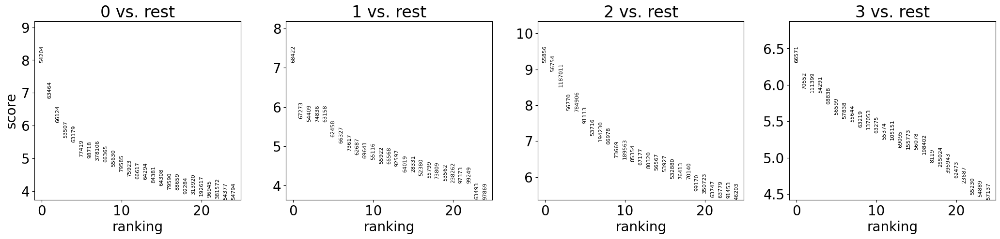

In [1477]:
sc.tl.rank_genes_groups(adata_cluster0, "leiden", method="t-test")
sc.pl.rank_genes_groups(adata_cluster0, n_genes=25, sharey=False)

In [1478]:
df_cluster2.shape

(384, 11)

In [1206]:
adata2_subset

AnnData object with n_obs × n_vars = 2776 × 21882
    obs: 'cell_counts', 'n_genes', 'pass_count_filter', 'leiden', 'leiden2'
    var: 'gene_id', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_symbols', 'dispersion', 'dispersion2', 'logreg_coef_1'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [1212]:
adata2_subset.var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2,logreg_coef_1
13,"1617,1620,1621,18416,59345,146648",1210.0,981,True,0.194927,-0.149914,0.501180,"Gm12174,Rpl7,Rpl7-ps9,Gm7059",0.000000,0.000000,-0.051659
34,11889,87.0,85,True,0.018085,-0.046270,0.712173,Gm5175,0.000000,0.000000,-0.000078
152,"1617,1618,1620,1621,1622",365.0,335,True,0.062836,-0.128850,0.544062,Rpl7,0.984709,0.000000,-0.005939
171,"1617,1619,1620,1621,1622,99359,5330023,5330024...",113.0,108,True,0.020768,0.081213,0.971694,"Rpl7-ps7,Rpl7",0.000000,0.000000,-0.005658
180,43443,114.0,112,True,0.022164,-0.149047,0.502945,Rpl7-ps8,0.000000,0.000000,-0.005624
...,...,...,...,...,...,...,...,...,...,...,...
2884436,"13647,13650,123375",68.0,65,True,0.012639,-0.046353,0.712003,"Rps12,Gm44510",0.945678,0.000000,-0.000257
2884915,"34644,34646,82453,82454,82455,82457,131890",92.0,87,True,0.017208,-0.137132,0.527201,"Gm5148,Gm10689,Rps23,Rps23-ps1",0.000000,0.000000,0.003283
2885328,"10945,10950,10952,10954",68.0,68,True,0.014522,-0.093045,0.616951,Metap2,0.951532,0.095238,-0.009277
2885416,"60540,60543,60544,60551,60552,60562,60572",70.0,67,True,0.013869,-0.108550,0.585387,1110038B12Rik,0.980114,0.000000,0.004213


In [1582]:
adata2_subset.obs['leiden3'] = adata2_subset.obs['leiden2'].astype(str)

The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.


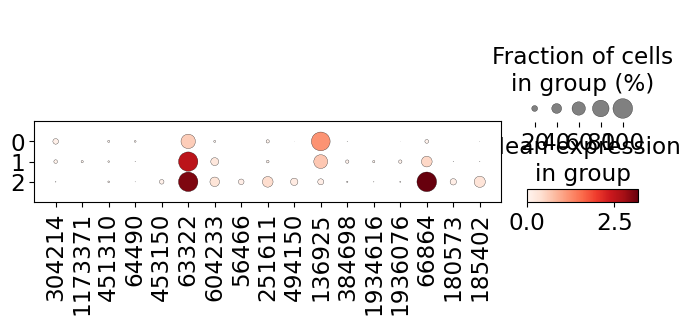

In [1583]:
sc.pl.dotplot(adata2_subset, ['304214', '1173371',
                              '451310','64490','453150',
                              '63322', '604233', '56466',
                              '251611', '494150',
                              '136925', '384698', '1934616', '1936076',
                              '66864', '180573', '185402'
                             ], groupby="leiden3", dot_max=1);

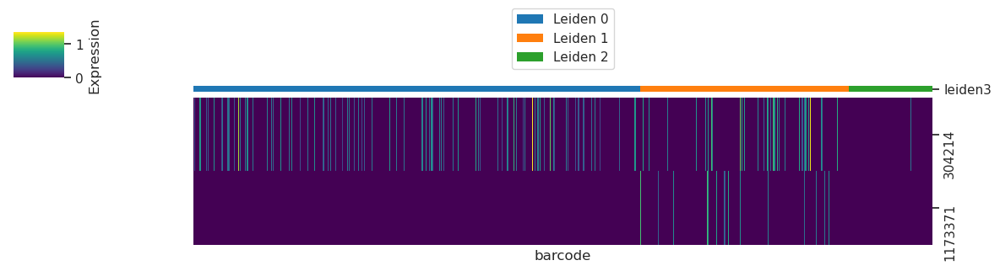

In [1587]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Genes of interest
genes = ['304214', '1173371']

# Extract expression matrix (cells x genes)
expr = adata2_subset[:, genes].X
if not isinstance(expr, np.ndarray):
    expr = expr.toarray()
expr_df = pd.DataFrame(expr.T, index=genes, columns=adata2_subset.obs_names)

# Get Leiden cluster info and sort cells by it
leiden_series = adata2_subset.obs['leiden3'].astype(str)
sorted_cells = leiden_series.sort_values().index
expr_df = expr_df[sorted_cells]
leiden_sorted = leiden_series.loc[sorted_cells]

# Assign a unique color to each Leiden cluster
unique_clusters = sorted(leiden_sorted.unique())
palette = sns.color_palette("tab10", len(unique_clusters))
lut = dict(zip(unique_clusters, palette))
col_colors = leiden_sorted.map(lut)

# Plot heatmap with column color labels
sns.set(style="white")
g = sns.clustermap(
    expr_df,
    col_colors=col_colors,
    row_cluster=False,
    col_cluster=False,
    cmap="viridis",
    xticklabels=False,
    yticklabels=True,
    figsize=(12, 3),
    cbar_kws={'label': 'Expression'}
)

# Add legend for leiden clusters
for label in unique_clusters:
    g.ax_col_dendrogram.bar(0, 0, color=lut[label], label=f'Leiden {label}', linewidth=0)
g.ax_col_dendrogram.legend(loc="center", ncol=len(unique_clusters)//2, bbox_to_anchor=(0.5, 1.1))

plt.show()


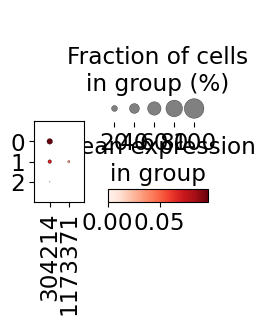

In [1584]:
sc.pl.dotplot(adata2_subset, ['304214', '1173371',
                             ], groupby="leiden3", dot_max=1);

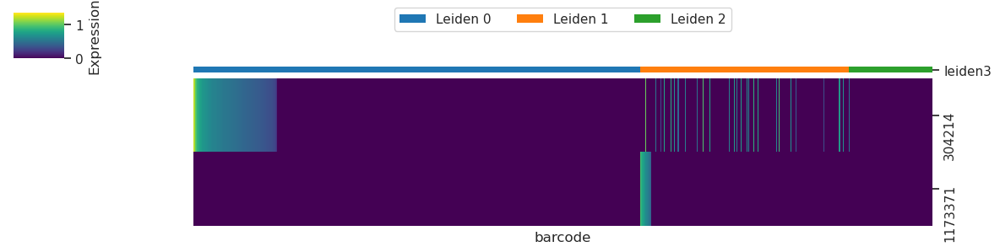

In [1588]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Genes of interest
genes = ['304214', '1173371']
gene_sort_key = {'0': '304214', '1': '1173371', '2': '304214'}

# Extract expression matrix (cells x genes)
expr = adata2_subset[:, genes].X
if not isinstance(expr, np.ndarray):
    expr = expr.toarray()
expr_df = pd.DataFrame(expr.T, index=genes, columns=adata2_subset.obs_names)

# Get Leiden cluster info
leiden_series = adata2_subset.obs['leiden3'].astype(str)

# Sort cells within each cluster
sorted_cells = []
for cluster in sorted(leiden_series.unique()):
    cells_in_cluster = leiden_series[leiden_series == cluster].index
    sort_gene = gene_sort_key.get(cluster, genes[0])  # Default fallback
    expr_values = expr_df.loc[sort_gene, cells_in_cluster]
    sorted_cells_cluster = expr_values.sort_values(ascending=False).index
    sorted_cells.extend(sorted_cells_cluster)

# Reorder expression matrix and Leiden labels
expr_df_sorted = expr_df[sorted_cells]
leiden_sorted = leiden_series.loc[sorted_cells]

# Assign a color to each cluster
unique_clusters = sorted(leiden_sorted.unique())
palette = sns.color_palette("tab10", len(unique_clusters))
lut = dict(zip(unique_clusters, palette))
col_colors = leiden_sorted.map(lut)

# Plot heatmap
sns.set(style="white")
g = sns.clustermap(
    expr_df_sorted,
    col_colors=col_colors,
    row_cluster=False,
    col_cluster=False,
    cmap="viridis",
    xticklabels=False,
    yticklabels=True,
    figsize=(12, 3),
    cbar_kws={'label': 'Expression'}
)

# Add legend for Leiden clusters
for label in unique_clusters:
    g.ax_col_dendrogram.bar(0, 0, color=lut[label], label=f'Leiden {label}', linewidth=0)
g.ax_col_dendrogram.legend(loc="center", ncol=len(unique_clusters), bbox_to_anchor=(0.5, 1.1))

plt.show()


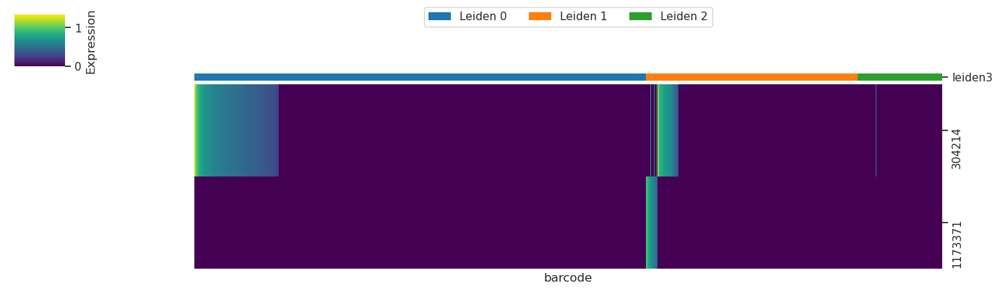

In [1590]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Genes of interest
genes = ['304214', '1173371']
# Which gene to sort by for each Leiden cluster
gene_sort_key = {'0': ['304214'], '2': ['1173371'], '1': ['1173371', '304214']}

# Extract expression matrix (cells x genes)
expr = adata2_subset[:, genes].X
if not isinstance(expr, np.ndarray):
    expr = expr.toarray()
expr_df = pd.DataFrame(expr.T, index=genes, columns=adata2_subset.obs_names)

# Get Leiden cluster info
leiden_series = adata2_subset.obs['leiden3'].astype(str)

# Sort cells within each cluster
sorted_cells = []
for cluster in sorted(leiden_series.unique()):
    cells_in_cluster = leiden_series[leiden_series == cluster].index
    expr_sub = expr_df.loc[:, cells_in_cluster]
    
    sort_genes = gene_sort_key.get(cluster, [genes[0]])  # Default fallback
    
    # Build DataFrame for sorting
    sort_df = expr_sub.loc[sort_genes].T  # cells x sort_genes
    
    # Sort by multiple columns, all descending
    sorted_cells_cluster = sort_df.sort_values(
        by=sort_genes,
        ascending=[False] * len(sort_genes)
    ).index
    
    sorted_cells.extend(sorted_cells_cluster)

# Reorder expression matrix and Leiden labels
expr_df_sorted = expr_df[sorted_cells]
leiden_sorted = leiden_series.loc[sorted_cells]

# Assign a color to each cluster
unique_clusters = sorted(leiden_sorted.unique())
palette = sns.color_palette("tab10", len(unique_clusters))
lut = dict(zip(unique_clusters, palette))
col_colors = leiden_sorted.map(lut)

# Plot heatmap
sns.set(style="white")
g = sns.clustermap(
    expr_df_sorted,
    col_colors=col_colors,
    row_cluster=False,
    col_cluster=False,
    cmap="viridis",
    xticklabels=False,
    yticklabels=True,
    figsize=(14, 4),
    cbar_kws={'label': 'Expression'}
)

# Add legend for Leiden clusters
for label in unique_clusters:
    g.ax_col_dendrogram.bar(0, 0, color=lut[label], label=f'Leiden {label}', linewidth=0)
g.ax_col_dendrogram.legend(loc="center", ncol=len(unique_clusters), bbox_to_anchor=(0.5, 1.1))

plt.show()


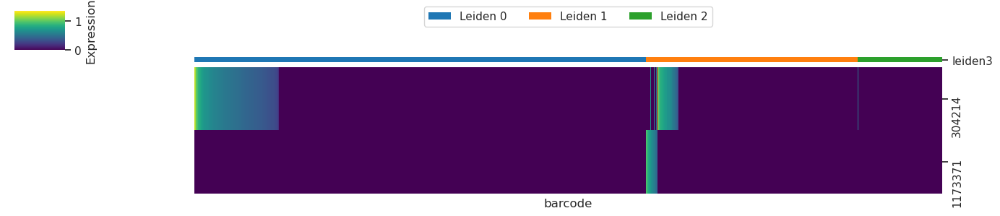

In [1591]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Genes of interest
genes = ['304214', '1173371']

# Extract expression matrix (cells x genes)
expr = adata2_subset[:, genes].X
if not isinstance(expr, np.ndarray):
    expr = expr.toarray()
expr_df = pd.DataFrame(expr.T, index=genes, columns=adata2_subset.obs_names)

# Get Leiden cluster info
leiden_series = adata2_subset.obs['leiden3'].astype(str)

# Sort cells within each cluster
sorted_cells = []
for cluster in sorted(leiden_series.unique()):
    cells_in_cluster = leiden_series[leiden_series == cluster].index
    expr_sub = expr_df.loc[:, cells_in_cluster]
    
    if cluster in ['0', '2']:
        # Sort by 304214 descending
        sort_values = expr_sub.loc['304214']
        sorted_cluster = sort_values.sort_values(ascending=False).index
    elif cluster == '1':
        # Sort first by 1173371 descending, then 304214 descending
        sort_values = expr_sub.loc[['1173371', '304214']].T
        sorted_cluster = sort_values.sort_values(
            by=['1173371', '304214'], ascending=[False, False]
        ).index
    else:
        # Default: sort by 304214
        sort_values = expr_sub.loc['304214']
        sorted_cluster = sort_values.sort_values(ascending=False).index

    sorted_cells.extend(sorted_cluster)

# Reorder expression matrix and Leiden labels
expr_df_sorted = expr_df[sorted_cells]
leiden_sorted = leiden_series.loc[sorted_cells]

# Assign a color to each cluster
unique_clusters = sorted(leiden_sorted.unique())
palette = sns.color_palette("tab10", len(unique_clusters))
lut = dict(zip(unique_clusters, palette))
col_colors = leiden_sorted.map(lut)

# Plot heatmap
sns.set(style="white")
g = sns.clustermap(
    expr_df_sorted,
    col_colors=col_colors,
    row_cluster=False,
    col_cluster=False,
    cmap="viridis",
    xticklabels=False,
    yticklabels=True,
    figsize=(14, 3),
    cbar_kws={'label': 'Expression'}
)

# Add legend for Leiden clusters
for label in unique_clusters:
    g.ax_col_dendrogram.bar(0, 0, color=lut[label], label=f'Leiden {label}', linewidth=0)
g.ax_col_dendrogram.legend(loc="center", ncol=len(unique_clusters), bbox_to_anchor=(0.5, 1.1))

plt.show()


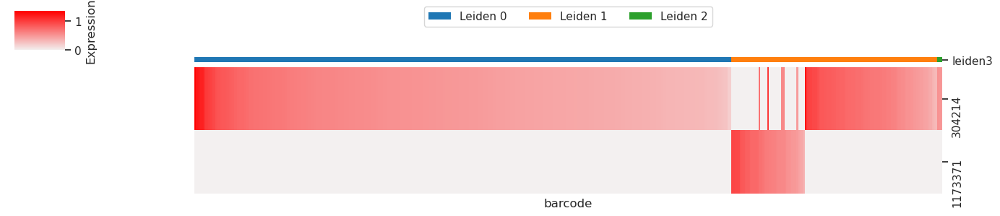

In [1595]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Genes of interest
genes = ['304214', '1173371']

# Extract expression matrix (cells x genes)
expr = adata2_subset[:, genes].X
if not isinstance(expr, np.ndarray):
    expr = expr.toarray()
expr_df = pd.DataFrame(expr.T, index=genes, columns=adata2_subset.obs_names)

# Exclude cells with 0 expression for BOTH genes
nonzero_cells = ~((expr_df.loc['304214'] == 0) & (expr_df.loc['1173371'] == 0))
expr_df = expr_df.loc[:, nonzero_cells.index[nonzero_cells]]

# Update Leiden info to only include remaining cells
leiden_series = adata2_subset.obs.loc[expr_df.columns, 'leiden3'].astype(str)

# Sort cells within each cluster
sorted_cells = []
for cluster in sorted(leiden_series.unique()):
    cells_in_cluster = leiden_series[leiden_series == cluster].index
    expr_sub = expr_df.loc[:, cells_in_cluster]
    
    if cluster in ['0', '2']:
        # Sort by 304214 descending
        sort_values = expr_sub.loc['304214']
        sorted_cluster = sort_values.sort_values(ascending=False).index
    elif cluster == '1':
        # Sort first by 1173371 descending, then 304214 descending
        sort_values = expr_sub.loc[['1173371', '304214']].T
        sorted_cluster = sort_values.sort_values(
            by=['1173371', '304214'], ascending=[False, False]
        ).index
    else:
        # Default: sort by 304214
        sort_values = expr_sub.loc['304214']
        sorted_cluster = sort_values.sort_values(ascending=False).index

    sorted_cells.extend(sorted_cluster)

# Reorder expression matrix and Leiden labels
expr_df_sorted = expr_df[sorted_cells]
leiden_sorted = leiden_series.loc[sorted_cells]

# Assign a color to each cluster
unique_clusters = sorted(leiden_sorted.unique())
palette = sns.color_palette("tab10", len(unique_clusters))
lut = dict(zip(unique_clusters, palette))
col_colors = leiden_sorted.map(lut)

# Plot heatmap
sns.set(style="white")
g = sns.clustermap(
    expr_df_sorted,
    col_colors=col_colors,
    row_cluster=False,
    col_cluster=False,
    cmap=sns.light_palette("red", as_cmap=True),
    xticklabels=False,
    yticklabels=True,
    figsize=(14, 3),
    cbar_kws={'label': 'Expression'}
)


# Add legend for Leiden clusters
for label in unique_clusters:
    g.ax_col_dendrogram.bar(0, 0, color=lut[label], label=f'Leiden {label}', linewidth=0)
g.ax_col_dendrogram.legend(loc="center", ncol=len(unique_clusters), bbox_to_anchor=(0.5, 1.1))

plt.show()


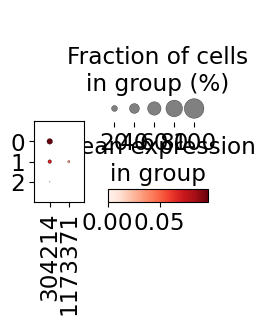

In [1342]:
sc.pl.dotplot(adata2_subset, ['304214', '1173371',
                             ], groupby="leiden3", dot_max=1);

In [ ]:
# P2ry12; Tubb5; Fos; Adamts4; Nes; Col1a2

In [ ]:
# Lbp = not good

In [1168]:
# Tpm1
# Tpm1, Nes, Qpct, Cdk6, Ywhae, Col1a2, Pgk1, Mgp

In [1185]:
adata2_subset_filtered[:,'62411'].var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2,logreg_coef_1
62411,"139347,139354,139356,139357,139358,139359,1393...",578.0,431,True,0.081529,0.071543,0.95201,Tpm1,0.935785,0.0,-0.035242


In [1125]:
adata2_subset_filtered[:,'40071'].var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2,logreg_coef_1
40071,"103692,103698,2980679,2980680",165.0,158,True,0.029903,0.003646,0.813789,Actb,0.979379,0.118519,-0.011606


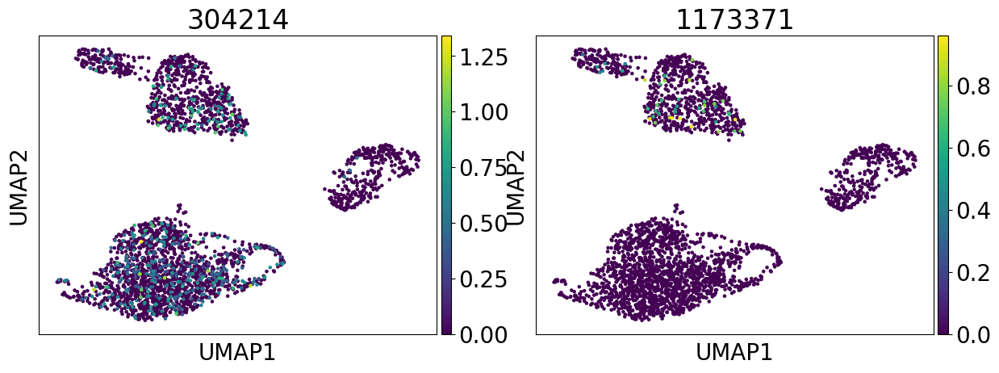

In [1292]:
sc.pl.umap(adata2_subset_filtered, color=["304214", "1173371"])


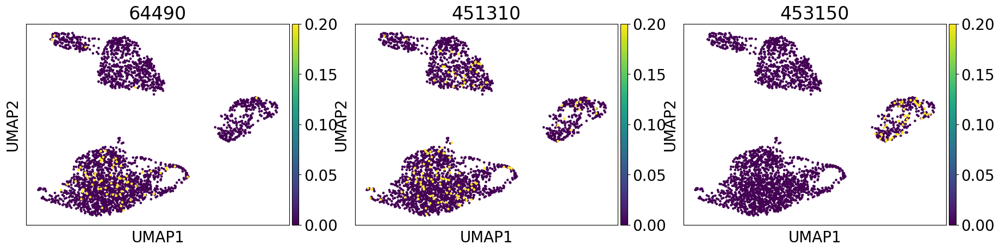

In [1350]:
sc.pl.umap(adata2_subset, color=["64490", "451310", "453150"], vmax=0.2)

In [1355]:
adata2_subset_filtered[:,'63322'].var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion,dispersion2,logreg_coef_1
63322,25823,48372.0,6043,True,2.517548,3.911372,2.050427,Fos,0.91064,0.444444,0.069662


In [1357]:
# Tubb5; Fos; Adamts4; Nes; Col1a2
adata[:, adata.var["gene_symbols"] == "Tubb5"].var # 69312, 95258, 52013, 91171, 177536

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
64490,"56035,5446471",100.0,97,True,0.019120,-0.072042,0.659707,Tubb5,0.983171
451310,"56035,56038",263.0,256,True,0.032764,-0.089484,0.624200,Tubb5,0.983171
453150,"56035,325021",81.0,72,True,0.013487,0.007902,0.822453,Tubb5,0.983171


In [1237]:
adata[:, adata.var["gene_symbols"] == "Lbp"].var # 69312, 95258, 52013, 91171, 177536

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
92784,"73498,2648287,2675163",90.0,73,True,0.016459,0.141901,1.095239,Lbp,0.816547
113836,"73498,5642571,5759754",77.0,59,True,0.015397,0.105490,1.021116,Lbp,0.816547
230085,73498,1212.0,426,True,0.233678,1.719874,3.546010,Lbp,0.816547
536322,73501,61.0,55,True,0.013812,0.326717,1.471479,Lbp,0.816547
1088123,"73498,2595511,5642571,5759754",120.0,90,True,0.024925,0.437889,1.697795,Lbp,0.816547
1729101,"73498,2595511",132.0,100,True,0.029541,0.387779,1.595785,Lbp,0.816547


In [1348]:
adata[:, adata.var["gene_symbols"] == "P2ry12"].var # 69312, 95258, 52013, 91171, 177536

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
304214,"85002,85003,85004,85005",527.0,469,True,0.097652,-0.126654,0.548532,P2ry12,0.9869
1173371,"85002,85003,85004,85005,2468998,2468999,246900...",59.0,57,True,0.017700,0.172136,1.156792,P2ry12,0.9869


In [1403]:
adata[:, adata.var["gene_symbols"] == "Lbp"].var # 69312, 95258, 52013, 91171, 177536

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
92784,"73498,2648287,2675163",90.0,73,True,0.016459,0.141901,1.095239,Lbp,0.816547
113836,"73498,5642571,5759754",77.0,59,True,0.015397,0.105490,1.021116,Lbp,0.816547
230085,73498,1212.0,426,True,0.233678,1.719874,3.546010,Lbp,0.816547
536322,73501,61.0,55,True,0.013812,0.326717,1.471479,Lbp,0.816547
1088123,"73498,2595511,5642571,5759754",120.0,90,True,0.024925,0.437889,1.697795,Lbp,0.816547
1729101,"73498,2595511",132.0,100,True,0.029541,0.387779,1.595785,Lbp,0.816547


In [ ]:
# 92784, 113836, 230085, 536322, 1088123, 1729101

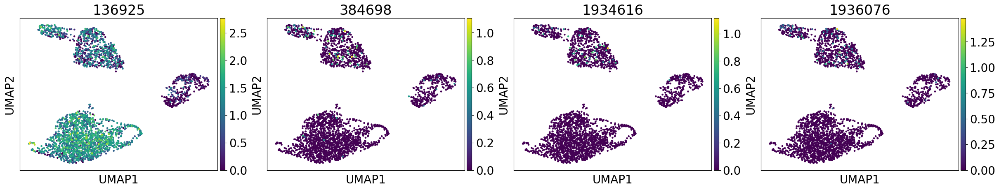

In [1171]:
sc.pl.umap(adata2_subset_filtered, color=["136925","384698", "1934616", "1936076"])


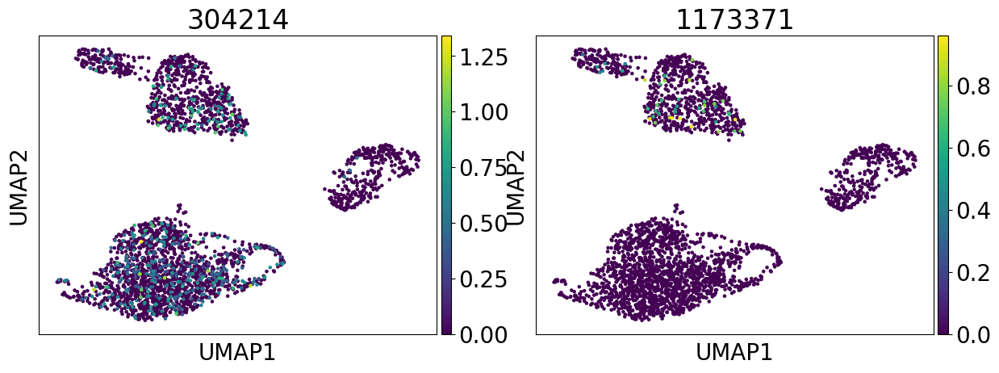

In [1173]:
sc.pl.umap(adata2_subset_filtered, color=["304214","1173371"])


In [1293]:
import numpy as np
import pandas as pd
from scipy.sparse import issparse

def count_nonzero_per_cluster(adata, cluster_col='leiden3'):
    """
    Construct a DataFrame with rows = genes and columns = clusters,
    where each entry is the number of cells in that cluster that have
    a nonzero expression for the given gene.
    
    Parameters:
      adata : AnnData
          AnnData object with .obs[cluster_col] for cluster assignments
          and .var_names for gene identifiers, and .X as an expression matrix.
      cluster_col : str, optional (default='leiden3')
          The column in adata.obs that defines the clusters.
    
    Returns:
      pandas.DataFrame
          A DataFrame with shape (n_genes, n_clusters). The index is adata.var_names
          (gene identifiers), and the columns are the unique cluster labels. Each cell
          in the DataFrame is the count of cells in that cluster that have expression
          > 0 for the corresponding gene.
    """
    clusters = adata.obs[cluster_col].unique()
    clusters = np.sort(clusters)  # optional: sort the cluster labels
    genes = adata.var_names
    
    # Prepare an array to store the result: (n_genes, n_clusters)
    # We'll fill this with the counts of nonzero expression.
    count_array = np.zeros((len(genes), len(clusters)), dtype=int)
    
    for j, cluster_label in enumerate(clusters):
        # Get integer indices of cells belonging to this cluster
        cluster_idx = np.where(adata.obs[cluster_col] == cluster_label)[0]
        
        if len(cluster_idx) == 0:
            # If there are no cells in this cluster, leave counts as 0
            continue
        
        # Subset .X to these cells
        X_cluster = adata.X[cluster_idx, :]
        
        # Convert to a 0/1 matrix (1 if expression > 0). This works with sparse or dense.
        X_bin = (X_cluster > 0).astype(int)
        
        # Sum along axis=0 (over cells) to get the number of cells with nonzero expression per gene
        # Make sure to flatten to a 1D array
        counts = np.array(X_bin.sum(axis=0)).flatten()
        
        # Assign these counts to the appropriate column j
        count_array[:, j] = counts
    
    # Create a DataFrame with rows = genes, columns = clusters
    df = pd.DataFrame(count_array, index=genes, columns=clusters)
    return df

# Example usage:
# Suppose adata is your AnnData object with obs["leiden3"] storing cluster labels.
# Then:
# count_df = count_nonzero_per_cluster(adata, cluster_col='leiden3')
# count_df.head()
#
# This will show a DataFrame of shape (n_genes, n_clusters) where each
# entry is the number of cells in that cluster with expression > 0 for that gene.


In [1315]:
xx = count_nonzero_per_cluster(adata2_subset, 'leiden2')
gene_symbols_df = adata2_subset.var[['gene_symbols']]
xx = xx.merge(gene_symbols_df, left_index=True, right_index=True, how='left')


In [1316]:
xx

,0,1,2,gene_symbols
13,543,106,81,"Gm12174,Rpl7,Rpl7-ps9,Gm7059"
34,54,14,3,Gm5175
152,178,45,23,Rpl7
171,54,5,3,"Rpl7-ps7,Rpl7"
180,60,18,10,Rpl7-ps8
...,...,...,...,...
2884436,35,6,8,"Rps12,Gm44510"
2884915,46,11,7,"Gm5148,Gm10689,Rps23,Rps23-ps1"
2885328,37,14,5,Metap2
2885416,40,12,3,1110038B12Rik


In [1319]:
xx.loc[['304214', '1173371', '451310']]

,0,1,2,gene_symbols
304214,313,82,3,P2ry12
1173371,0,43,0,P2ry12
451310,84,28,12,Tubb5


In [1339]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_stacked_bars_horizontal(count_df, bar_thickness=0.8):
    """
    Plot a horizontally stacked bar chart where each row of 'count_df' is represented
    by a single horizontal bar, and each column in that row is a stack segment,
    representing a percentage of the row sum.

    Parameters:
      count_df: pandas.DataFrame
          Rows = items (e.g. genes), columns = categories (e.g. clusters),
          values = counts.
      bar_thickness: float, optional (default=0.8)
          The thickness (height) of each horizontal bar. Smaller values
          pack the bars closer vertically.
    """
    # 1) Compute row-wise sums
    row_sums = count_df.sum(axis=1)

    # 2) Convert to row-wise percentages
    percent_df = count_df.div(row_sums, axis=0) * 100

    # 3) Create a horizontally stacked bar chart
    ax = percent_df.plot(
        kind='barh',
        stacked=True,
        figsize=(10, 6),
        width=bar_thickness  # controls how thick each bar is along the y-axis
    )
    ax.invert_yaxis()

    plt.legend(title='Clusters', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Example usage:
# count_df = count_nonzero_per_cluster(adata, cluster_col='leiden3')
# plot_stacked_bars_horizontal(count_df, bar_thickness=0.6)


In [1398]:
import matplotlib.pyplot as plt

def plot_grouped_bars(df, ylabel="Counts"):
    """
    Produces a grouped (clustered) bar plot from df where each row is one group
    on the x-axis, and each column becomes a separate bar within that group.

    Parameters:
      df: pandas.DataFrame
          Rows = items, columns = categories to compare side by side.
          Values = raw counts (or any numeric).
      ylabel: str
          Label for the y-axis.
    """
    ax = df.plot(
        kind='bar',        # vertical bars
        stacked=False,     # grouped, not stacked
        figsize=(6, 6),
        width=0.8          # adjust as desired for spacing
    )
    plt.ylabel("Number of cells")
    plt.tight_layout()
    plt.xticks(rotation=0)
    plt.show()

# Example usage:
# Suppose 'count_df' has rows = genes, columns = cluster labels, 
# and integer counts as values. Then:
# plot_grouped_bars(count_df)


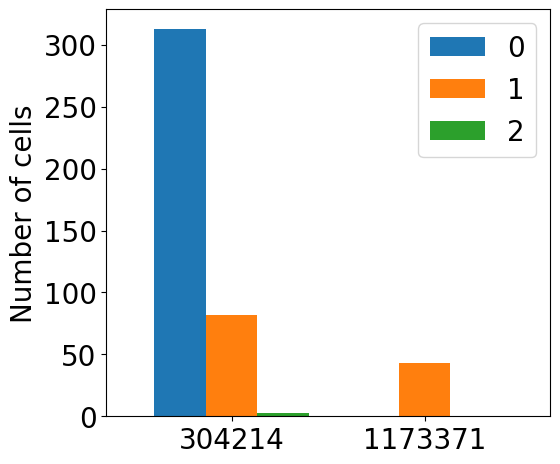

In [1399]:
plot_grouped_bars(xx.loc[['304214', '1173371',
                             ], [0,1,2]])

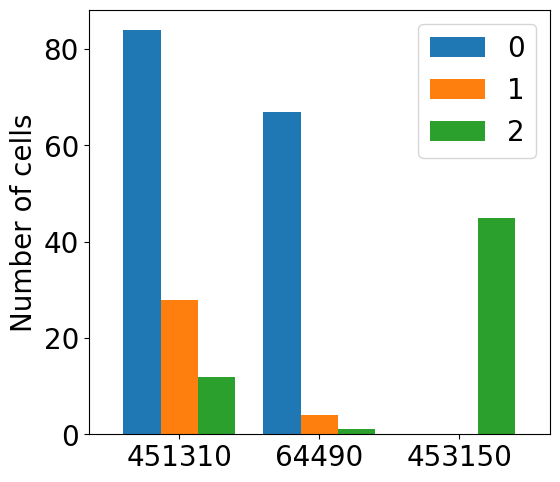

In [1400]:
plot_grouped_bars(xx.loc[['451310','64490','453150',
                             ], [0,1,2]])

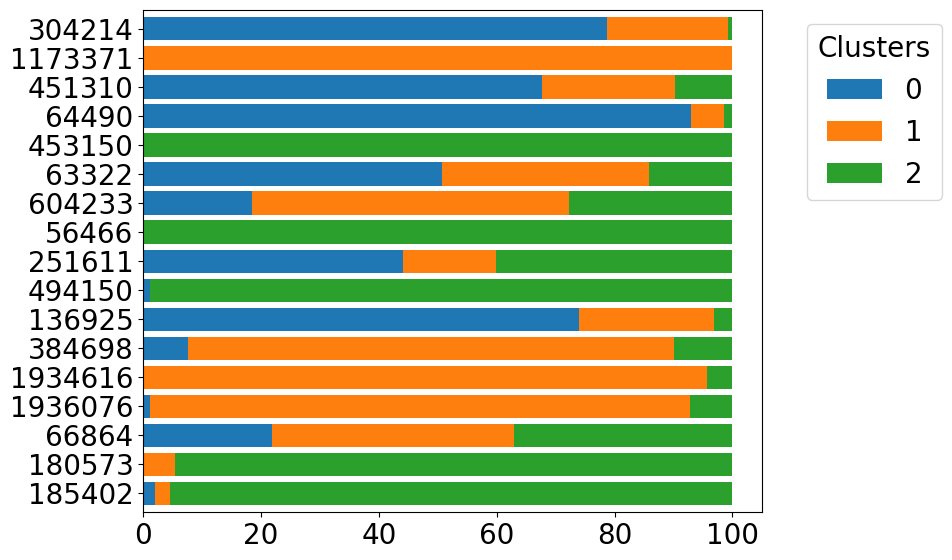

In [1340]:
plot_stacked_bars_horizontal(xx.loc[['304214', '1173371',
                              '451310','64490','453150',
                              '63322', '604233', '56466',
                              '251611', '494150',
                              '136925', '384698', '1934616', '1936076',
                              '66864', '180573', '185402'
                             ], [0,1,2]])


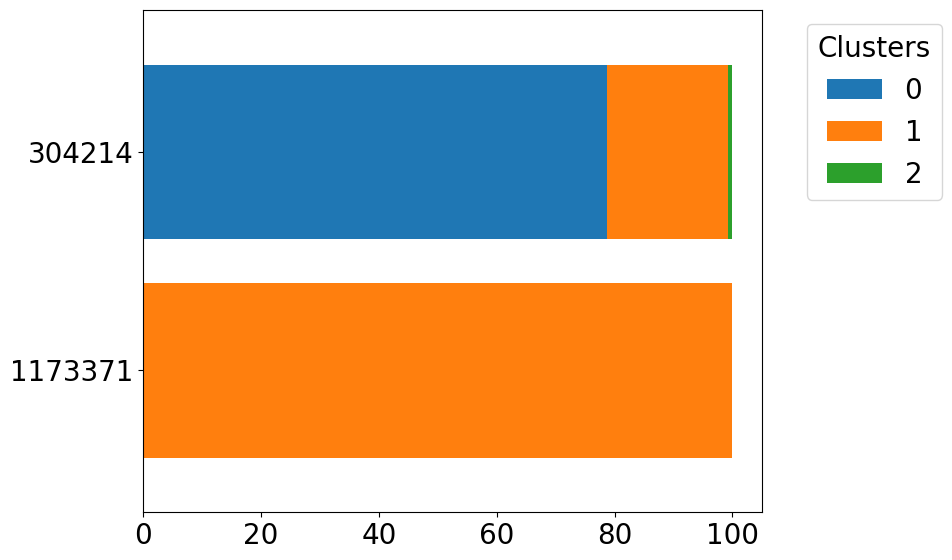

In [1346]:
plot_stacked_bars_horizontal(xx.loc[['304214', '1173371',
                             ], [0,1,2]])


In [1327]:
xx.loc[['304214', '1173371']]

,0,1,2,gene_symbols
304214,313,82,3,P2ry12
1173371,0,43,0,P2ry12


In [1341]:
xx.loc[['304214', '1173371',
                              '451310','64490','453150',
                              '63322', '604233', '56466',
                              '251611', '494150',
                              '136925', '384698', '1934616', '1936076',
                              '66864', '180573', '185402'
                             ], [0,1,2]]

,0,1,2
304214,313,82,3
1173371,0,43,0
451310,84,28,12
64490,67,4,1
453150,0,0,45
63322,1110,770,310
604233,80,233,120
56466,0,0,59
251611,153,55,139
494150,1,0,85


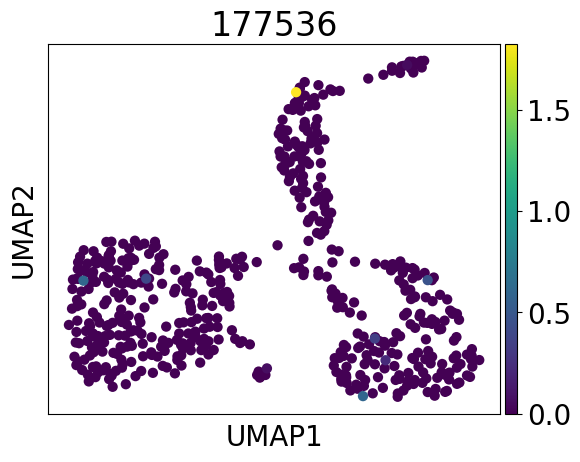

In [502]:
sc.pl.umap(adata, color=["177536"]) # 69312, 95258, 52013, 91171, 177536 # 13785/25232/38661

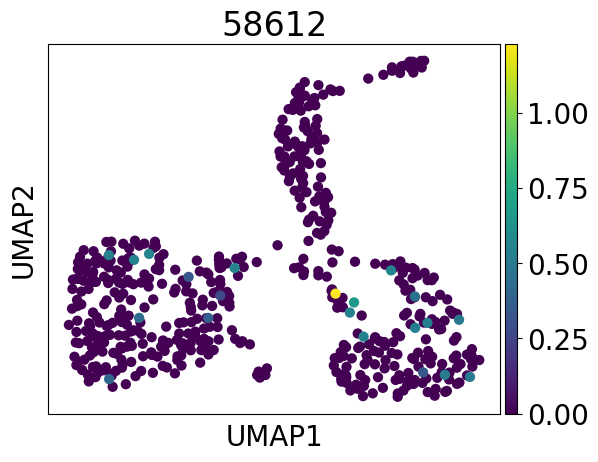

In [472]:
sc.pl.umap(adata, color=["58612"])

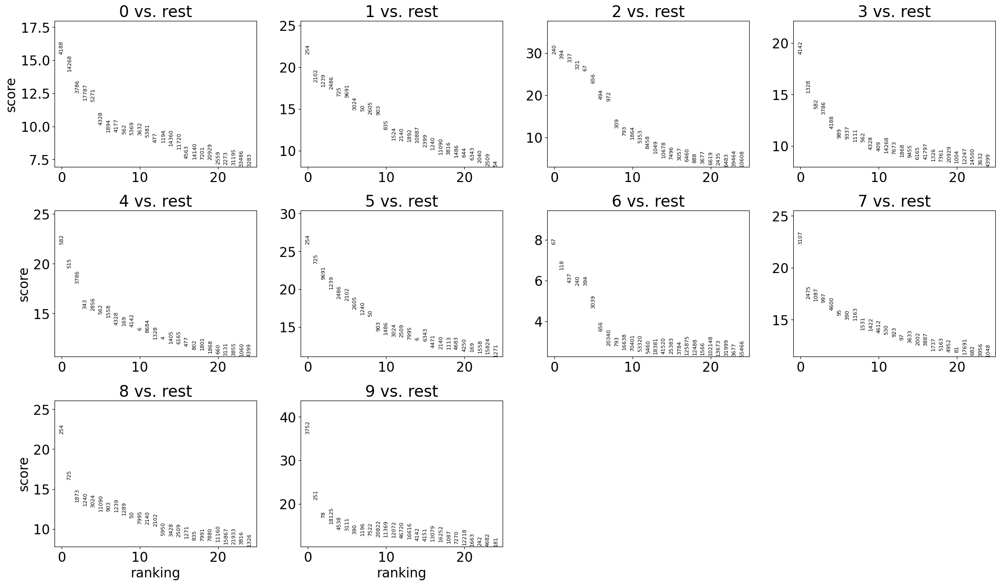

In [416]:
sc.tl.rank_genes_groups(adata, "leiden", method="t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

# Split clusters

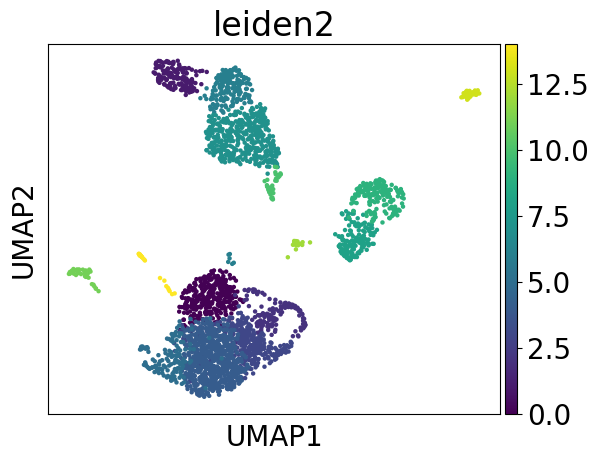

In [179]:
sc.pl.umap(adata2_subset, color=["leiden2"])

In [676]:
cluster="5"
# Get the intersection of barcodes from adata and adata2_subset
adata_tmp = data_backup.copy()
common_barcodes = adata_tmp.obs_names.intersection(adata2_subset[adata2_subset.obs["leiden2"] == cluster].obs_names)
adata_cluster0 = adata_tmp[common_barcodes].copy()


In [1432]:
adata_cluster0

AnnData object with n_obs × n_vars = 138 × 13325
    obs: 'cell_counts', 'n_genes', 'pass_count_filter', 'leiden', 'kmeans'
    var: 'gene_id', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'kmeans_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [678]:
sc.pp.normalize_total(adata_cluster0, target_sum=1e4)


In [679]:
sc.pp.log1p(adata_cluster0)

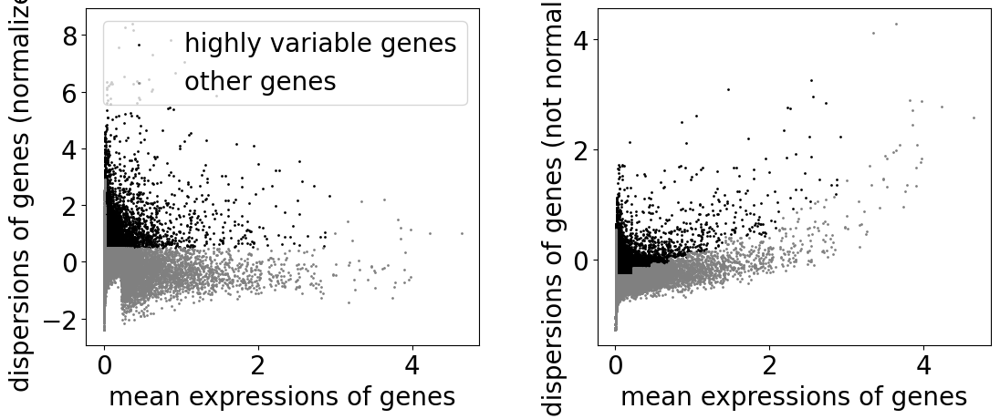

In [680]:
sc.pp.highly_variable_genes(adata_cluster0, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata_cluster0)

In [681]:
sc.tl.pca(adata_cluster0, svd_solver="arpack")


In [682]:
sc.pp.neighbors(adata_cluster0, n_neighbors=10, n_pcs=40)


In [683]:
adata_cluster0 = adata_cluster0[:, adata_cluster0.var.highly_variable]
sc.tl.leiden(
    adata_cluster0,
    resolution=0.6,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)

In [684]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(adata_cluster0.obsm["X_pca"])
adata_cluster0.obs["kmeans"] = kmeans.labels_.astype(str)  # convert to string for plotting

In [685]:
sc.tl.paga(adata_cluster0)
sc.pl.paga(adata_cluster0, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata_cluster0, init_pos='paga')


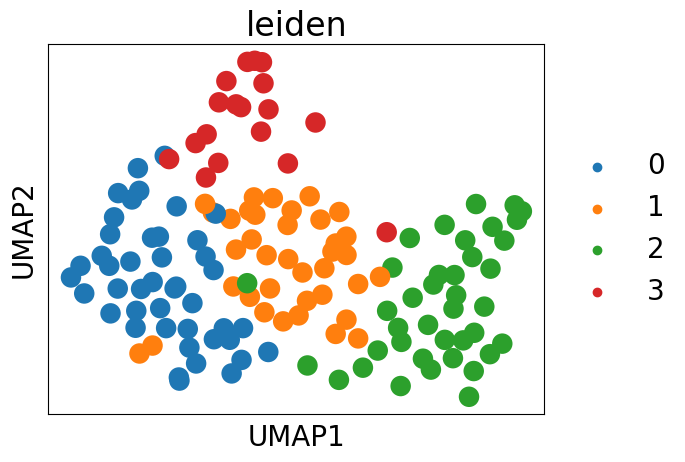

In [686]:
sc.pl.umap(adata_cluster0, color=["leiden"])

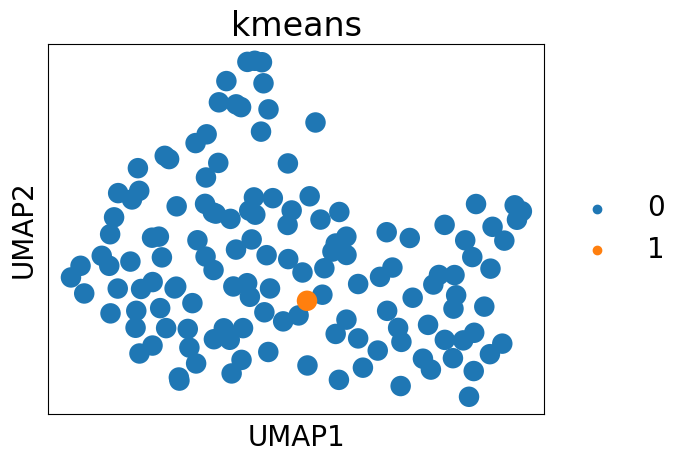

In [687]:
sc.pl.umap(adata_cluster0, color="kmeans")

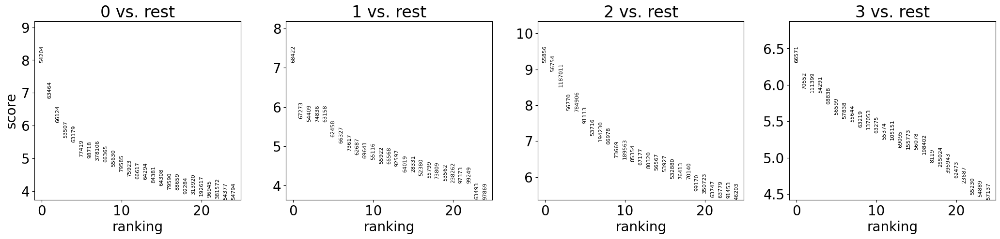

In [688]:
sc.tl.rank_genes_groups(adata_cluster0, "leiden", method="t-test")
sc.pl.rank_genes_groups(adata_cluster0, n_genes=25, sharey=False)

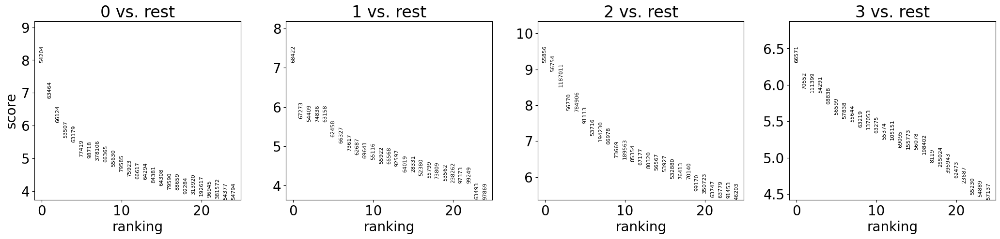

In [690]:
sc.tl.rank_genes_groups(adata_cluster0, "leiden", method="t-test")
sc.pl.rank_genes_groups(adata_cluster0, n_genes=25, sharey=False)

In [726]:
adata_cluster0[:, ["28331"]].var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
28331,6923,60219.0,7337,True,2.412877,1.276379,0.87446


In [702]:
adata[:, adata.var["gene_id"] == "145528,145529,145535"].var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion


In [728]:
adata[:, adata.var["gene_symbols"] == "Ccnd1,LTO1"].var

,gene_id,gene_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,gene_symbols,dispersion
54204,"125992,125999",19591.0,4030,True,1.565340,1.116560,0.807950,"Ccnd1,LTO1",0.968797
1507596,"125992,125999,3465826,3465827",179.0,166,True,0.029868,0.093481,0.996670,"Ccnd1,LTO1",0.968797
1507713,"125992,125999,5247999,5248000,5812509,5812510",93.0,92,True,0.015581,-0.137011,0.527447,"Ccnd1,LTO1",0.968797
1507858,"125992,125999,5017491,5017492,5271795,5271796",92.0,88,True,0.016460,0.037310,0.882321,"Ccnd1,LTO1",0.968797


In [501]:
cluster

9

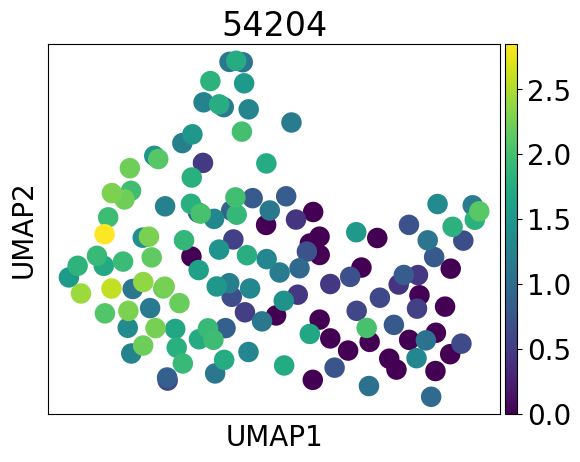

In [704]:
sc.pl.umap(adata_cluster0, color="54204") # 663965, 147133, 65716, 657822, 125404; cluster 8+9

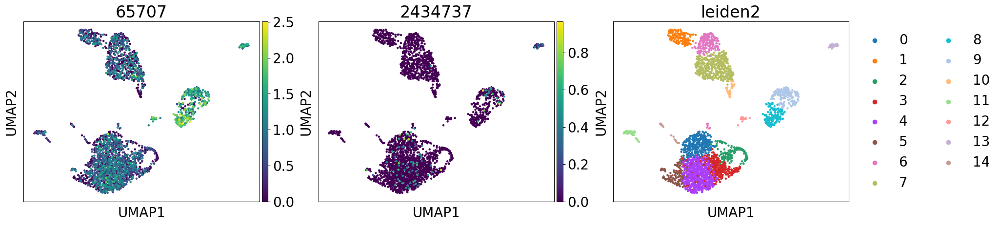

In [671]:
sc.pl.umap(adata2_subset, color=["65707", "2434737", "leiden2"])

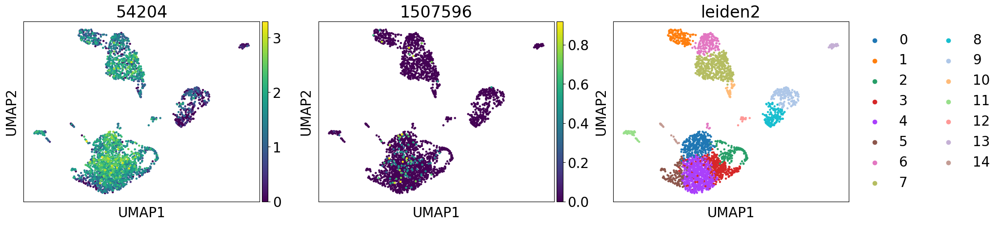

In [698]:
sc.pl.umap(adata2_subset, color=["54204", "1507596", "leiden2"])

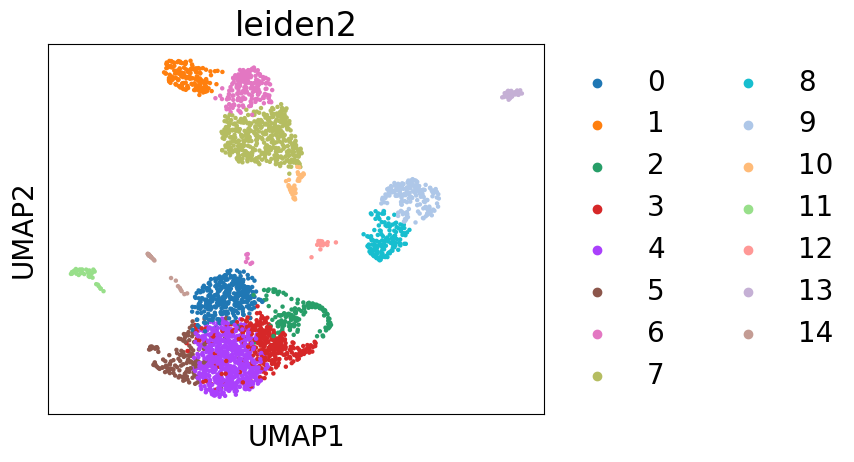

In [675]:
sc.pl.umap(adata2_subset, color="leiden2") # 125404, cluster 8

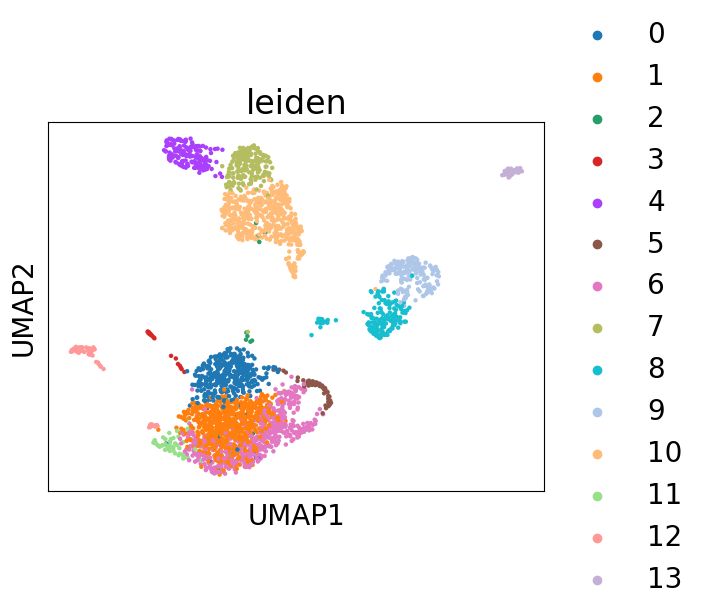

In [673]:
sc.pl.umap(adata2_subset, color=["leiden"], vmax=0.2)

In [529]:
adata4_subset = adata3_subset.copy()
adata4_subset.obs["leiden2"] = adata4_subset.obs["leiden2"].astype(str)

In [539]:
adata2_subset.obs["leiden2"] = adata2_subset.obs["leiden2"].astype(str)

In [519]:
adata4_subset.obs

,cell_counts,n_genes,pass_count_filter,leiden,leiden2
barcode,,,,,
AAACCTGAGATGAGAG,20598.0,7499,True,0,0
AAACCTGCACCACCAG,17191.0,6462,True,1,1
AAACCTGCATACTACG,15866.0,6431,True,2,2
AAACCTGGTTTAGGAA,10367.0,4979,True,0,0
AAACCTGTCATACGGT,15001.0,6606,True,3,3
...,...,...,...,...,...
TTTGTCACAGTGAGTG,6615.0,3332,True,6,6
TTTGTCAGTAAGAGAG,6248.0,3483,True,9,9
TTTGTCAGTAGGCTGA,10293.0,5514,True,7,7


# Load in allele-specific mapping GeneFull anndatas and subset them to contain same barcodes as the filtered total anndata

In [126]:
barcodes = adata.obs.index

In [127]:
data_1 = anndata.read_h5ad("./out_dir/workup/results/anndatas/merged/starsolo_run_1/CAST_EiJ/GeneFull/adata.h5ad")
data_2 = anndata.read_h5ad("./out_dir/workup/results/anndatas/merged/starsolo_run_1/129S1_SvImJ/GeneFull/adata.h5ad")
valid_barcodes = barcodes[barcodes.isin(data_1.obs.index)]
adata_1 = data_1[valid_barcodes]
valid_barcodes = barcodes[barcodes.isin(data_2.obs.index)]
adata_2 = data_2[valid_barcodes]

## Allele 1 (CAST)

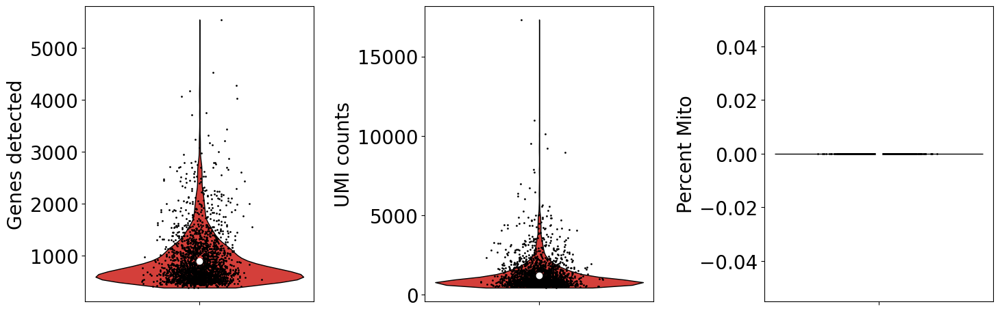

In [150]:
fig, ax = plt.subplots(figsize=(5*3,5), ncols=3)
x1 = adata_1.obs["n_genes"]
x2 = nd(adata_1.X.sum(axis=1))
x3 = adata_1.obs["percent_mito"]
vplot(x1, ax[0])
vplot(x2, ax[1])
vplot(x3, ax[2])
ax[0].set_ylabel("Genes detected")
ax[1].set_ylabel("UMI counts")
ax[2].set_ylabel("Percent Mito")
plt.tight_layout()

## Allele 2 (129)

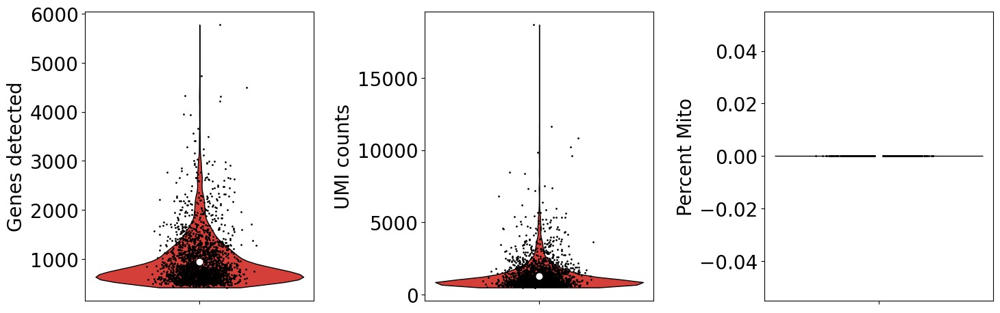

In [151]:
fig, ax = plt.subplots(figsize=(5*3,5), ncols=3)
x1 = adata_2.obs["n_genes"]
x2 = nd(adata_2.X.sum(axis=1))
x3 = adata_2.obs["percent_mito"]
vplot(x1, ax[0])
vplot(x2, ax[1])
vplot(x3, ax[2])
ax[0].set_ylabel("Genes detected")
ax[1].set_ylabel("UMI counts")
ax[2].set_ylabel("Percent Mito")
plt.tight_layout()

# Summary of the anndatas we have

In [128]:
adata # Filtered total anndata

View of AnnData object with n_obs × n_vars = 2428 × 55487
    obs: 'id', 'cell_counts', 'n_genes', 'percent_mito', 'pass_count_filter'
    var: 'gene_id', 'gene_name', 'gene_counts', 'n_cells'

In [129]:
adata_1 # Filtered species 1 (CAST) anndata

View of AnnData object with n_obs × n_vars = 2428 × 55487
    obs: 'id', 'cell_counts', 'n_genes', 'percent_mito'
    var: 'gene_id', 'gene_name', 'gene_counts', 'n_cells'

In [130]:
adata_2 # Filtered species 2 (129) anndata

View of AnnData object with n_obs × n_vars = 2428 × 55487
    obs: 'id', 'cell_counts', 'n_genes', 'percent_mito'
    var: 'gene_id', 'gene_name', 'gene_counts', 'n_cells'

# Plot Xist-related genes for individual RTBCs

## RTBC1-only

### Total

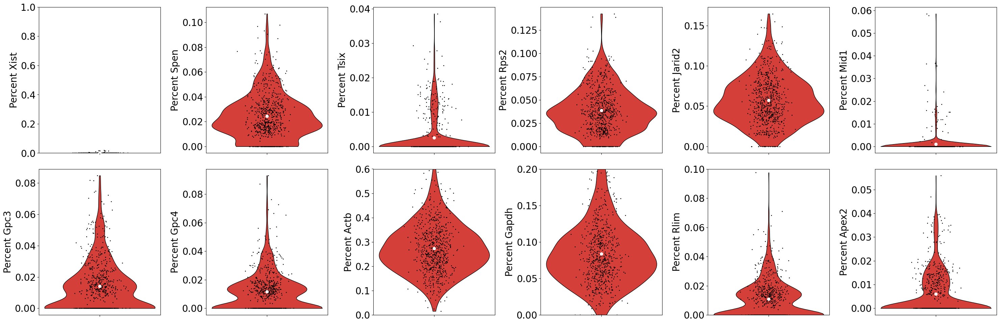

In [131]:
filtered_data = adata[adata.obs['id'].str.endswith('[RTBC1]')].copy()
adata_ = filtered_data.copy()

# List of genes

gene1 = 'Xist'
gene2 = 'Spen'
gene3 = 'Tsix'
gene4 = 'Rps2'
gene5 = 'Jarid2'
gene6 = 'Mid1'
gene7 = 'Gpc3'
gene8 = 'Gpc4'
gene9 = 'Actb'
gene10 = 'Gapdh'
gene11 = 'Rlim'
gene12 = 'Apex2'

fig, ax = plt.subplots(figsize=(5*6,5*2), ncols=6, nrows=1*2)
x1 = np.squeeze(np.asarray((adata_[:,gene1].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x2 = np.squeeze(np.asarray((adata_[:,gene2].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x3 = np.squeeze(np.asarray((adata_[:,gene3].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x4 = np.squeeze(np.asarray((adata_[:,gene4].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x5 = np.squeeze(np.asarray((adata_[:,gene5].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x6 = np.squeeze(np.asarray((adata_[:,gene6].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x7 = np.squeeze(np.asarray((adata_[:,gene7].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x8 = np.squeeze(np.asarray((adata_[:,gene8].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x9 = np.squeeze(np.asarray((adata_[:,gene9].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x10 = np.squeeze(np.asarray((adata_[:,gene10].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x11 = np.squeeze(np.asarray((adata_[:,gene11].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x12 = np.squeeze(np.asarray((adata_[:,gene12].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
vplot(x1, ax[0][0])
vplot(x2, ax[0][1])
vplot(x3, ax[0][2])
vplot(x4, ax[0][3])
vplot(x5, ax[0][4])
vplot(x6, ax[0][5])
vplot(x7, ax[1][0])
vplot(x8, ax[1][1])
vplot(x9, ax[1][2])
vplot(x10, ax[1][3])
vplot(x11, ax[1][4])
vplot(x12, ax[1][5])
ax[0][0].set_ylabel("Percent " + gene1)
ax[0][1].set_ylabel("Percent " + gene2)
ax[0][2].set_ylabel("Percent " + gene3)
ax[0][3].set_ylabel("Percent " + gene4)
ax[0][4].set_ylabel("Percent " + gene5)
ax[0][5].set_ylabel("Percent " + gene6)
ax[1][0].set_ylabel("Percent " + gene7)
ax[1][1].set_ylabel("Percent " + gene8)
ax[1][2].set_ylabel("Percent " + gene9)
ax[1][3].set_ylabel("Percent " + gene10)
ax[1][4].set_ylabel("Percent " + gene11)
ax[1][5].set_ylabel("Percent " + gene12)

# Adjust the below to fix the scale on a specific violin

ax[0][0].set_ylim(0,1)
ax[1][3].set_ylim(0,0.2)
ax[1][2].set_ylim(0,0.6)
ax[1][4].set_ylim(0,0.1)

plt.tight_layout()
plt.show()

### Species 1 (CAST)

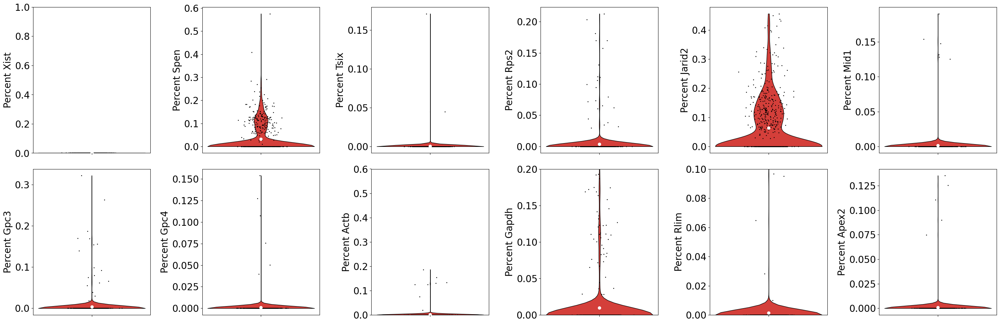

In [132]:
filtered_data = adata_1[adata_1.obs['id'].str.endswith('[RTBC1]')].copy()
adata_ = filtered_data.copy()

# List of genes

gene1 = 'Xist'
gene2 = 'Spen'
gene3 = 'Tsix'
gene4 = 'Rps2'
gene5 = 'Jarid2'
gene6 = 'Mid1'
gene7 = 'Gpc3'
gene8 = 'Gpc4'
gene9 = 'Actb'
gene10 = 'Gapdh'
gene11 = 'Rlim'
gene12 = 'Apex2'

fig, ax = plt.subplots(figsize=(5*6,5*2), ncols=6, nrows=1*2)
x1 = np.squeeze(np.asarray((adata_[:,gene1].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x2 = np.squeeze(np.asarray((adata_[:,gene2].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x3 = np.squeeze(np.asarray((adata_[:,gene3].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x4 = np.squeeze(np.asarray((adata_[:,gene4].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x5 = np.squeeze(np.asarray((adata_[:,gene5].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x6 = np.squeeze(np.asarray((adata_[:,gene6].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x7 = np.squeeze(np.asarray((adata_[:,gene7].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x8 = np.squeeze(np.asarray((adata_[:,gene8].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x9 = np.squeeze(np.asarray((adata_[:,gene9].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x10 = np.squeeze(np.asarray((adata_[:,gene10].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x11 = np.squeeze(np.asarray((adata_[:,gene11].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x12 = np.squeeze(np.asarray((adata_[:,gene12].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
vplot(x1, ax[0][0])
vplot(x2, ax[0][1])
vplot(x3, ax[0][2])
vplot(x4, ax[0][3])
vplot(x5, ax[0][4])
vplot(x6, ax[0][5])
vplot(x7, ax[1][0])
vplot(x8, ax[1][1])
vplot(x9, ax[1][2])
vplot(x10, ax[1][3])
vplot(x11, ax[1][4])
vplot(x12, ax[1][5])
ax[0][0].set_ylabel("Percent " + gene1)
ax[0][1].set_ylabel("Percent " + gene2)
ax[0][2].set_ylabel("Percent " + gene3)
ax[0][3].set_ylabel("Percent " + gene4)
ax[0][4].set_ylabel("Percent " + gene5)
ax[0][5].set_ylabel("Percent " + gene6)
ax[1][0].set_ylabel("Percent " + gene7)
ax[1][1].set_ylabel("Percent " + gene8)
ax[1][2].set_ylabel("Percent " + gene9)
ax[1][3].set_ylabel("Percent " + gene10)
ax[1][4].set_ylabel("Percent " + gene11)
ax[1][5].set_ylabel("Percent " + gene12)

# Adjust the below to fix the scale on a specific violin

ax[0][0].set_ylim(0,1)
ax[1][3].set_ylim(0,0.2)
ax[1][2].set_ylim(0,0.6)
ax[1][4].set_ylim(0,0.1)

plt.tight_layout()
plt.show()

### Species 2 (129)

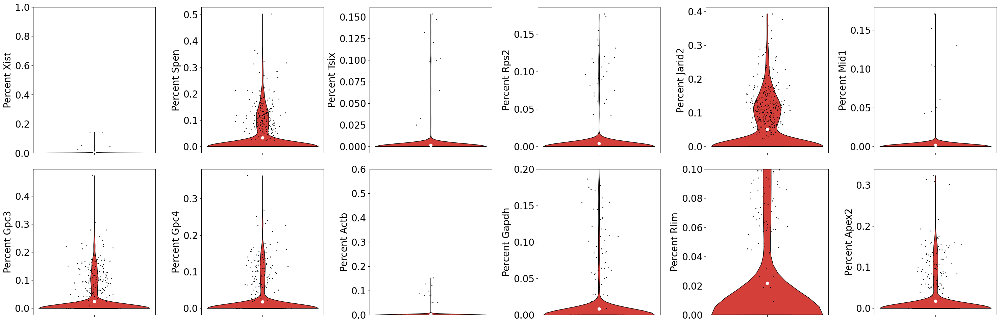

In [133]:
filtered_data = adata_2[adata_2.obs['id'].str.endswith('[RTBC1]')].copy()
adata_ = filtered_data.copy()

# List of genes

gene1 = 'Xist'
gene2 = 'Spen'
gene3 = 'Tsix'
gene4 = 'Rps2'
gene5 = 'Jarid2'
gene6 = 'Mid1'
gene7 = 'Gpc3'
gene8 = 'Gpc4'
gene9 = 'Actb'
gene10 = 'Gapdh'
gene11 = 'Rlim'
gene12 = 'Apex2'

fig, ax = plt.subplots(figsize=(5*6,5*2), ncols=6, nrows=1*2)
x1 = np.squeeze(np.asarray((adata_[:,gene1].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x2 = np.squeeze(np.asarray((adata_[:,gene2].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x3 = np.squeeze(np.asarray((adata_[:,gene3].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x4 = np.squeeze(np.asarray((adata_[:,gene4].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x5 = np.squeeze(np.asarray((adata_[:,gene5].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x6 = np.squeeze(np.asarray((adata_[:,gene6].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x7 = np.squeeze(np.asarray((adata_[:,gene7].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x8 = np.squeeze(np.asarray((adata_[:,gene8].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x9 = np.squeeze(np.asarray((adata_[:,gene9].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x10 = np.squeeze(np.asarray((adata_[:,gene10].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x11 = np.squeeze(np.asarray((adata_[:,gene11].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x12 = np.squeeze(np.asarray((adata_[:,gene12].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
vplot(x1, ax[0][0])
vplot(x2, ax[0][1])
vplot(x3, ax[0][2])
vplot(x4, ax[0][3])
vplot(x5, ax[0][4])
vplot(x6, ax[0][5])
vplot(x7, ax[1][0])
vplot(x8, ax[1][1])
vplot(x9, ax[1][2])
vplot(x10, ax[1][3])
vplot(x11, ax[1][4])
vplot(x12, ax[1][5])
ax[0][0].set_ylabel("Percent " + gene1)
ax[0][1].set_ylabel("Percent " + gene2)
ax[0][2].set_ylabel("Percent " + gene3)
ax[0][3].set_ylabel("Percent " + gene4)
ax[0][4].set_ylabel("Percent " + gene5)
ax[0][5].set_ylabel("Percent " + gene6)
ax[1][0].set_ylabel("Percent " + gene7)
ax[1][1].set_ylabel("Percent " + gene8)
ax[1][2].set_ylabel("Percent " + gene9)
ax[1][3].set_ylabel("Percent " + gene10)
ax[1][4].set_ylabel("Percent " + gene11)
ax[1][5].set_ylabel("Percent " + gene12)

# Adjust the below to fix the scale on a specific violin

ax[0][0].set_ylim(0,1)
ax[1][3].set_ylim(0,0.2)
ax[1][2].set_ylim(0,0.6)
ax[1][4].set_ylim(0,0.1)

plt.tight_layout()
plt.show()

## RTBC2 through RTBC6

### Total

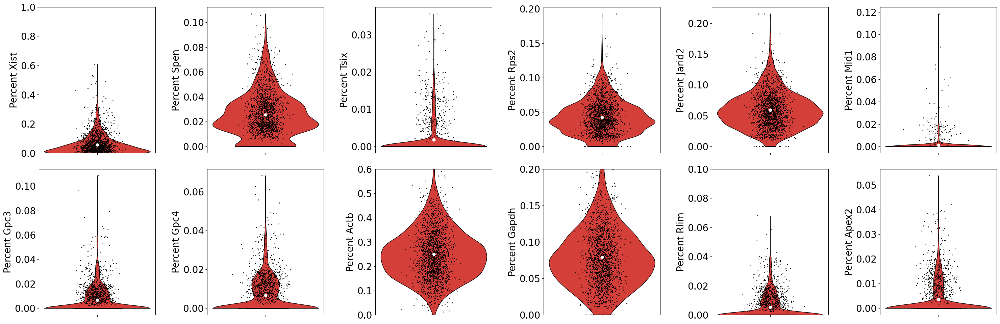

In [136]:
filtered_data = adata.copy()

# Can omit the next few lines if want to use everything
filter_for_tags = "RTBC2,RTBC3,RTBC4,RTBC5,RTBC6"
filter_for_tags_final = ['[' + item + ']' for item in filter_for_tags.split(',')]
if filter_for_tags.strip():
    final = []
    for tag in filter_for_tags_final:
        final.extend([x for x in list(np.array(data.obs['id'])) if tag in x])
    filtered_data = filtered_data[filtered_data.obs['id'].isin(final),:]

adata_ = filtered_data.copy()

# List of genes

gene1 = 'Xist'
gene2 = 'Spen'
gene3 = 'Tsix'
gene4 = 'Rps2'
gene5 = 'Jarid2'
gene6 = 'Mid1'
gene7 = 'Gpc3'
gene8 = 'Gpc4'
gene9 = 'Actb'
gene10 = 'Gapdh'
gene11 = 'Rlim'
gene12 = 'Apex2'

fig, ax = plt.subplots(figsize=(5*6,5*2), ncols=6, nrows=1*2)
x1 = np.squeeze(np.asarray((adata_[:,gene1].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x2 = np.squeeze(np.asarray((adata_[:,gene2].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x3 = np.squeeze(np.asarray((adata_[:,gene3].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x4 = np.squeeze(np.asarray((adata_[:,gene4].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x5 = np.squeeze(np.asarray((adata_[:,gene5].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x6 = np.squeeze(np.asarray((adata_[:,gene6].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x7 = np.squeeze(np.asarray((adata_[:,gene7].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x8 = np.squeeze(np.asarray((adata_[:,gene8].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x9 = np.squeeze(np.asarray((adata_[:,gene9].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x10 = np.squeeze(np.asarray((adata_[:,gene10].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x11 = np.squeeze(np.asarray((adata_[:,gene11].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x12 = np.squeeze(np.asarray((adata_[:,gene12].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
vplot(x1, ax[0][0])
vplot(x2, ax[0][1])
vplot(x3, ax[0][2])
vplot(x4, ax[0][3])
vplot(x5, ax[0][4])
vplot(x6, ax[0][5])
vplot(x7, ax[1][0])
vplot(x8, ax[1][1])
vplot(x9, ax[1][2])
vplot(x10, ax[1][3])
vplot(x11, ax[1][4])
vplot(x12, ax[1][5])
ax[0][0].set_ylabel("Percent " + gene1)
ax[0][1].set_ylabel("Percent " + gene2)
ax[0][2].set_ylabel("Percent " + gene3)
ax[0][3].set_ylabel("Percent " + gene4)
ax[0][4].set_ylabel("Percent " + gene5)
ax[0][5].set_ylabel("Percent " + gene6)
ax[1][0].set_ylabel("Percent " + gene7)
ax[1][1].set_ylabel("Percent " + gene8)
ax[1][2].set_ylabel("Percent " + gene9)
ax[1][3].set_ylabel("Percent " + gene10)
ax[1][4].set_ylabel("Percent " + gene11)
ax[1][5].set_ylabel("Percent " + gene12)

# Adjust the below to fix the scale on a specific violin

ax[0][0].set_ylim(0,1)
ax[1][3].set_ylim(0,0.2)
ax[1][2].set_ylim(0,0.6)
ax[1][4].set_ylim(0,0.1)

plt.tight_layout()
plt.show()

### Species 1 (CAST)

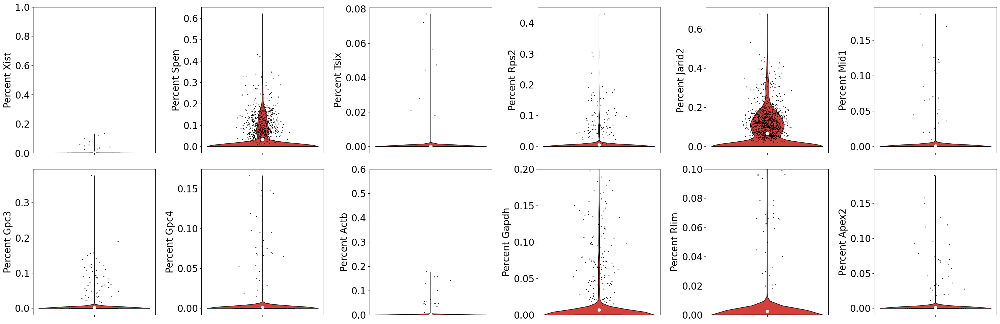

In [137]:
filtered_data = adata_1.copy()

# Can omit the next few lines if want to use everything
filter_for_tags = "RTBC2,RTBC3,RTBC4,RTBC5,RTBC6"
filter_for_tags_final = ['[' + item + ']' for item in filter_for_tags.split(',')]
if filter_for_tags.strip():
    final = []
    for tag in filter_for_tags_final:
        final.extend([x for x in list(np.array(data.obs['id'])) if tag in x])
    filtered_data = filtered_data[filtered_data.obs['id'].isin(final),:]

adata_ = filtered_data.copy()

# List of genes

gene1 = 'Xist'
gene2 = 'Spen'
gene3 = 'Tsix'
gene4 = 'Rps2'
gene5 = 'Jarid2'
gene6 = 'Mid1'
gene7 = 'Gpc3'
gene8 = 'Gpc4'
gene9 = 'Actb'
gene10 = 'Gapdh'
gene11 = 'Rlim'
gene12 = 'Apex2'

fig, ax = plt.subplots(figsize=(5*6,5*2), ncols=6, nrows=1*2)
x1 = np.squeeze(np.asarray((adata_[:,gene1].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x2 = np.squeeze(np.asarray((adata_[:,gene2].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x3 = np.squeeze(np.asarray((adata_[:,gene3].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x4 = np.squeeze(np.asarray((adata_[:,gene4].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x5 = np.squeeze(np.asarray((adata_[:,gene5].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x6 = np.squeeze(np.asarray((adata_[:,gene6].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x7 = np.squeeze(np.asarray((adata_[:,gene7].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x8 = np.squeeze(np.asarray((adata_[:,gene8].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x9 = np.squeeze(np.asarray((adata_[:,gene9].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x10 = np.squeeze(np.asarray((adata_[:,gene10].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x11 = np.squeeze(np.asarray((adata_[:,gene11].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x12 = np.squeeze(np.asarray((adata_[:,gene12].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
vplot(x1, ax[0][0])
vplot(x2, ax[0][1])
vplot(x3, ax[0][2])
vplot(x4, ax[0][3])
vplot(x5, ax[0][4])
vplot(x6, ax[0][5])
vplot(x7, ax[1][0])
vplot(x8, ax[1][1])
vplot(x9, ax[1][2])
vplot(x10, ax[1][3])
vplot(x11, ax[1][4])
vplot(x12, ax[1][5])
ax[0][0].set_ylabel("Percent " + gene1)
ax[0][1].set_ylabel("Percent " + gene2)
ax[0][2].set_ylabel("Percent " + gene3)
ax[0][3].set_ylabel("Percent " + gene4)
ax[0][4].set_ylabel("Percent " + gene5)
ax[0][5].set_ylabel("Percent " + gene6)
ax[1][0].set_ylabel("Percent " + gene7)
ax[1][1].set_ylabel("Percent " + gene8)
ax[1][2].set_ylabel("Percent " + gene9)
ax[1][3].set_ylabel("Percent " + gene10)
ax[1][4].set_ylabel("Percent " + gene11)
ax[1][5].set_ylabel("Percent " + gene12)

# Adjust the below to fix the scale on a specific violin

ax[0][0].set_ylim(0,1)
ax[1][3].set_ylim(0,0.2)
ax[1][2].set_ylim(0,0.6)
ax[1][4].set_ylim(0,0.1)

plt.tight_layout()
plt.show()

### Species 2 (129)

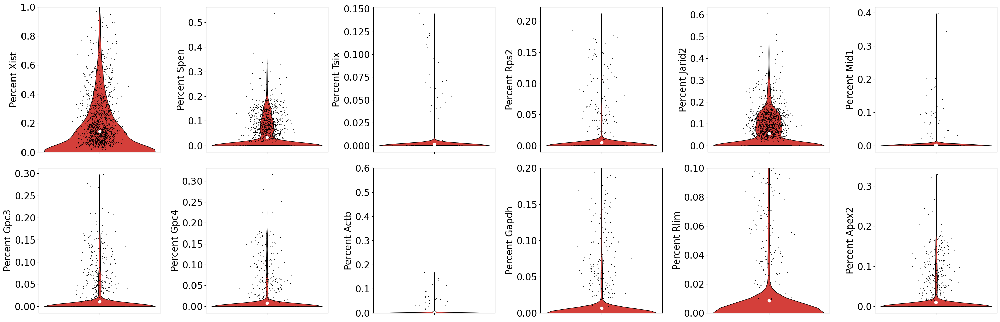

In [138]:
filtered_data = adata_2.copy()

# Can omit the next few lines if want to use everything
filter_for_tags = "RTBC2,RTBC3,RTBC4,RTBC5,RTBC6"
filter_for_tags_final = ['[' + item + ']' for item in filter_for_tags.split(',')]
if filter_for_tags.strip():
    final = []
    for tag in filter_for_tags_final:
        final.extend([x for x in list(np.array(data.obs['id'])) if tag in x])
    filtered_data = filtered_data[filtered_data.obs['id'].isin(final),:]

adata_ = filtered_data.copy()

# List of genes

gene1 = 'Xist'
gene2 = 'Spen'
gene3 = 'Tsix'
gene4 = 'Rps2'
gene5 = 'Jarid2'
gene6 = 'Mid1'
gene7 = 'Gpc3'
gene8 = 'Gpc4'
gene9 = 'Actb'
gene10 = 'Gapdh'
gene11 = 'Rlim'
gene12 = 'Apex2'

fig, ax = plt.subplots(figsize=(5*6,5*2), ncols=6, nrows=1*2)
x1 = np.squeeze(np.asarray((adata_[:,gene1].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x2 = np.squeeze(np.asarray((adata_[:,gene2].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x3 = np.squeeze(np.asarray((adata_[:,gene3].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x4 = np.squeeze(np.asarray((adata_[:,gene4].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x5 = np.squeeze(np.asarray((adata_[:,gene5].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x6 = np.squeeze(np.asarray((adata_[:,gene6].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x7 = np.squeeze(np.asarray((adata_[:,gene7].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x8 = np.squeeze(np.asarray((adata_[:,gene8].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x9 = np.squeeze(np.asarray((adata_[:,gene9].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x10 = np.squeeze(np.asarray((adata_[:,gene10].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x11 = np.squeeze(np.asarray((adata_[:,gene11].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
x12 = np.squeeze(np.asarray((adata_[:,gene12].X.sum(axis=1)/adata_.X.sum(axis=1)*100)))
vplot(x1, ax[0][0])
vplot(x2, ax[0][1])
vplot(x3, ax[0][2])
vplot(x4, ax[0][3])
vplot(x5, ax[0][4])
vplot(x6, ax[0][5])
vplot(x7, ax[1][0])
vplot(x8, ax[1][1])
vplot(x9, ax[1][2])
vplot(x10, ax[1][3])
vplot(x11, ax[1][4])
vplot(x12, ax[1][5])
ax[0][0].set_ylabel("Percent " + gene1)
ax[0][1].set_ylabel("Percent " + gene2)
ax[0][2].set_ylabel("Percent " + gene3)
ax[0][3].set_ylabel("Percent " + gene4)
ax[0][4].set_ylabel("Percent " + gene5)
ax[0][5].set_ylabel("Percent " + gene6)
ax[1][0].set_ylabel("Percent " + gene7)
ax[1][1].set_ylabel("Percent " + gene8)
ax[1][2].set_ylabel("Percent " + gene9)
ax[1][3].set_ylabel("Percent " + gene10)
ax[1][4].set_ylabel("Percent " + gene11)
ax[1][5].set_ylabel("Percent " + gene12)

# Adjust the below to fix the scale on a specific violin

ax[0][0].set_ylim(0,1)
ax[1][3].set_ylim(0,0.2)
ax[1][2].set_ylim(0,0.6)
ax[1][4].set_ylim(0,0.1)

plt.tight_layout()
plt.show()

## Allele scatter plots for individual genes

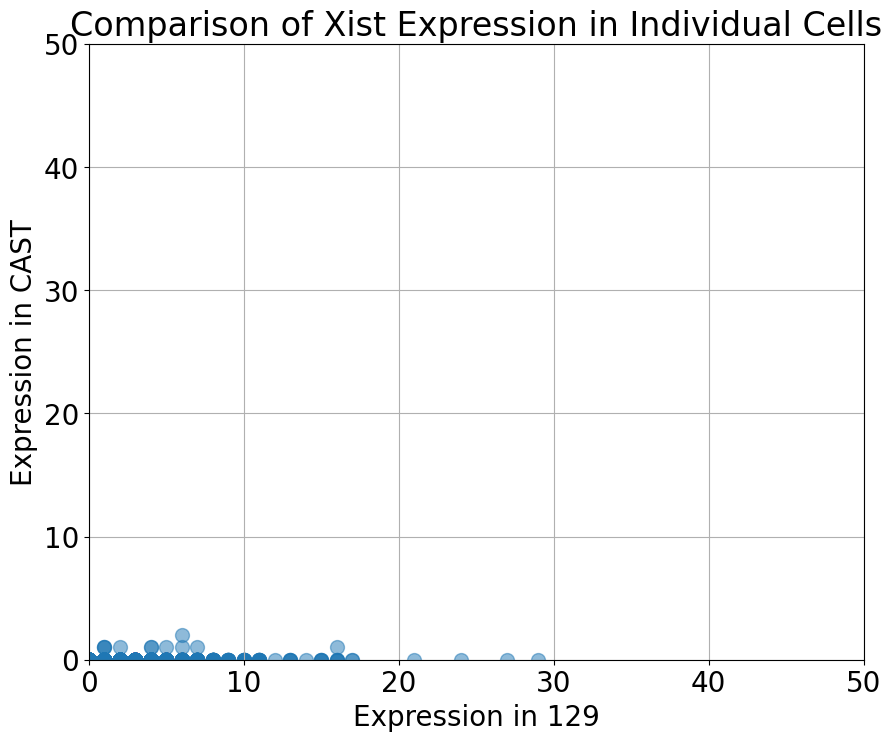

In [143]:
gene="Xist"
allele_data_1 = adata_1[:, gene].X.toarray().flatten()
allele_data_2 = adata_2[:, gene].X.toarray().flatten()

# Create a scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(allele_data_2, allele_data_1, alpha=0.5, s=100)  # alpha for transparency
plt.title('Comparison of ' + gene + ' Expression in Individual Cells')
plt.xlabel('Expression in 129')
plt.ylabel('Expression in CAST')
plt.grid(True)
plt.ylim(0,50)
plt.xlim(0,50)
plt.show()


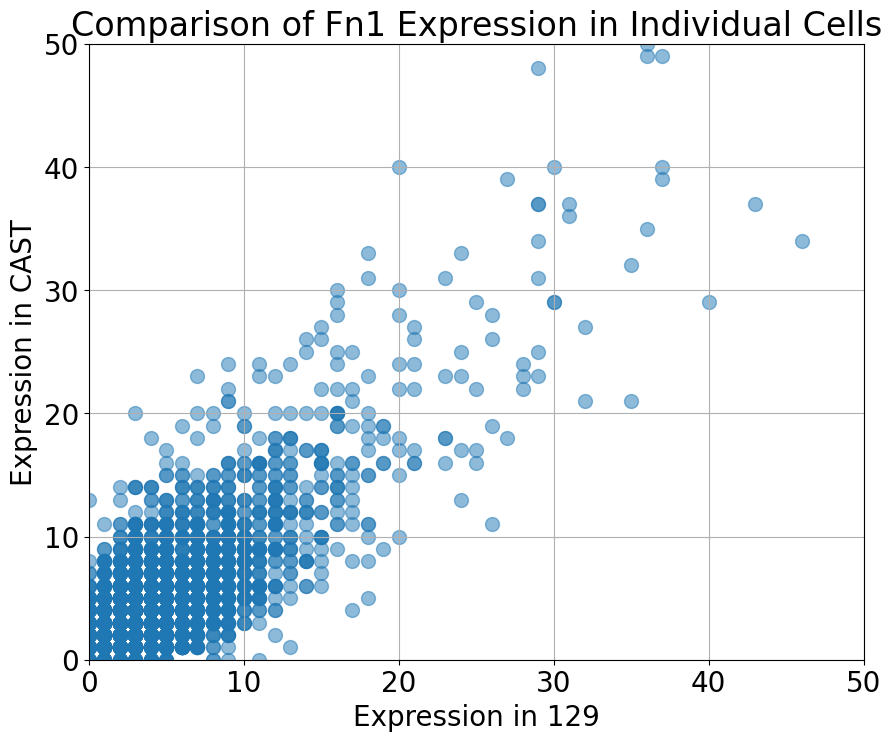

In [144]:
gene="Fn1"
allele_data_1 = adata_1[:, gene].X.toarray().flatten()
allele_data_2 = adata_2[:, gene].X.toarray().flatten()

# Create a scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(allele_data_2, allele_data_1, alpha=0.5, s=100)  # alpha for transparency
plt.title('Comparison of ' + gene + ' Expression in Individual Cells')
plt.xlabel('Expression in 129')
plt.ylabel('Expression in CAST')
plt.grid(True)
plt.ylim(0,50)
plt.xlim(0,50)
plt.show()


# Highly variable genes for the total AnnData

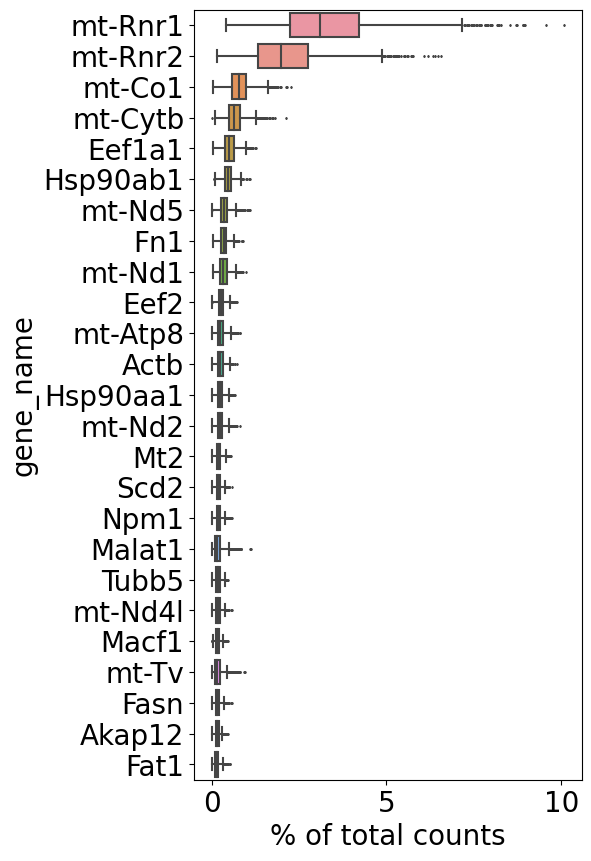

In [149]:
fig, ax = plt.subplots(figsize=(5, 10))
sc.pl.highest_expr_genes(adata, n_top=25, ax = ax, gene_symbols="gene_name")

## Scatter plot of pair-wise gene expression (normalized as counts per million) in total AnnData

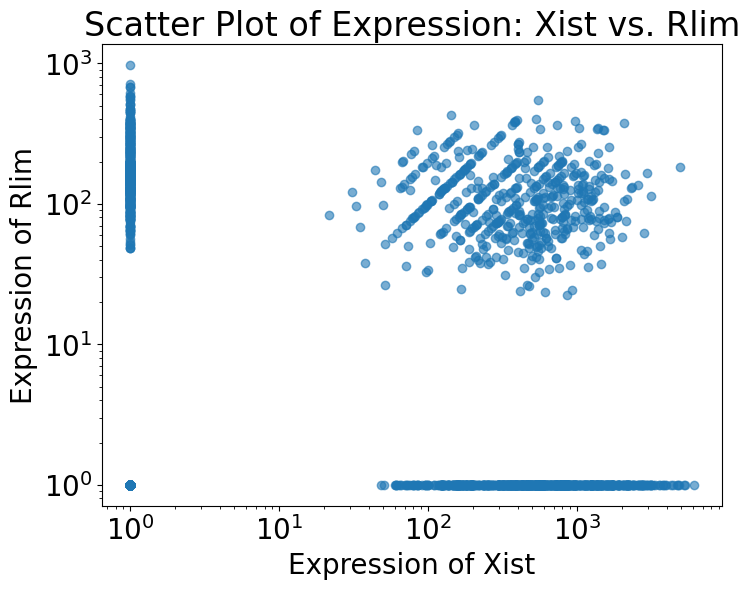

In [160]:
_xdata = adata.copy()
gene_x = 'Xist'
gene_y = 'Rlim'

cpm_matrix = _xdata.X.copy()


if scipy.sparse.issparse(_xdata.X):
    total_counts_per_cell = np.array(_xdata.X.sum(axis=1)).flatten()
else:
    total_counts_per_cell = _xdata.X.sum(axis=1)

total_counts_per_cell[total_counts_per_cell == 0] = np.nan

# Step 2 and 3: Normalize counts to CPM

if scipy.sparse.issparse(cpm_matrix):
    # For sparse matrix, perform operation without densifying the whole matrix
    cpm_matrix = scipy.sparse.csr_matrix(cpm_matrix)
    cpm_matrix.data = cpm_matrix.data / np.repeat(total_counts_per_cell, np.diff(cpm_matrix.indptr)) * 1e6
else:
    # For dense matrix
    cpm_matrix = (cpm_matrix / total_counts_per_cell[:, None]) * 1e6

# Update xdata.X with the normalized CPM values
_xdata.X = cpm_matrix

# Extract expression values for the two genes
# This assumes that gene names are stored in adata.var_names
if scipy.sparse.issparse(_xdata.X):
    # Convert to dense format if the data is stored as a sparse matrix
    X_dense = _xdata.X.toarray()
else:
    X_dense = _xdata.X

# Extracting gene indices
gene_x_idx = np.where(_xdata.var_names == gene_x)[0][0]
gene_y_idx = np.where(_xdata.var_names == gene_y)[0][0]

# Extracting expression values for each gene
expression_x = X_dense[:, gene_x_idx]
expression_y = X_dense[:, gene_y_idx]

# Creating the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(expression_x+1, expression_y+1, alpha=0.6)

plt.title(f'Scatter Plot of Expression: {gene_x} vs. {gene_y}')
plt.xlabel(f'Expression of {gene_x}')
plt.ylabel(f'Expression of {gene_y}')
plt.xscale('log')
plt.yscale('log')
plt.show()


# Heatmap of select genes ordered by Xist expression in total AnnData

(31, 2428)


<Figure size 1200x1400 with 0 Axes>

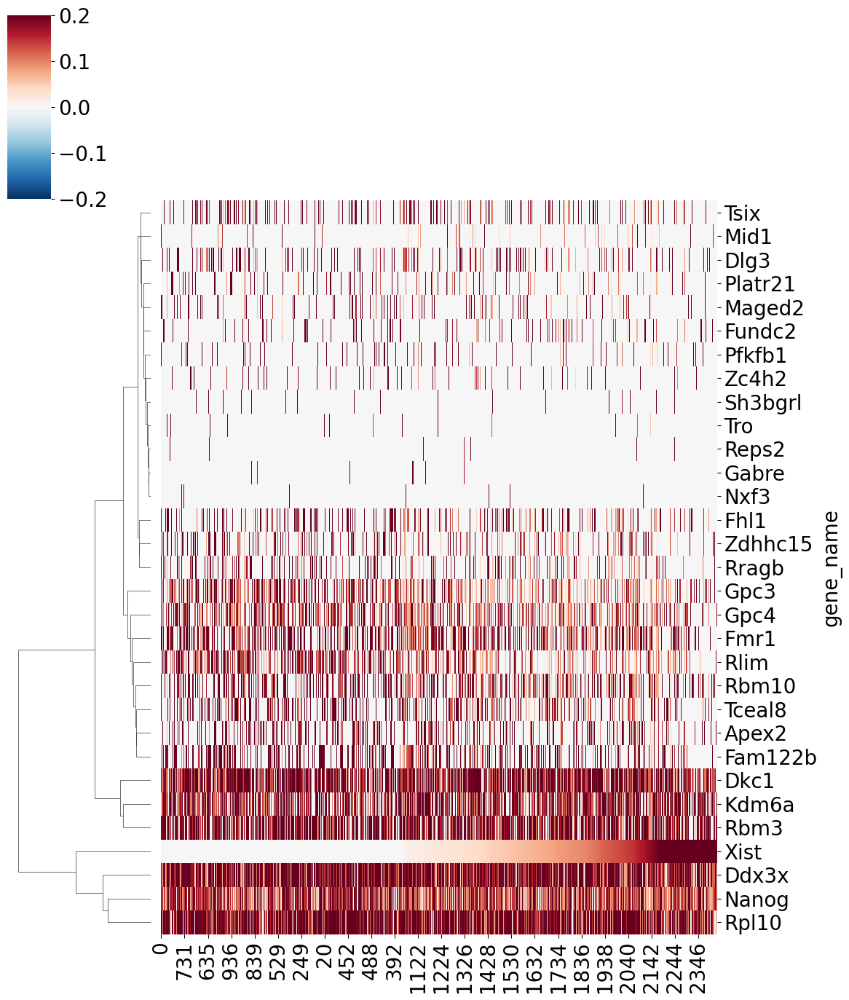

In [158]:
_xdata = adata.copy()
genes_to_keep = ['Xist','Nanog','Kdm6a','Dkc1','Rbm3','Rpl10','Mid1','Rbm10',
                 'Fmr1','Ddx3x','Platr21','Gabre','Pfkfb1','Tsix','Sh3bgrl','Apex2',
                 'Tro','Fhl1','Fam122b','Maged2','Zdhhc15','Reps2','Nxf3','Fundc2','Rragb',
                 'Gpc3','Dlg3','Tceal8','Zc4h2','Gpc4','Rlim']
gene_indices = [_xdata.var_names.get_loc(gene) for gene in genes_to_keep]


if scipy.sparse.issparse(_xdata.X):
    total_counts_per_cell = np.array(_xdata.X.sum(axis=1)).flatten()
else:
    total_counts_per_cell = _xdata.X.sum(axis=1)

total_counts_per_cell[total_counts_per_cell == 0] = np.nan


cpm_matrix = _xdata.X.copy()


# Step 2 and 3: Normalize counts to CPM

if scipy.sparse.issparse(cpm_matrix):
    # For sparse matrix, perform operation without densifying the whole matrix
    cpm_matrix = scipy.sparse.csr_matrix(cpm_matrix)
    cpm_matrix.data = cpm_matrix.data / np.repeat(total_counts_per_cell, np.diff(cpm_matrix.indptr)) * 1e6
else:
    # For dense matrix
    cpm_matrix = (cpm_matrix / total_counts_per_cell[:, None]) * 1e6

# Update xdata.X with the normalized CPM values
_xdata.X = cpm_matrix


# Subset the AnnData object to only include the selected genes
_xdata = _xdata[:, gene_indices]
non_zero_genes = np.array(_xdata.X.T.toarray().sum(axis=1)).flatten() >= 15

xist_gene_expression = _xdata[:, _xdata.var['gene_name'] == 'Xist'].X
if scipy.sparse.issparse(xist_gene_expression):
    xist_gene_expression = xist_gene_expression.toarray().flatten()
else:
    xist_gene_expression = xist_gene_expression.flatten()

# Step 2: Order the cells by "Xist" expression (from low to high)
ordered_cell_indices = np.argsort(xist_gene_expression)

xdata_ordered = _xdata[ordered_cell_indices, non_zero_genes] # non_zero_genes

_xdata = xdata_ordered

xist__expression = _xdata[:, 'Xist'].X  # Extracts the expression values of Xist across all barcodes/cells

# Identify the indices where Xist expression is not zero
#non_zero_xist_indices = xist__expression.nonzero()[0]

# Filter the AnnData object to keep only those barcodes/cells
#adata_filtered = _xdata[non_zero_xist_indices, :]
#xdata_ordered = adata_filtered

# 

# Convert the ordered expression data to a dense DataFrame for plotting
if scipy.sparse.issparse(xdata_ordered.X):
    expr_matrix_dense = xdata_ordered.X.toarray()
else:
    expr_matrix_dense = xdata_ordered.X

genes = xdata_ordered.var['gene_name']
cells = np.array(range(xdata_ordered.n_obs))

#expr_matrix_dense = np.log2(expr_matrix_dense + 1)

z_scores_matrix = zscore(expr_matrix_dense, axis=1)

# Some genes might have constant expression across all cells leading to NaN values in z-scores
# You can handle NaN values as needed, for example, by replacing them with 0
z_scores_matrix = np.nan_to_num(z_scores_matrix)

# Creating a DataFrame with gene names as rows and cells as columns
df_expr = pd.DataFrame(z_scores_matrix.T, index=genes, columns=cells)
df_expr2 = pd.DataFrame(expr_matrix_dense.T, index=genes, columns=cells)


gene_distances = pdist(df_expr, metric='euclidean')

# Perform hierarchical clustering using the Ward method
gene_linkage = linkage(gene_distances, method='ward')

print(df_expr.shape)

max_abs_value = np.abs(df_expr.values).max()


# Step 4: Plot the heatmap
plt.figure(figsize=(12, 14))
#sns.heatmap(df_expr, cmap='viridis', yticklabels=True)
g = sns.clustermap(df_expr2.T.sort_values(by='Xist').T, cmap='RdBu_r', cbar=True,
                   center=0, vmin=-0.2, vmax=0.2, standard_scale=0,
                   row_linkage=gene_linkage, col_cluster=False, figsize=(12, 14), yticklabels=True)
#plt.title('Gene Expression Heatmap Ordered by Xist Expression')
#plt.xlabel('Cells Ordered by Xist Expression')
#plt.ylabel('Genes')
plt.show()


# Heatmap of select genes ordered by RTBC1-6 then by Xist expression in total AnnData

(31, 2428)


<Figure size 1200x1400 with 0 Axes>

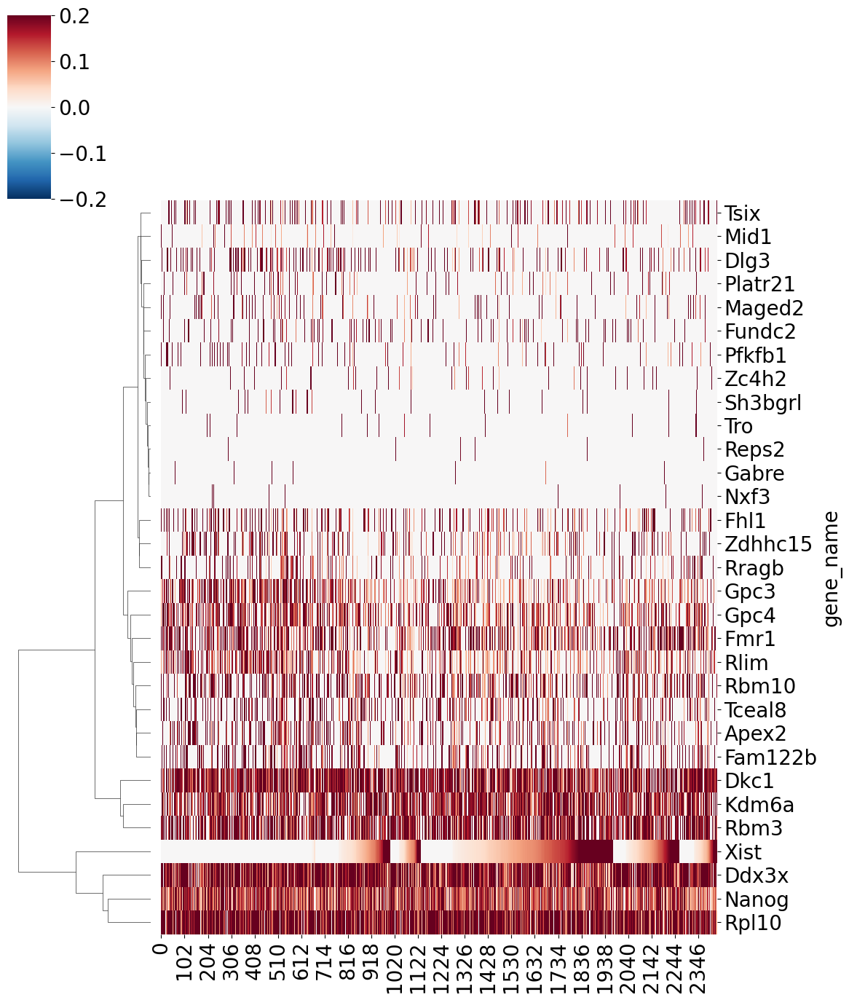

In [162]:
_xdata = adata.copy()
genes_to_keep = ['Xist','Nanog','Kdm6a','Dkc1','Rbm3','Rpl10','Mid1','Rbm10',
                 'Fmr1','Ddx3x','Platr21','Gabre','Pfkfb1','Tsix','Sh3bgrl','Apex2',
                 'Tro','Fhl1','Fam122b','Maged2','Zdhhc15','Reps2','Nxf3','Fundc2','Rragb',
                 'Gpc3','Dlg3','Tceal8','Zc4h2','Gpc4','Rlim']
gene_indices = [_xdata.var_names.get_loc(gene) for gene in genes_to_keep]


if scipy.sparse.issparse(_xdata.X):
    total_counts_per_cell = np.array(_xdata.X.sum(axis=1)).flatten()
else:
    total_counts_per_cell = _xdata.X.sum(axis=1)

total_counts_per_cell[total_counts_per_cell == 0] = np.nan


cpm_matrix = _xdata.X.copy()


# Step 2 and 3: Normalize counts to CPM

if scipy.sparse.issparse(cpm_matrix):
    # For sparse matrix, perform operation without densifying the whole matrix
    cpm_matrix = scipy.sparse.csr_matrix(cpm_matrix)
    cpm_matrix.data = cpm_matrix.data / np.repeat(total_counts_per_cell, np.diff(cpm_matrix.indptr)) * 1e6
else:
    # For dense matrix
    cpm_matrix = (cpm_matrix / total_counts_per_cell[:, None]) * 1e6

# Update xdata.X with the normalized CPM values
_xdata.X = cpm_matrix


# Subset the AnnData object to only include the selected genes
_xdata = _xdata[:, gene_indices]
non_zero_genes = np.array(_xdata.X.T.toarray().sum(axis=1)).flatten() >= 15

xist_gene_expression = _xdata[:, _xdata.var['gene_name'] == 'Xist'].X
if scipy.sparse.issparse(xist_gene_expression):
    xist_gene_expression = xist_gene_expression.toarray().flatten()
else:
    xist_gene_expression = xist_gene_expression.flatten()

# Step 2: Order the cells by "Xist" expression (from low to high)
ordered_cell_indices = np.argsort(xist_gene_expression)

xdata_ordered = _xdata[ordered_cell_indices, non_zero_genes] # non_zero_genes

_xdata = xdata_ordered

xist__expression = _xdata[:, 'Xist'].X  # Extracts the expression values of Xist across all barcodes/cells

# Identify the indices where Xist expression is not zero
#non_zero_xist_indices = xist__expression.nonzero()[0]

# Filter the AnnData object to keep only those barcodes/cells
#adata_filtered = _xdata[non_zero_xist_indices, :]
#xdata_ordered = adata_filtered

# TODO: Filter further!!
xdata_ordered1 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC1]')].copy()
xdata_ordered2 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC2]')].copy()
xdata_ordered3 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC3]')].copy()
xdata_ordered4 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC4]')].copy()
xdata_ordered5 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC5]')].copy()
xdata_ordered6 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC6]')].copy()

adata_combined = xdata_ordered1.copy()
adata_combined = anndata.concat([adata_combined, xdata_ordered2], axis=0, join='outer', merge='same')
adata_combined = anndata.concat([adata_combined, xdata_ordered3], axis=0, join='outer', merge='same')
adata_combined = anndata.concat([adata_combined, xdata_ordered4], axis=0, join='outer', merge='same')
adata_combined = anndata.concat([adata_combined, xdata_ordered5], axis=0, join='outer', merge='same')
adata_combined = anndata.concat([adata_combined, xdata_ordered6], axis=0, join='outer', merge='same')

xdata_ordered = adata_combined.copy()

#xdata_ordered = xdata_ordered1
# 

# Convert the ordered expression data to a dense DataFrame for plotting
if scipy.sparse.issparse(xdata_ordered.X):
    expr_matrix_dense = xdata_ordered.X.toarray()
else:
    expr_matrix_dense = xdata_ordered.X

genes = xdata_ordered.var['gene_name']
cells = np.array(range(xdata_ordered.n_obs))

#expr_matrix_dense = np.log2(expr_matrix_dense + 1)

z_scores_matrix = zscore(expr_matrix_dense, axis=1)

# Some genes might have constant expression across all cells leading to NaN values in z-scores
# You can handle NaN values as needed, for example, by replacing them with 0
z_scores_matrix = np.nan_to_num(z_scores_matrix)

# Creating a DataFrame with gene names as rows and cells as columns
df_expr = pd.DataFrame(z_scores_matrix.T, index=genes, columns=cells)
df_expr2 = pd.DataFrame(expr_matrix_dense.T, index=genes, columns=cells)


gene_distances = pdist(df_expr, metric='euclidean')

# Perform hierarchical clustering using the Ward method
gene_linkage = linkage(gene_distances, method='ward')

print(df_expr.shape)

max_abs_value = np.abs(df_expr.values).max()


# Step 4: Plot the heatmap
plt.figure(figsize=(12, 14))
#sns.heatmap(df_expr, cmap='viridis', yticklabels=True)
g = sns.clustermap(df_expr2, cmap='RdBu_r', cbar=True,
                   center=0, vmin=-0.2, vmax=0.2, standard_scale=0,
                   row_linkage=gene_linkage, col_cluster=False, figsize=(12, 14), yticklabels=True)
#plt.title('Gene Expression Heatmap Ordered by Xist Expression')
#plt.xlabel('Cells Ordered by Xist Expression')
#plt.ylabel('Genes')
plt.show()


# Hierarchical clustered heatmap of selected genes in total AnnData

(31, 2428)


<Figure size 1200x1400 with 0 Axes>

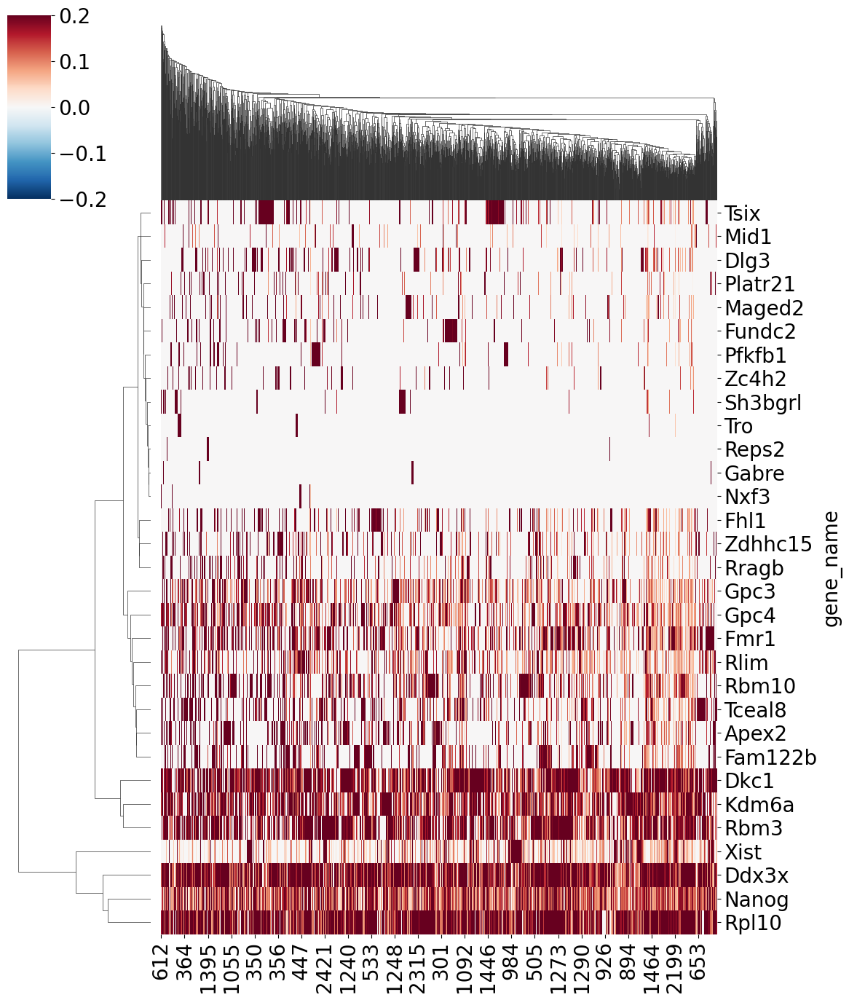

In [164]:
#filtered_data = data[data.obs['id'].str.endswith('[RTBC1]')].copy()
_xdata = adata.copy()
genes_to_keep = ['Xist','Nanog','Kdm6a','Dkc1','Rbm3','Rpl10','Mid1','Rbm10',
                 'Fmr1','Ddx3x','Platr21','Gabre','Pfkfb1','Tsix','Sh3bgrl','Apex2',
                 'Tro','Fhl1','Fam122b','Maged2','Zdhhc15','Reps2','Nxf3','Fundc2','Rragb',
                 'Gpc3','Dlg3','Tceal8','Zc4h2','Gpc4','Rlim']
gene_indices = [_xdata.var_names.get_loc(gene) for gene in genes_to_keep]


if scipy.sparse.issparse(_xdata.X):
    total_counts_per_cell = np.array(_xdata.X.sum(axis=1)).flatten()
else:
    total_counts_per_cell = _xdata.X.sum(axis=1)

total_counts_per_cell[total_counts_per_cell == 0] = np.nan


cpm_matrix = _xdata.X.copy()


# Step 2 and 3: Normalize counts to CPM

if scipy.sparse.issparse(cpm_matrix):
    # For sparse matrix, perform operation without densifying the whole matrix
    cpm_matrix = scipy.sparse.csr_matrix(cpm_matrix)
    cpm_matrix.data = cpm_matrix.data / np.repeat(total_counts_per_cell, np.diff(cpm_matrix.indptr)) * 1e6
else:
    # For dense matrix
    cpm_matrix = (cpm_matrix / total_counts_per_cell[:, None]) * 1e6

# Update xdata.X with the normalized CPM values
_xdata.X = cpm_matrix


# Subset the AnnData object to only include the selected genes
_xdata = _xdata[:, gene_indices]
non_zero_genes = np.array(_xdata.X.T.toarray().sum(axis=1)).flatten() >= 15

xist_gene_expression = _xdata[:, _xdata.var['gene_name'] == 'Xist'].X
if scipy.sparse.issparse(xist_gene_expression):
    xist_gene_expression = xist_gene_expression.toarray().flatten()
else:
    xist_gene_expression = xist_gene_expression.flatten()

# Step 2: Order the cells by "Xist" expression (from low to high)
ordered_cell_indices = np.argsort(xist_gene_expression)

xdata_ordered = _xdata[ordered_cell_indices, non_zero_genes] # non_zero_genes

_xdata = xdata_ordered

xist__expression = _xdata[:, 'Xist'].X  # Extracts the expression values of Xist across all barcodes/cells

# Identify the indices where Xist expression is not zero
#non_zero_xist_indices = xist__expression.nonzero()[0]

# Filter the AnnData object to keep only those barcodes/cells
#adata_filtered = _xdata[non_zero_xist_indices, :]
#xdata_ordered = adata_filtered

# TODO: Filter further!!
xdata_ordered1 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC1]')].copy()
xdata_ordered2 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC2]')].copy()
xdata_ordered3 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC3]')].copy()
xdata_ordered4 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC4]')].copy()
xdata_ordered5 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC5]')].copy()
xdata_ordered6 = xdata_ordered[xdata_ordered.obs['id'].str.endswith('[RTBC6]')].copy()

adata_combined = xdata_ordered1.copy()
adata_combined = anndata.concat([adata_combined, xdata_ordered2], axis=0, join='outer', merge='same')
adata_combined = anndata.concat([adata_combined, xdata_ordered3], axis=0, join='outer', merge='same')
adata_combined = anndata.concat([adata_combined, xdata_ordered4], axis=0, join='outer', merge='same')
adata_combined = anndata.concat([adata_combined, xdata_ordered5], axis=0, join='outer', merge='same')
adata_combined = anndata.concat([adata_combined, xdata_ordered6], axis=0, join='outer', merge='same')

xdata_ordered = adata_combined.copy()

#xdata_ordered = xdata_ordered1
# 

# Convert the ordered expression data to a dense DataFrame for plotting
if scipy.sparse.issparse(xdata_ordered.X):
    expr_matrix_dense = xdata_ordered.X.toarray()
else:
    expr_matrix_dense = xdata_ordered.X

genes = xdata_ordered.var['gene_name']
cells = np.array(range(xdata_ordered.n_obs))

#expr_matrix_dense = np.log2(expr_matrix_dense + 1)

z_scores_matrix = zscore(expr_matrix_dense, axis=1)

# Some genes might have constant expression across all cells leading to NaN values in z-scores
# You can handle NaN values as needed, for example, by replacing them with 0
z_scores_matrix = np.nan_to_num(z_scores_matrix)

# Creating a DataFrame with gene names as rows and cells as columns
df_expr = pd.DataFrame(z_scores_matrix.T, index=genes, columns=cells)
df_expr2 = pd.DataFrame(expr_matrix_dense.T, index=genes, columns=cells)


gene_distances = pdist(df_expr, metric='euclidean')

# Perform hierarchical clustering using the Ward method
gene_linkage = linkage(gene_distances, method='ward')

print(df_expr.shape)

max_abs_value = np.abs(df_expr.values).max()


# Step 4: Plot the heatmap
plt.figure(figsize=(12, 14))
#sns.heatmap(df_expr, cmap='viridis', yticklabels=True)
g = sns.clustermap(df_expr2, cmap='RdBu_r', cbar=True,
                   center=0, vmin=-0.2, vmax=0.2, standard_scale=0,
                   row_linkage=gene_linkage, col_cluster=True, figsize=(12, 14), yticklabels=True)
#plt.title('Gene Expression Heatmap Ordered by Xist Expression')
#plt.xlabel('Cells Ordered by Xist Expression')
#plt.ylabel('Genes')
plt.show()


# Some scanpy clustering analysis on the total AnnData

In [196]:
_data = adata.copy()
n_top_genes = 250
n_neighbors = 17
state = 42
num_PCA = 50
n_bins = 20
min_genes=200
min_cells=25

In [197]:
random.seed(state)
sc.pp.filter_cells(_data, min_genes=min_genes) # 5
sc.pp.filter_genes(_data, min_cells=min_cells) # 5
flavor="seurat"
_data.layers["raw"] = _data.X
scale_num = 1000000
_data.layers["norm"] = normalize(_data.X, norm="l1", axis=1)*scale_num
_data.layers["log1p"] = np.log1p(_data.layers["norm"])
_data.uns = OrderedDict([("log1p", {"base":None})])
_data.X = _data.layers["log1p"]
sc.pp.highly_variable_genes(_data, n_top_genes=n_top_genes, flavor=flavor, n_bins=n_bins)
hvg_mask = _data.var.highly_variable.values
mat = _data.layers["log1p"].todense()
_data.layers["scale"] = scale(mat, axis=0, with_mean=True, with_std=True, copy=True)
_data.X = _data.layers["scale"]
del mat

In [198]:
X = _data.X[:,hvg_mask]

tsvd = TruncatedSVD(n_components=num_PCA)
_data.obsm["X_pca"] = tsvd.fit_transform(X)

In [199]:
sc.pp.neighbors(_data, n_neighbors=n_neighbors, n_pcs=46, random_state=state)

In [200]:
sc.tl.leiden(_data, random_state=state)

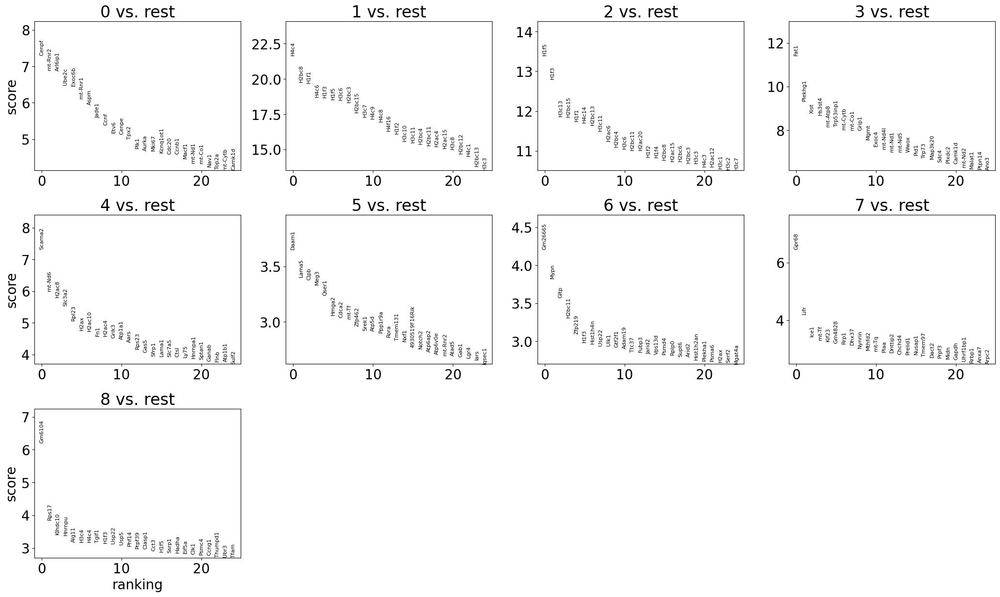

In [201]:
sc.tl.rank_genes_groups(_data, 'leiden', method='wilcoxon', corr_method="bonferroni")
sc.pl.rank_genes_groups(_data, n_genes=25, sharey=False)

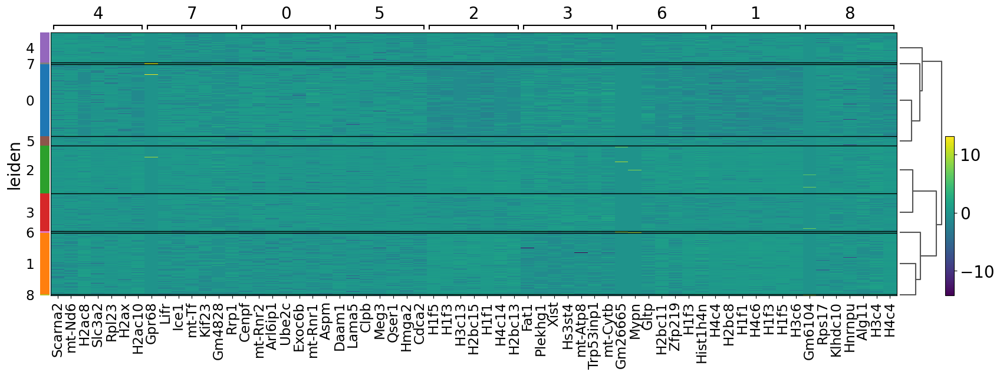

In [202]:
sc.pl.rank_genes_groups_heatmap(_data, n_genes=7, groupby='leiden', key='rank_genes_groups', 
                                show_gene_labels=True, cmap='viridis', figsize=(20, 6), gene_symbols="gene_name")

## Form an Xist-expressing and a non-Xist-expressing cluster

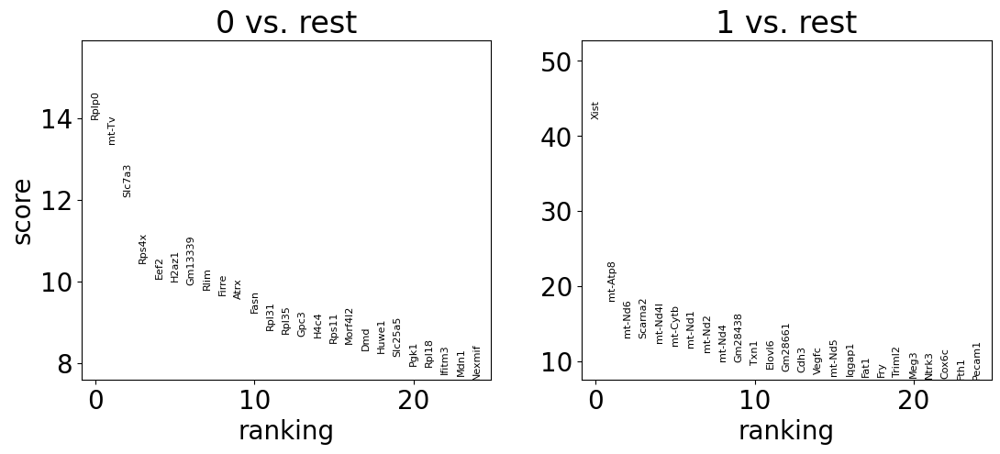

In [203]:
Xist_expression = None
if scipy.sparse.issparse(_data.X):
    Xist_expression = np.array(_data[:, _data.var_names == 'Xist'].X.toarray()).flatten()
else:
    Xist_expression = np.array(_data[:, _data.var_names == 'Xist'].X).flatten()

# Create the binary grouping based on 'Xist' expression, initially as integer
_data.obs['Xist_group'] = (Xist_expression > 0).astype(int)

# Now, convert the 'Xist_group' column to 'category' dtype
_data.obs['Xist_group'] = _data.obs['Xist_group'].astype('category')

# Proceed with differential expression analysis
sc.tl.rank_genes_groups(_data, 'Xist_group', method='wilcoxon', corr_method="bonferroni")

# Plot the differential expression results
sc.pl.rank_genes_groups(_data, n_genes=25, sharey=False)

# Get a table of the mean counts-per-million (CPM) for each gene across all cells for the total AnnData

In [205]:
cpm = adata.X / adata.X.sum(axis=1) * 1e6
cpm_df = pd.DataFrame(cpm, columns=adata.var['gene_name'])
mean_cpm = cpm_df.mean(axis=0)
mean_cpm

gene_name
4933401J01Rik     0.000000
Gm26206           0.000000
Xkr4              2.393476
Gm18956           0.000000
Gm37180           0.000000
                    ...   
CAAA01205117.1    0.000000
CAAA01098150.1    0.000000
CAAA01064564.1    0.000000
Vmn2r122          0.000000
CAAA01147332.1    1.098645
Length: 55487, dtype: float64